# pRF Modeling of Beta Maps and Correlation of Modeled Data (Y hat) to Ground Truth Betas (Y)

Structure of this notebook:
- all_rois = contains all given rois 

## *Part I*

**1. Function definition and execution: “*get_saliency()*” (to load the saliency maps)**
- 1.1- 1.3 Function call “get_saliency()” for one NSD image (for different sources of saliency predcitions (ground truth eye tracking data First-Fixation, All-Fixations, and aredictions according to the saliency model DeepGazeIIE))

**2. Load betas (Y), all ROIs and pRF data from the NSD dataset**
- 2.1 Function definition "*load_betas_concat(roi)*"
- *(Operates for all ROIs and with applied multprocessing for faster execution - the multiprocessing is using the length of rois as length of processors)*
- 2.1.1 Function call *load_betas_concat()* for all ROIs
- 2.2 Function definition and execution *load_prf_data()*
- 2.3 Function definition and execution "*load_all_rois_prf_subject()*"
- *To load all ROIs from the corresponding pRF data with a function call of "load_prf_data()" and apply the selection criteria for valid voxels (r2_values> 0, only consider Voxels that have their pRF in the stim_sz_px + sigma/one standard deviation) to it.*
    - 2.3.1 Transfer **combined_prf_valid_df_subj1** DataFrame to a dictionary **prf_valid_dict_dfs-all_rois** for better accessibility

**3. Computation of K via sequential approach and Einstein summation. Refine the valid voxels criteria to only pick those, where the PDF sums to one.**

- 3.1 Load the pRF data for subject 1
- 3.2 Convert the polar coordinates of eccentricity data to cartesian coordinates of the shared1000 NSD images 
- 3.3 Generate pRF maps for each ROI -- Sequential approach: Slower way sequentially for each voxel 
- 3.4 Apply the Non_Zero_Mask for further selection of the valid voxels in df_valid to load only the beta data (Y) with the valid voxels in the correlation 
- 3.5 Visualization of examples of PDFs for each ROI
- 3.6 Compare K_mat of slower way sequentially processing for each voxel and the K resulting from faster computing via Einstein summation
- 3.7 Summing the probability densities across voxels (generated via Einstein summation) - Visualization

**4. Function definition and execution: “*get_betas_from_numpy()*”**
- *(to load the exact betas for the corresponding time slot, based on the entered ROI)*
- 4.1 Function call ”*get_betas_from_numpy()*”
- *Load the three corresponding betas of one participant and calculate the mean beta map*
- 4.2 Load shared1000_list

**5. Visualization of the relationship of sigma and eccentricity**

**6. Function definition and execution: “*match_salmap_and_betas_for_nsd_id()*”**
- *(to load the saliency maps and betas for a corresponding shared1000 NSD ID, NSD subject and image)*
    - Calls the functions *get_betas_from_numpy* and *get_saliency* at once, to match the outputs to the corresponding image
- 6.1 Function call “*match_salmap_and_betas_for_nsd_id()* for One NSD Id”
- 6.2 Function call “*match_salmap_and_betas_for_nsd_id()* for Muliple NSD Id's”
 

## *Part II* Comparing pRF saliency based on ground-truth eye-tracking data to observed (fMRI betas) 

- A. Calculate Y_hat_and_get_betas and voxelwise correlation with fMRI betas
    - A.1 Function definition "*gen_corr_w_beta()* for at least two or more nsd ids stored in a list" 
    - A.2 Function call *gen_corr_w_betas()*" for all nsd_ids and v1
    - A.3 Function call generate correlation matrix and y hat for subject 1 and V4
    - A.4 Function call *gen_corr_w_betas()*" for all nsd_ids and V2

- B. Function call and execution *gen_corr_full()*" for all nsd_ids and all ROIs
    - B.1 Generate correlation corr_full for all ROIs/ a given ROI-list, for the given subject id and the given saliency model and the given nds_ids 
    - B.1.1 Function call: To generate correlations for all ROIs
    - B.2 Visualization of correlation
    - B.3 Generate correlation floc_faces
    - B.4 Generate correlation all_rois  

Written by Lisa Heinemann  
Last edited: 19/05/2025

## Understanding the pRF Modeling: Function defintion to perfom an example: 
Loading for one NSD ID the corresponding saliency map values for the 425 px x 425 px = 180.625 px and the three corresponding beta maps of the different trials within the different ROI


# Comparing pRF saliency based on ground-truth eye-tracking data to observed (fMRI betas) 

### Converting polar to cartesian coordinates

- Can then generate a 2D “image” which describes where each voxel “looks” at, in pixel space 
- Pointwise convolution of the 2D image with the stimuli image(s) 
- This will tell how much *“Saliency drive”* each voxel is receiving for that/ these stimuli image(s)


For example, for a `425 x 425 = 180625 px` image:

- Unravel (flatten) the 2D image for each voxel to get a `voxels x 180625`. Multiplay with an image of `180625 x 1` . This resuls in a vector of size `voxels x 1`. Now we can correlate this vector **(Predicted)** to the betas **(Observed)** generated from the fMRI experiment.


Similar to this operation:

$\underset{v\times 1}{\mathrm{\hat{Y}}} =  \underset{voxels \times 180,625}{K} \times \underset{180,625\times 1}{\textbf{x}} $

# Imports

In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np

from scipy import stats
from scipy.stats import t

import matplotlib.pyplot as plt
#import matplotlib.gridspec as gridspec
import math 
#import matplotlib.patches as patches
import os
import csv
import h5py
from typing import Union

import nibabel as nib
#from IPython.display import Image, display

# To mask the betas for the relevanr ROIs
#import nilearn
from nilearn import image
#from nilearn import plotting
from nilearn.image import math_img
#from nilearn.masking import apply_mask
from nilearn.maskers import NiftiMasker

# to load the masks 
from nilearn.input_data import NiftiMasker
import h5py
from typing import Union, List, Tuple
import pickle

import os 

import seaborn as sns
#import binsreg 
import random

#from binsreg import binsreg
# for saliency modeling to display progress bars of the loop iteration 
from tqdm.notebook import tqdm


# For multiprocessing of get_betas()
from multiprocessing import Pool
#from statsmodels.stats.proportion import binom_test
#from nibabel.funcs import 

# Initially: Set the sub_id and saliency model  

In [ ]:
# TODO: Set the subject number to the desired subject of the NSD dataset (N= 8)
# Sub_num must be in the range of 1 to 8
sub_num = 6

# Set model for saliency maps: 'GroundTruthEyeTracking' - First Fixations Ground Truth, 'AllFixations' # All Fixations Ground Truth, 'DeepGaze' - DeepGaze IIE 

# TODO: add the model name to the list of saliency models
sal_model = 'GroundTruthEyeTracking' # First Fixations Ground Truth
#sal_model = 'AllFixations' # All Fixations Ground Truth
#sal_model = 'DeepGaze' - DeepGaze IIE


# Load the necessary data and indicate the paths 

In [ ]:
# Create a path object for the base directory

# TODO: Change to the correct Path. Decide wether to use the private or public path.
#base_dir = Path('~/saliency-nsd-priv').expanduser()

# # Create a Path object for the base directory pub
base_dir = Path('/gpfs01/bartels/group/lheinemann/saliency-nsd-pub').expanduser()

# Check if the base directory exists with an assert 
assert base_dir.exists(), f'{base_dir} does not exist'
# Print the base directory
print(base_dir)

# Combine paths to create new Path objects for the data directory and the save directory

# Path to the concatenated DataFrame 'df_expanded_data_subjs_concatenated_all.csv' containing all experimental data
# One line represents one fixation of one subject in the DataFrame 
data_dir = base_dir/ 'data/preprocessed/df_expanded_data_subjs_concatenated_all.csv'

# To load the actual jpg images responding to their name stored in img_id in the dataframe 
img_dir = base_dir /'stimuli/shared1000'

# The fixation maps are stored in the save_dir
save_dir = base_dir / 'data/fixation_and_saliency_maps'

# Path to where the ground truth eye tracking saliency maps (based on first fixations only) are stored
salmaps_1st_path = base_dir / 'data/fixation_and_saliency_maps/saliency_map_all_and_first_fixations.h5'

# DeepGaze IIE model path
deepgazeIIE_sal_maps_file_path = save_dir / 'saliency_maps_DeepGazeIIE.h5'  # Path for the consolidated HDF5 file

# Add hdf5 file path to store the values of the saliency maps
hdf5_file_path_all_and_first_fixations = save_dir / 'saliency_map_all_and_first_fixations.h5'

# Check if the data and save directories exist with assert statements, if not assertion error is raised
assert data_dir.exists(), f'{data_dir} does not exist'
assert save_dir.exists(), f'{save_dir} does not exist'
assert img_dir.exists(), f'{img_dir} does not exist'

# Debug check: Print statement of path 
print(data_dir)
print(save_dir)
print(img_dir)
print(hdf5_file_path_all_and_first_fixations)

# Print the working directory to double check: should be /gpfs01/bartels/user/lheinemann/saliency-nsd/code/code_analysis_saliency-nsd/1_data-preprocessing/creation_of_dataframes
print (os.getcwd())

#################################### Set the stimulus size and the polar angles ############################################

# Original size of images used in NSD experiment. Allen et al. (2021) presented the images in a size of 8.4 degrees visual angle.
# "At the time of presentation, the prepared NSD images were resized using linear interpolation from their native 
# resolution of 425 x 425 pixels to 714 x 714 pixels to occupy 8.4 x 84 degrees on the display(p.129, Allen et al., 2022)."

""" The original nsd stimulus size is *425x425 pixels*. Beforehand all nsd stimuly were semantically cropped to 
this size (425x425). 
In the NSD experiment with a visual angle of 8.4 dva, the image size was upsampled to 714x714 to occupy 8.4 x 8.4 dva on the display
of the screen of the fMRI scanner.
In our eye-tracking experiment, we used a screen of size 1920x1080 pixels, and had to accordingly downsample the stiumulus 
size to 258x258 pixels to fit the 8.4 dva visual angle.

In the following anaalysis we use the original stimulus size of 425x425 pixels.  """

stim_sz_px = 425
stim_sz_deg = 8.4


/gpfs01/bartels/group/lheinemann/saliency-nsd-pub
/gpfs01/bartels/group/lheinemann/saliency-nsd-pub/data/preprocessed/df_expanded_data_subjs_concatenated_all.csv
/gpfs01/bartels/group/lheinemann/saliency-nsd-pub/data/fixation_and_saliency_maps
/gpfs01/bartels/group/lheinemann/saliency-nsd-pub/stimuli/shared1000
/gpfs01/bartels/group/lheinemann/saliency-nsd-pub/data/fixation_and_saliency_maps/saliency_map_all_and_first_fixations.h5
/gpfs01/bartels/user/lheinemann/nsd-static-saliency/scripts


# Path directions II -  NSD dataset or data directory. 

In [ ]:
# Set roots relative to the base_dir to gain access to the NSD Dataset, 
base_dir_nsd = Path('/gpfs01/bartels/group/nsd_dataset')
############################################################################################################

NSD_DATA_ROOT  = base_dir_nsd / 'nsddata'

STIM_ROOT_NSD = NSD_DATA_ROOT / 'stimuli/nsd'
stim_file = STIM_ROOT_NSD / 'nsd_stimuli.hdf5'
shared1000_file = STIM_ROOT_NSD / 'shared1000.tsv'

exp_design_file = NSD_DATA_ROOT / 'experiments/nsd/nsd_expdesign.mat'
nsd_stiminfo_file = NSD_DATA_ROOT / 'experiments/nsd/nsd_stim_info_merged.csv'

print(nsd_stiminfo_file)
DATA_PATH = Path('/gpfs01/bartels/user/lheinemann/nsd-static-saliency/data')
print(DATA_PATH)
# Subjectwise Data Path Storage
DATA_PATH_subj = DATA_PATH / f'subjectwise_data/subject0{sub_num}'
print(DATA_PATH_subj)

# Select the fMRT with the func1pt8mm for faster execution 
#PRF_PATH = base_dir_nsd / f'ppdata/subj0{sub_num}/func1pt8mm/'
PRF_PATH = base_dir_nsd / f'nsddata_betas/ppdata/subj0{sub_num}/func1pt8mm/'
print(PRF_PATH)
BETAS_PATH = base_dir_nsd / f'nsddata_betas/ppdata/subj0{sub_num}/func1pt8mm/betas_fithrf_GLMdenoise_RR/'

PRF_MASKS_PATH = NSD_DATA_ROOT / f'ppdata/subj0{sub_num}/func1pt8mm/'

# ROI path 
ROI_PATH = NSD_DATA_ROOT/ 'ppdata/'
DEVICE = 'cpu'

# Path indication for df_nsd_trial (dataframe containing the nsd id, sub_num and the trial id as well as cocoId)
# This dataframe was created in the prior notebook
df_nsd_trial_file= save_dir / 'df_nsd_trial.csv'
print(df_nsd_trial_file)

# Results path for the correlation plots
RESULTS_PATH_subj = base_dir / f'results/Plots_Correlation_nsd_all_shared1000/subj0{sub_num}'



/gpfs01/bartels/group/nsd_dataset/nsddata/experiments/nsd/nsd_stim_info_merged.csv
/gpfs01/bartels/user/lheinemann/nsd-static-saliency/data
/gpfs01/bartels/user/lheinemann/nsd-static-saliency/data/subjectwise_data/subject06
/gpfs01/bartels/group/nsd_dataset/nsddata_betas/ppdata/subj06/func1pt8mm
/gpfs01/bartels/group/lheinemann/saliency-nsd-pub/data/fixation_and_saliency_maps/df_nsd_trial.csv


# II. Load the TSV file of Shared1000 - NSD Images 

In [ ]:
#Load the tsv file shared1000.tsv file containing the different nsdids of the images that were shown to all participants (*N*=8) to a list and name the first row nsd_id

# Initialize an empty list to store the data
shared1000_list = []

# Open and read the TSV file
with open(shared1000_file, 'r') as file:
    reader = csv.reader(file, delimiter='\t')
    for row in reader:
        shared1000_list.append(int(row[0]))  # Remove the storing of the values with brackets and apostrophes to store the values as integers

# Rename the first column to 'nsd_id'
#shared1000_list[0][0] = 'nsd_id'

# Print the first few rows to verify
print(shared1000_list[:5])

# Remember Python uses with zero-based indexing

[2951, 2991, 3050, 3078, 3147]


# 1. Function definition and execution of retrieving saliency maps 
- 1.1 Function definition and example calls "get_saliency()" for the saliency maps based on the first fixations of the ground truth eye tracking data and "get_saliency_all_fixations()" for saliency maps based on all fixations during the 3s trial
- 1.2 Function definition and example calls "get_saliency_deepgaze()" of the DeepGaze IIE data 

In [224]:
# Function to access the saliency maps (retrieved from the ground truth data) for a single image or a 
# series of images given their NSD Ids 

def get_saliency(nsd_id: Union[List[int], int]) -> Union[np.ndarray, Tuple[np.ndarray, ...]]:
    """
    get_saliency(nsd_id: Union[list, int]) -> np.ndarray

    Return saliency map(s) for a single image or a series of images given their NSD IDs

    Parameters
    ----------
    nsd_id: Union[list, int]
        A single NSD ID or a list of NSD IDs for which the saliency maps are to be returned
    verbosity: int
        Verbosity level of the function. If set to 1, the function will print out the NSD ID(s) for which the saliency maps are being returned

    Returns
    -------
    saliency: Union[np.ndarray, Tuple[np.ndarray, ...]]
        A single saliency map if a single NSD ID is provided or a tuple of saliency maps if
        multiple NSD IDs are provided
    """

    if isinstance(nsd_id, int):
        nsd_id = [nsd_id]

    with h5py.File(salmaps_1st_path, 'r') as f:
        saliency_map = [np.asarray(f['first_fixations'][f'image_{i}'], dtype=np.float32) for i in nsd_id]

    
    # If there are multiple NSD IDs, return a tuple of saliency maps, else return a single saliency map
    if len(nsd_id) > 1:
        # Rename tuple of saliency_maps
        saliency_map_tuple = tuple(saliency_map)
        return saliency_map_tuple
    else:
        return saliency_map[0]

## 1.1 Function call "get_saliency()" for one NSD image. 

Text(0.5, 1.0, 'NSD ID: 2951')

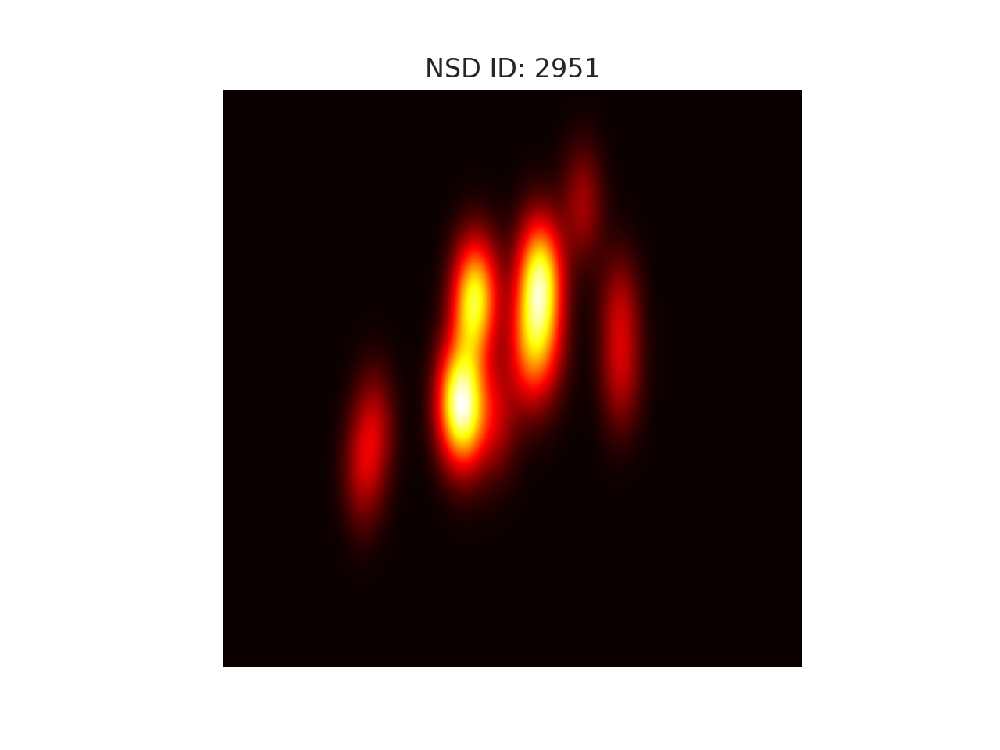

In [ ]:
nsd_id = 2951
# Call to get the saliency map for the nsdId 10007
salmap2951 = get_saliency(nsd_id)

# Plot the saliency map for the nsdId 10007
plt.imshow(salmap2951, cmap='hot')
plt.axis('off')

# Add a title to the plot
plt.title(f'NSD ID: {nsd_id}')

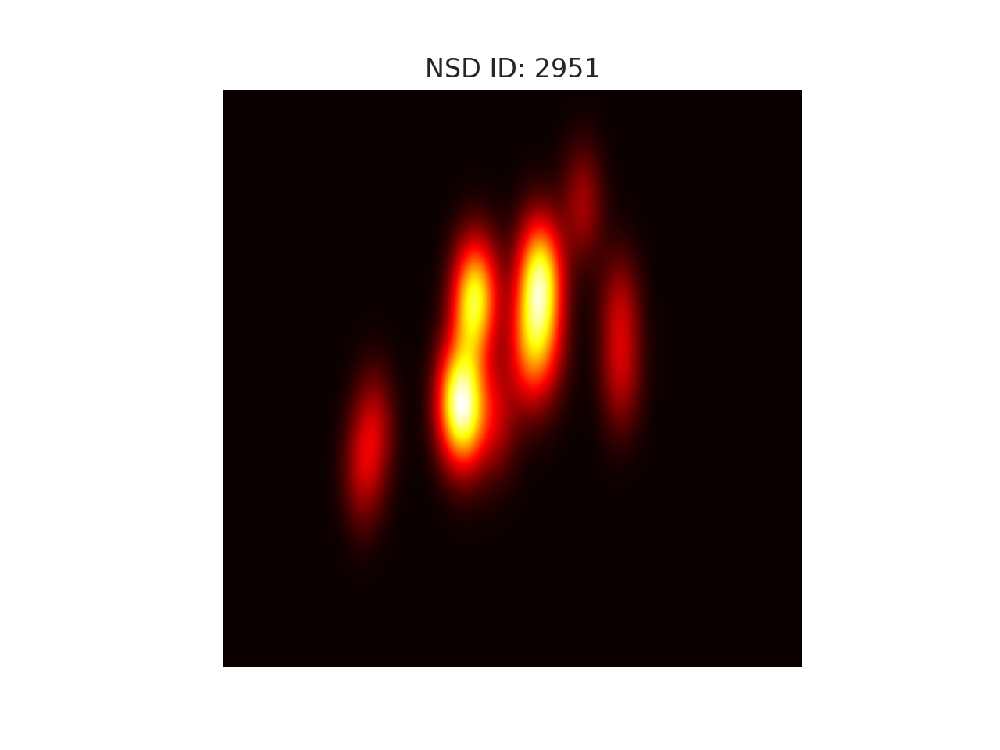

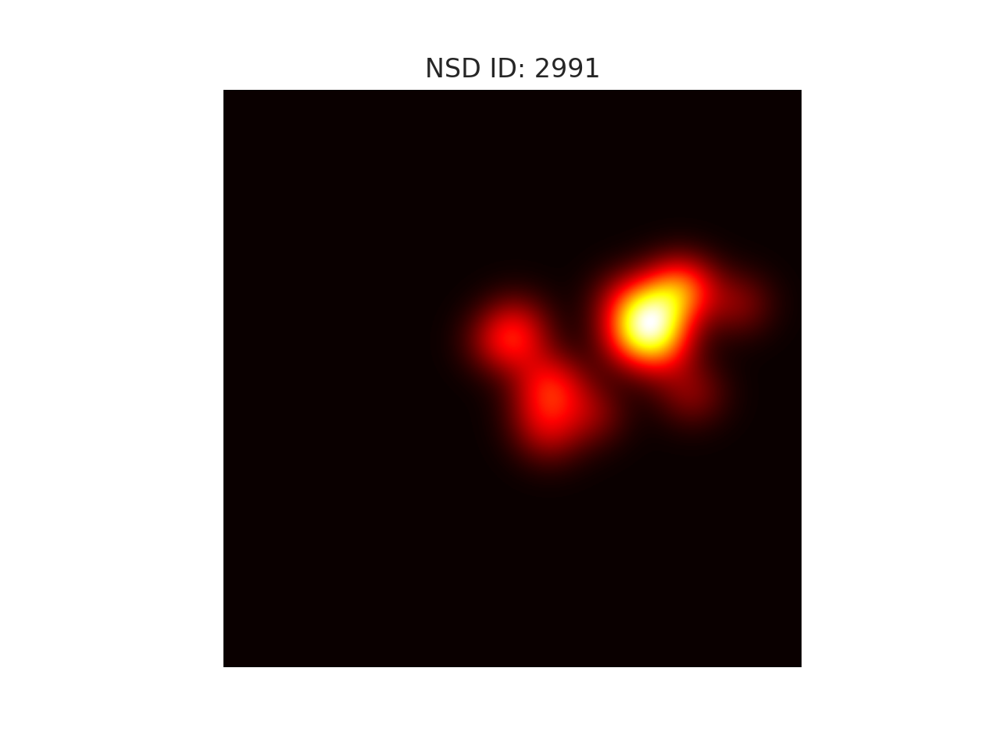

(array([[1.1210388e-43, 2.9707527e-43, 7.8192454e-43, ..., 8.4077908e-45,
         2.8025969e-45, 1.4012985e-45],
        [1.4853764e-43, 3.9236357e-43, 1.0313557e-42, ..., 9.8090893e-45,
         2.8025969e-45, 1.4012985e-45],
        [1.9478049e-43, 5.1707913e-43, 1.3578582e-42, ..., 1.2611686e-44,
         4.2038954e-45, 1.4012985e-45],
        ...,
        [2.4388380e-30, 6.0369861e-30, 1.4810996e-29, ..., 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00],
        [2.0850371e-30, 5.1612045e-30, 1.2662374e-29, ..., 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00],
        [1.7805837e-30, 4.4075746e-30, 1.0813436e-29, ..., 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00]], dtype=float32),
 array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 1.4786739e-25,
         1.2328880e-25, 1.0284139e-25],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 2.5384060e-25,
         2.1191816e-25, 1.7698856e-25],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,

In [ ]:
# Function call "get_saliency()" with three nsd images as a list

nsd_ids = [2951, 2991]
salmaps = get_saliency(nsd_ids)
for i, salmap in enumerate(salmaps):
    # Plot the saliency map for the nsdId
    plt.imshow(salmap, cmap='hot')
    plt.axis('off')
    # Add a title to the plot
    plt.title(f'NSD ID: {nsd_ids[i]}')
    plt.show()

salmaps

## 1.2 Saliency All_Fixations - Get the saliency maps based on all fixations 

In [227]:
def get_saliency_all_fixations(nsd_id: Union[List[int], int]) -> Union[np.ndarray, Tuple[np.ndarray, ...]]:
    """
    Return saliency map(s) for a single image or a series of images given their NSD IDs
    using all fixations.

    Parameters
    ----------
    nsd_id: Union[list, int]
        A single NSD ID or a list of NSD IDs for which the saliency maps are to be returned

    Returns
    -------
    saliency: Union[np.ndarray, Tuple[np.ndarray, ...]]
        A single saliency map if a single NSD ID is provided or a tuple of saliency maps if
        multiple NSD IDs are provided
    """
    if isinstance(nsd_id, int):
        nsd_id = [nsd_id]

    with h5py.File(salmaps_1st_path, 'r') as f:
        saliency_map = [np.asarray(f['all_fixations'][f'image_{i}'], dtype=np.float32) for i in nsd_id]

    if len(nsd_id) > 1:
        return tuple(saliency_map)
    else:
        return saliency_map[0]

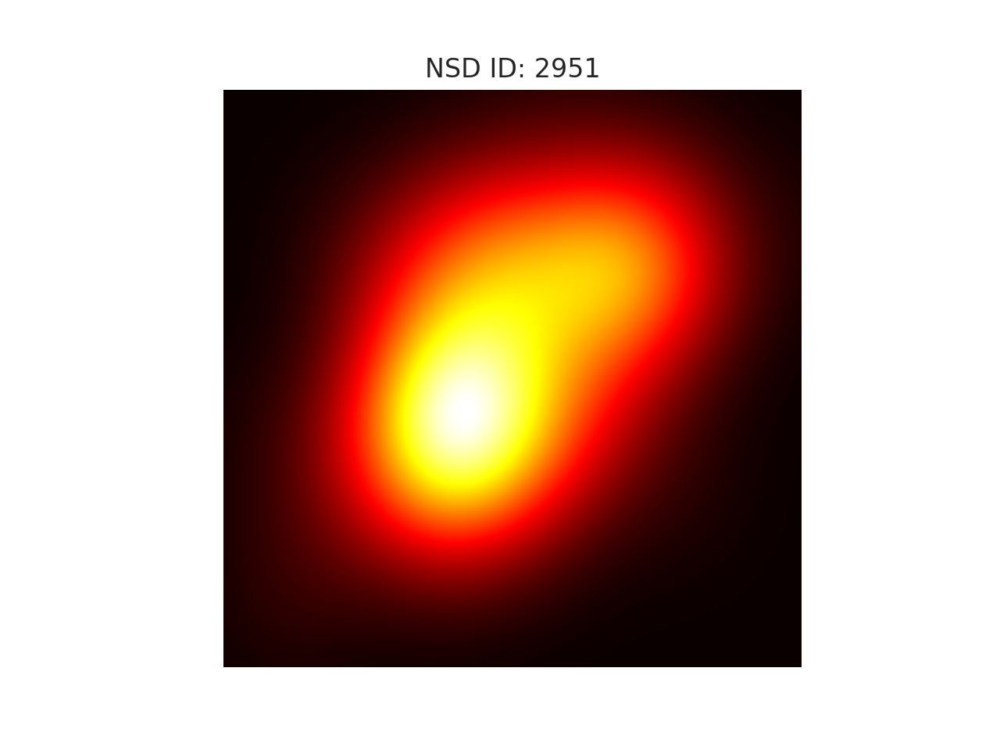

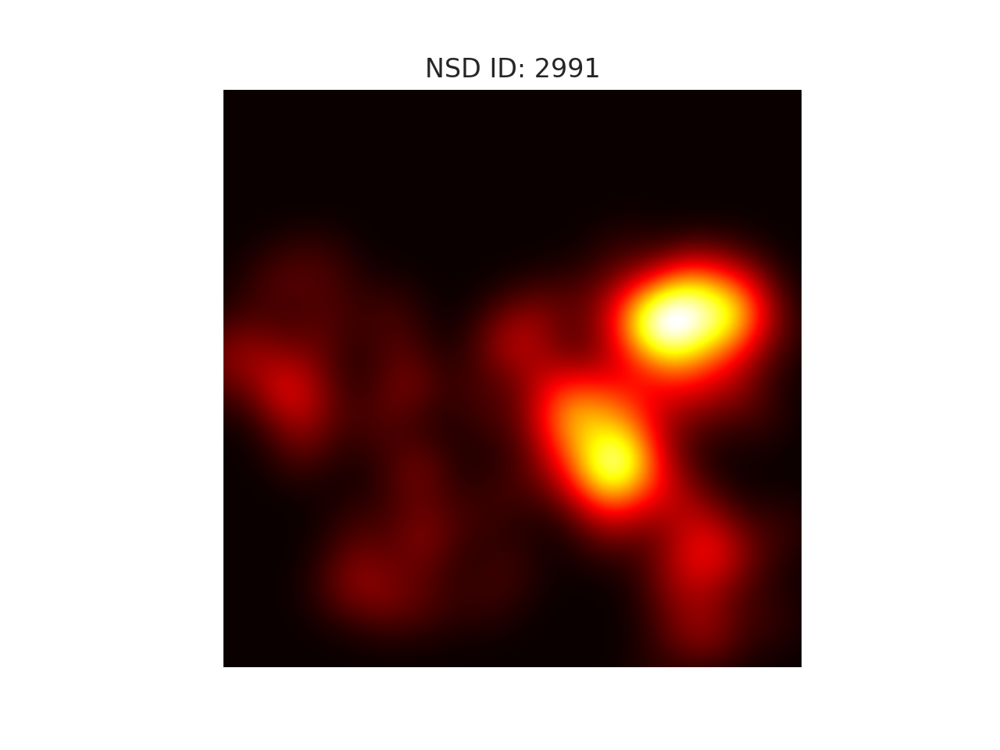

(array([[5.8537282e-09, 6.1779781e-09, 6.5169963e-09, ..., 1.3035785e-07,
         1.2805064e-07, 1.2583679e-07],
        [6.1107190e-09, 6.4492744e-09, 6.8032540e-09, ..., 1.3515383e-07,
         1.3276225e-07, 1.3046738e-07],
        [6.3766659e-09, 6.7300303e-09, 7.0994983e-09, ..., 1.4007882e-07,
         1.3760042e-07, 1.3522215e-07],
        ...,
        [2.9132181e-07, 2.9924027e-07, 3.0721210e-07, ..., 2.1876956e-09,
         2.0856161e-09, 1.9872208e-09],
        [2.8472317e-07, 2.9245464e-07, 3.0023770e-07, ..., 2.0763633e-09,
         1.9794995e-09, 1.8861297e-09],
        [2.7817498e-07, 2.8572134e-07, 2.9331753e-07, ..., 1.9699296e-09,
         1.8780502e-09, 1.7894840e-09]], dtype=float32),
 array([[2.69934693e-17, 3.06353851e-17, 3.47020432e-17, ...,
         9.35553681e-18, 8.17093559e-18, 7.12118714e-18],
        [3.76244293e-17, 4.26926741e-17, 4.83505200e-17, ...,
         1.31502576e-17, 1.14872540e-17, 1.00132810e-17],
        [5.23151603e-17, 5.93512942e-17, 6.720

In [228]:
# Function call to get saliency map all fixations
nsd_ids = [2951, 2991]
salmaps_all_fixations = get_saliency_all_fixations(nsd_ids)
for i, salmap in enumerate(salmaps_all_fixations):
    # Plot the saliency map for the nsdId
    plt.imshow(salmap, cmap='hot')
    plt.axis('off')
    # Add a title to the plot
    plt.title(f'NSD ID: {nsd_ids[i]}')
    plt.show()
salmaps_all_fixations

## 1.3 Function definition get_saliency DeepGazeIIE 

In [229]:
def get_saliency_deepgaze(nsd_id: Union[List[int], int]) -> Union[np.ndarray, Tuple[np.ndarray, ...]]:
    """
    get_saliency_deepgaze(nsd_id: Union[list, int]) -> np.ndarray or Tuple[np.ndarray, ...]

    Return saliency map(s) for a single image or a series of images given their NSD IDs.

    Parameters
    ----------
    nsd_id: Union[list, int]
        A single NSD ID or a list of NSD IDs for which the saliency maps are to be returned.

    Returns
    -------
    saliency: Union[np.ndarray, Tuple[np.ndarray, ...]]
        A single saliency map if a single NSD ID is provided, or a tuple of saliency maps if
        multiple NSD IDs are provided.
    """
    # Ensure nsd_id is a list for consistent processing
    if isinstance(nsd_id, int):
        nsd_id = [nsd_id]

    # Open the HDF5 file containing the saliency maps
    with h5py.File(deepgazeIIE_sal_maps_file_path, 'r') as h5_file:
        saliency_map_deepgazeIIE = []

        # Iterate over the provided NSD IDs
        for i in nsd_id:
            nsd_id_key = f'nsd_{i}'
            if nsd_id_key in h5_file.keys():
                # Load the saliency map for the current NSD ID
                saliency_map = h5_file[nsd_id_key][:]
                print(f"Loaded saliency map for NSD ID {i}: {saliency_map.shape}")

                # Ensure the saliency map is 2D
                saliency_map = np.squeeze(saliency_map)  # Remove singleton dimensions
                if saliency_map.ndim != 2:
                    raise ValueError(f"Expected a 2D saliency map for NSD ID {i}, but got shape {saliency_map.shape}")

                # Append the saliency map to the list
                saliency_map_deepgazeIIE.append(saliency_map)
            else:
                # Raise an error if the NSD ID is not found in the file
                raise KeyError(f"Dataset '{nsd_id_key}' not found in the HDF5 file.")

    # If there are multiple NSD IDs, return a tuple of saliency maps, else return a single saliency map
    if len(nsd_id) > 1:
        return tuple(saliency_map_deepgazeIIE)
    else:
        return saliency_map_deepgazeIIE[0]

Function call "get_saliency_deppgaze()"

Loaded saliency map for NSD ID 2951: (1, 1, 425, 425)
Loaded saliency map for NSD ID 2991: (1, 1, 425, 425)


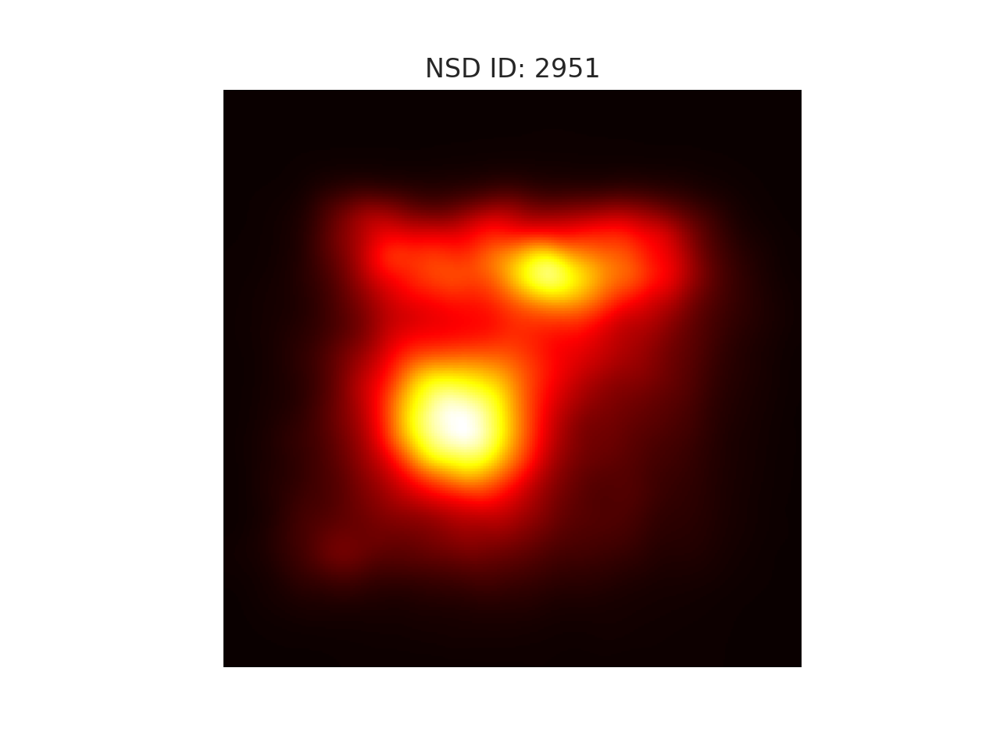

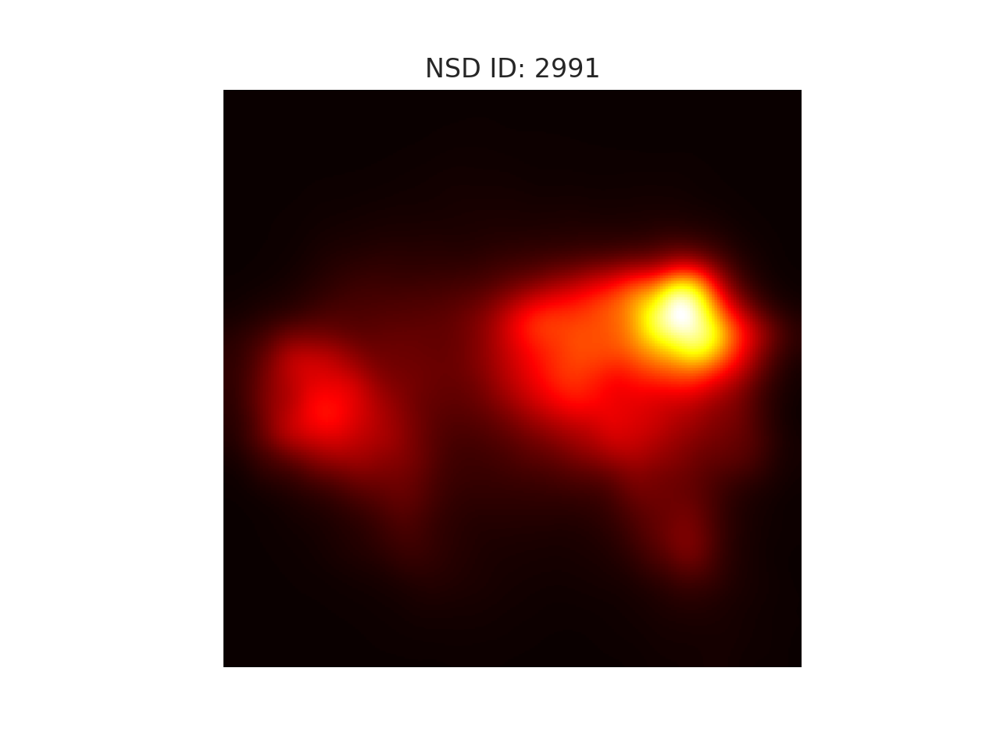

(array([[2.54095085e-08, 2.54095085e-08, 2.54095085e-08, ...,
         5.64882563e-10, 4.14555639e-10, 4.14555639e-10],
        [2.54095085e-08, 2.54095085e-08, 2.54095085e-08, ...,
         5.64882563e-10, 4.14555639e-10, 4.14555639e-10],
        [2.54095085e-08, 2.54095085e-08, 2.54095085e-08, ...,
         5.64882563e-10, 4.14555639e-10, 4.14555639e-10],
        ...,
        [1.73592688e-08, 1.73592688e-08, 1.73592688e-08, ...,
         1.31878784e-08, 1.13168346e-08, 1.13168346e-08],
        [1.53079159e-08, 1.53079159e-08, 1.53079159e-08, ...,
         1.30601631e-08, 1.11784289e-08, 1.11784289e-08],
        [1.53079159e-08, 1.53079159e-08, 1.53079159e-08, ...,
         1.30601631e-08, 1.11784289e-08, 1.11784289e-08]]),
 array([[2.26751594e-08, 2.26751594e-08, 2.26751594e-08, ...,
         4.87001123e-10, 3.54691006e-10, 3.54691006e-10],
        [2.26751594e-08, 2.26751594e-08, 2.26751594e-08, ...,
         4.87001123e-10, 3.54691006e-10, 3.54691006e-10],
        [2.26751594e-08, 

In [230]:
# Functional call "get_saliency()" with three nsd images as a list
nsd_ids = [2951, 2991]
salmaps = get_saliency_deepgaze(nsd_ids)
for i, salmap in enumerate(salmaps):
    # Plot the saliency map for the nsdId
    plt.imshow(salmap, cmap='hot')
    plt.axis('off')
    # Add a title to the plot
    plt.title(f'NSD ID: {nsd_ids[i]}')
    plt.show()

salmaps

# 2. Load betas, ROIs and pRF data 
Function definition and calls: 

- load_betas_concat()
- load_all_rois_prf_subject()
- load_prf_data()

In [ ]:
# Open the num_voxel_rois_dict.pkl file to read the number of voxels for each ROI for the entered subject id "sub_num"

with open(DATA_PATH_subj/f'num_voxel_rois_dict_{sub_num}.pkl', 'rb') as fp: 
    num_voxel_rois_dict = pickle.load(fp)
    print(num_voxel_rois_dict)

{'v1': 1127, 'v2': 1180, 'v3': 1201, 'v4': 477, 'ofa': 519, 'ffa1': 341, 'ffa2': 485, 'atl': 80, 'eba': 4126, 'fba1': 985, 'fba2': 301, 'mtl_bodies': 167, 'opa': 1362, 'ppa': 1229, 'rsc': 845, 'owfa': 522, 'vwfa_1': 612, 'vwfa_2': 539, 'mfs_words': 474, 'mtl_words': 188, 'vo1': 280, 'vo2': 415, 'phc1': 256, 'phc2': 229, 'mst': 51, 'hmt': 352, 'lo2': 251, 'lo1': 464, 'v3b': 443, 'v3a': 548, 'ips0': 674, 'ips1': 461, 'ips2': 400, 'ips3': 425, 'ips4': 100, 'ips5': 14, 'spl1': 158, 'fef': 93}


In [232]:
sub_num

6

Example just for four ROIs to test for new subjects 

In [233]:
""" 
    # Small example just for four rois to test for new subjects 
    def load_betas_concat(roi):
    #Load the beta values for the specified region of interest (ROI) and concatenate them.
    

    if roi == 'v1':
        num_voxels = num_voxel_rois_dict['v1']
        mask_img= image.load_img("../data/subjectwise_data/subject01/prf_valid_mask_v1.nii.gz")
        # The NiftiMasker is used to apply the mask to the betas, returns masked betas as numpy array 
        masker = NiftiMasker(mask_img = mask_img)
        
    elif roi == 'v2':
        num_voxels = num_voxel_rois_dict['v2']
        mask_img= image.load_img("../data/subjectwise_data/subject01/prf_valid_mask_v2.nii.gz")
        masker = NiftiMasker(mask_img = mask_img)
        
    elif roi == 'v3':
        num_voxels = num_voxel_rois_dict['v3']
        mask_img= image.load_img("../data/subjectwise_data/subject01/prf_valid_mask_v3.nii.gz")
        masker = NiftiMasker(mask_img = mask_img)
        
    elif roi == 'v4':
        num_voxels = num_voxel_rois_dict['v4']
        mask_img= image.load_img("../data/subjectwise_data/subject01/prf_valid_mask_v4.nii.gz")
        masker = NiftiMasker(mask_img = mask_img)

    
        
    sess_fnames = sorted(list(BETAS_PATH.glob('betas_session*.nii.gz')))
    n_sess = len(sess_fnames)

    betas_valid_full = np.ones([1,num_voxels])

    for i in tqdm(range(0,n_sess)):
        betas_sess = nib.load(sess_fnames[i])
        betas_sess_ROI = masker.fit_transform(betas_sess)    
        #############################################################################################################################
        # Minimize the betas to the valid betas, since the beta session file has size 1350 and the betas_valid_full has the size 1193

        # Find the minimum size along dimension 1
        min_size = min(betas_valid_full.shape[1], betas_sess_ROI.shape[1])

        # Truncate both arrays
        betas_valid_full = betas_valid_full[:, :min_size]
        betas_sess_ROI = betas_sess_ROI[:, :min_size]

        # Now stack the arrays
        betas_valid_full = np.vstack((betas_valid_full, betas_sess_ROI))
        #############################################################################################################################
      
        
    # Remove the first row of ones
    betas_valid_full = betas_valid_full[1:, :]
    
    return betas_valid_full """

' \n    # Small example just for four rois to test for new subjects \n    def load_betas_concat(roi):\n    #Load the beta values for the specified region of interest (ROI) and concatenate them.\n    \n\n    if roi == \'v1\':\n        num_voxels = num_voxel_rois_dict[\'v1\']\n        mask_img= image.load_img("../data/subjectwise_data/subject01/prf_valid_mask_v1.nii.gz")\n        # The NiftiMasker is used to apply the mask to the betas, returns masked betas as numpy array \n        masker = NiftiMasker(mask_img = mask_img)\n        \n    elif roi == \'v2\':\n        num_voxels = num_voxel_rois_dict[\'v2\']\n        mask_img= image.load_img("../data/subjectwise_data/subject01/prf_valid_mask_v2.nii.gz")\n        masker = NiftiMasker(mask_img = mask_img)\n        \n    elif roi == \'v3\':\n        num_voxels = num_voxel_rois_dict[\'v3\']\n        mask_img= image.load_img("../data/subjectwise_data/subject01/prf_valid_mask_v3.nii.gz")\n        masker = NiftiMasker(mask_img = mask_img)\n      

## 2.1 Function definition *load_betas_concat()*" 

load_betas_concat(roi) with for-loop instead of if statementsto ensure smoother execution

In [234]:
def load_betas_concat(roi):
    """Load the beta values for the specified region of interest (ROI) and concatenate them."""
    try: 
        # Validate ROI
        if roi not in num_voxel_rois_dict:
            raise ValueError(f"Unknown ROI: {roi}")

        # Initialize masker
        num_voxels = num_voxel_rois_dict[roi]
        mask_img = image.load_img(f"../data/subjectwise_data/subject0{sub_num}/prf_valid_mask_{roi}.nii.gz")
        masker = NiftiMasker(mask_img=mask_img)

        # Load session files
        sess_fnames = sorted(list(BETAS_PATH.glob('betas_session*.nii.gz')))
        n_sess = len(sess_fnames)

        betas_valid_full = np.ones([1, num_voxels])

        for i in tqdm(range(0, n_sess)):
            betas_sess = nib.load(sess_fnames[i])
            betas_sess_ROI = masker.fit_transform(betas_sess)

            # Minimize the betas to the valid betas
            min_size = min(betas_valid_full.shape[1], betas_sess_ROI.shape[1])
            betas_valid_full = betas_valid_full[:, :min_size]
            betas_sess_ROI = betas_sess_ROI[:, :min_size]

            # Stack the arrays
            betas_valid_full = np.vstack((betas_valid_full, betas_sess_ROI))

        # Remove the first row of ones
        betas_valid_full = betas_valid_full[1:, :]

        return betas_valid_full
    except Exception as e:
        print(f"Error loading betas for {roi}: {e}") # for mtl_faces and mtl_bodies the ROI mask is empty and the error 
        # will be raised
        return None 

In [235]:
# Load betas for v3
betas_v3 = load_betas_concat('v3')
print(betas_v3.shape)

  0%|          | 0/32 [00:00<?, ?it/s]

(24000, 1035)


### Operates for all ROIs and with applied multiprocessing for faster execution - Multiprocessing using the length of rois as length of processors 


Count the number of rois 

In [236]:
# Count the number of rois 
all_rois = ['v1', 'v2', 'v3', 'v4', 'ofa', 'ffa1', 'ffa2', 'mtl_faces', 'atl', 'eba', 'fba1', 'fba2', 'mtl_bodies', 'opa', 'ppa',
          'rsc', 'owfa', 'vwfa_1', 'vwfa_2', 'mfs_words', 'mtl_words', 'vo1', 'vo2', 'phc1', 'phc2', 'mst', 
          'hmt', 'lo2', 'lo1', 'v3b', 'v3a', 'ips0', 'ips1', 'ips2', 'ips3', 'ips4', 'ips5', 'spl1', 'fef']

# Count the number of rois 
len(all_rois)

# TODO: Maybe need to delete "mtl_faces" and "mtl_bodies" here or better define edge cases in the inherited function

39

### 2.1.2 Function call *load_betas_concat()* for all ROIs. 

In [237]:
# Function call "load_betas_concat_fast" - multiprocessing using the length of rois as length of processors 
# runs for 7m21s for sub_num = 1 

# Check if the file already exists
if not (DATA_PATH_subj / f'betas_valid_full_subj0{sub_num}.pkl').exists():
    print(f"File 'betas_valid_full_subj0{sub_num}.pkl' does not exist. Running the function to generate it.")

    #all_rois =['v1', 'v2', 'v3', 'v4', 'ofa', 'ffa1', 'ffa2', 'atl', 'eba', 'fba1', 'fba2', 'opa', 'ppa',
    #      'rsc', 'owfa', 'vwfa_1', 'vwfa_2', 'mfs_words', 'mtl_words', 'vo1', 'vo2', 'phc1', 'phc2', 'mst', 
    #      'hmt', 'lo2', 'lo1', 'v3b', 'v3a', 'ips0', 'ips1', 'ips2', 'ips3', 'ips4', 'ips5', 'spl1', 'fef']
    
    #with Pool(processes=len(all_rois)) as pool:

    # Limit the number of processes to the number of available CPU cores using os.cpu_count():
    with Pool(processes=min(len(all_rois), os.cpu_count())) as pool:
       
        # Use imap to load betas for all ROIs
        results = pool.imap(load_betas_concat, all_rois)
        
        all_results = []
        for roi, result in zip(all_rois, results):
            try:
                 # Ensure the result is a NumPy array
                if not isinstance(result, np.ndarray):
                    print(f"Error: Result for {roi} is not a NumPy array.")
                    continue
            
            except ValueError as e:
                # Handle the case where the mask is empty
                # Print error message if the mask is empty and log the error.
                print(f"CANNOT load concatenated betas for {roi}, empty mask. Error: {e}")
                continue # Move to the next ROI

            all_results.append(result)
            print(f"Shape of {roi} result:", result.shape)
            
            # Save the result as a numpy array
            np.save(DATA_PATH_subj / f'betas_valid_subj0{sub_num}_{roi}.npy', result)

    # Save the results as a .pkl file for the calculation of K
    with open(DATA_PATH_subj / f'betas_valid_full_subj0{sub_num}.pkl', 'wb') as f:
        pickle.dump(all_results, f)
else:
    print(f"File 'betas_valid_full_subj0{sub_num}.pkl' exists. Checking individual ROI files ...")

################# Checking the existance of individual ROI files in betas_valid_full_subj{sub_num}.pkl ###########################

    # Check for missing files for each ROI
    
    missing_rois = []
    for roi in all_rois:
        roi_file_path = DATA_PATH_subj / f'betas_valid_subj0{sub_num}_{roi}.npy'
        if not roi_file_path.exists():
            print(f"File for ROI '{roi}' is missing.")
            missing_rois.append(roi)

    if missing_rois:
        print(f"Generating missing files for ROIs: {missing_rois}")
        with Pool(processes=len(missing_rois)) as pool:
            results = pool.imap(load_betas_concat, missing_rois)
            
            for roi, result in zip(missing_rois, results):
                # Ensure the result is a NumPy array
                if not isinstance(result, np.ndarray):
                    print(f"Error: Result for {roi} is not a NumPy array.")
                    continue

                print(f"Shape of {roi} result:", result.shape)
                
                # Save the result as a numpy array
                np.save(DATA_PATH_subj / f'betas_valid_subj0{sub_num}_{roi}.npy', result)
    else:
        print("All ROI files already exist. No further action needed.")

# Function call "load_betas_concat_fast" - multiprocessing using the length of rois as length of processors 
# runs for 7m21s for sub_num = 1 

File 'betas_valid_full_subj06.pkl' exists. Checking individual ROI files ...
File for ROI 'mtl_faces' is missing.
Generating missing files for ROIs: ['mtl_faces']
Error loading betas for mtl_faces: Unknown ROI: mtl_faces
Error: Result for mtl_faces is not a NumPy array.


In [238]:
""" # Takes 5.36min to run through 
if not (DATA_PATH_subj / 'betas_valid_subj01_v1.npy').exists():
    print("File 'betas_valid_subj01_v1.npy' does not exist. Running the function to generate it.")
    betas_full_v1 = load_betas_concat('v1')
    np.save(DATA_PATH_subj/'betas_valid_subj01_v1.npy',betas_full_v1) """

' # Takes 5.36min to run through \nif not (DATA_PATH_subj / \'betas_valid_subj01_v1.npy\').exists():\n    print("File \'betas_valid_subj01_v1.npy\' does not exist. Running the function to generate it.")\n    betas_full_v1 = load_betas_concat(\'v1\')\n    np.save(DATA_PATH_subj/\'betas_valid_subj01_v1.npy\',betas_full_v1) '

In [239]:
""" betas_full_v1.shape, (betas_full_v1[0,:]==1).sum() """

' betas_full_v1.shape, (betas_full_v1[0,:]==1).sum() '

## 2.2 Function definition and execution "*load_prf_data()*"
 To load the pRF data and transfer the polar coordinates to cartesian coordinates (x, y) and sigma values to pixel space. 

In [ ]:
def load_prf_data(sub_num:int) -> dict:
    """
    Load the pRF data for a specific subject


    Parameters
    ----------
    sub_num : int
        The subject number for which the pRF data is to be loaded

    Returns
    -------
    prf_img : dict
        A dictionary containing the pRF data for the specified subject

        The pRF data contains: 
        # TODO: Print the keys of PRF Data 
        the ROI eccentricity data, 
        the ROI size data, 
        the ROI R2 value,
        the ROI sigma value,
        the ROI angle data 

        (for ROIs: v1, v2, v3, v4, ofa, ffa1, ffa2, atl, eba, fba1, fba2, opa, ppa,
          rsc, owfa, vwfa_1, vwfa_2, mfs_words, mtl_words, vo1, vo2, phc1, phc2, mst, 
          hmt, lo2, lo1, v3b, v3a, ips0, ips1, ips2, ips3, ips4, ips5, spl1, fef)

    """

    prf_imgs = {}
    print (PRF_MASKS_PATH)
    for file in os.listdir(PRF_MASKS_PATH):
        if file.startswith("prf"):

            # print(file)
            # Split the file name based on the extension and use the basename for creating new vars
            li = file.split('.')
            basename = li[0]
            # print(basename)
            filename = basename+'_imgfile'
            # filename = image.load_img(PRF_PATH,file)
            print(f"Loaded file {file}")
            # print(filename)

            prf_imgs[filename]= image.load_img(PRF_MASKS_PATH/ file)
#############################################################################################################
# Transforming the polar coordinates to cartesian coordinates 

########### Recalculate the pRF Sigma sizes, and the calculated x and y cartesian coordinates ###############
            
    prf_sigma_px_img = math_img(
        'i_size * i_exp * %f / %f' % (stim_sz_px, stim_sz_deg), 
        copy_header_from='i_size',
        i_size=prf_imgs["prf_size_imgfile"], 
        i_exp=prf_imgs["prf_exponent_imgfile"])

    prf_x_coord_px_img = math_img(
        '(i_ecc * np.cos(np.deg2rad(i_angle))) * %f / %f' % (stim_sz_px, stim_sz_deg),
        copy_header_from='i_ecc',
        i_ecc=prf_imgs["prf_eccentricity_imgfile"],
        i_angle=prf_imgs["prf_angle_imgfile"])

    prf_y_coord_px_img = math_img(
        '(i_ecc * np.sin(np.deg2rad(i_angle))) * %f / %f' % (stim_sz_px, stim_sz_deg),
        copy_header_from='i_ecc',
        i_ecc=prf_imgs["prf_eccentricity_imgfile"],
        i_angle=prf_imgs["prf_angle_imgfile"])

# Returns the pRF data for the specified subject, the sigma sizes, and the calculated x and y cartesian coordinates 
# for the whole brain
    return prf_imgs, prf_sigma_px_img, prf_x_coord_px_img, prf_y_coord_px_img

We have the eccentricity (the radius) and the angle.

The cartesian coordinates can be calculated using: 

$x = r*cos(\theta), y = r*sin(\theta) $

In [241]:
# Function call: load_prf_data
prf_imgs,prf_sigma_px_img, prf_x_coord_px_img, prf_y_coord_px_img  = load_prf_data(sub_num= sub_num)

/gpfs01/bartels/group/nsd_dataset/nsddata/ppdata/subj06/func1pt8mm
Loaded file prf_R2.nii.gz


Loaded file prf_size.nii.gz
Loaded file prf_eccentricity.nii.gz
Loaded file prf_angle.nii.gz
Loaded file prf_exponent.nii.gz
Loaded file prf_gain.nii.gz
Loaded file prf_meanvol.nii.gz


In [242]:
prf_imgs.keys()

dict_keys(['prf_R2_imgfile', 'prf_size_imgfile', 'prf_eccentricity_imgfile', 'prf_angle_imgfile', 'prf_exponent_imgfile', 'prf_gain_imgfile', 'prf_meanvol_imgfile'])

## 2.3 Function definition and execution "*load_all_rois_prf_subject()*"
To load all ROIs for the corresponding pRF data with a function call of "*load_prf_data()*" and apply the *selection criteria for valid voxels* (r2-values > 0, only consider voxels that have their pRF in the stim_sz_px + sigma/one standard deviation) to it. 

In [ ]:
# New function to load all ROI pRF data for a subject.
# It also directly selects pRF-valid voxels based on selection criteria:
# the stimulus size (425x425) and whether the pRF, extended by its sigma,
# falls within or beyond the stimulus boundaries — allowing for larger pRFs 
# in the peripheral visual field.

def load_all_rois_prf_subject(sub_num:int, verbosity) -> Tuple[dict, pd.DataFrame]: 
    # TODO: This code cell should only run if the PRF data is not already saved. 

    """
    Load the pRF data for a givem subject, for all of the potential ROIs

    Parameters
    ----------
    sub_num (int): Subject number.
    Verbosity (int): Verbosity level for printing information.

    Returns
    -------
    dict
        Dictionary containing the NIfTI mask of the ROI and subject.
    DataFrame
        DataFrame containing the pRF data for the valid voxels (according to the selection criteria) for the specified subject.
    """ 
    
    # Print ROI_PATH
    print(PRF_MASKS_PATH)
    
     # ROI Paths
    roi_path_faces = PRF_MASKS_PATH / 'roi/floc-faces.nii.gz' 
    roi_path_viz= PRF_MASKS_PATH / 'roi/prf-visualrois.nii.gz'
    roi_path_bodies = PRF_MASKS_PATH / 'roi/floc-bodies.nii.gz'
    roi_path_places = PRF_MASKS_PATH / 'roi/floc-places.nii.gz'
    roi_path_words= PRF_MASKS_PATH / 'roi/floc-words.nii.gz'
    roi_path_kastner = PRF_MASKS_PATH / 'roi/Kastner2015.nii.gz' 

    # Load the corresponding images 
    voxel_img_viz = image.load_img(roi_path_viz)
    voxel_img_faces = image.load_img(roi_path_faces)
    voxel_img_bodies = image.load_img(roi_path_bodies)
    voxel_img_places = image.load_img(roi_path_places)
    voxel_img_words = image.load_img(roi_path_words)
    voxel_img_kastner = image.load_img(roi_path_kastner)


    # Seperate the regions based on their integer labelling 
    # Combine dorsal and ventral into one mask for each ROI
    v1_mask_img = math_img("np.logical_or(img==1, img==2)",img=voxel_img_viz) 
    v2_mask_img = math_img("np.logical_or(img==3, img==4)",img=voxel_img_viz)
    v3_mask_img = math_img("np.logical_or(img==5, img==6)",img=voxel_img_viz)
    v4_mask_img = math_img("img==7",img=voxel_img_viz)

    ofa_mask_img = math_img("img == 1",img=voxel_img_faces)
    ffa1_mask_img = math_img("img == 2",img=voxel_img_faces)
    ffa2_mask_img = math_img("img == 3",img=voxel_img_faces)
    mtl_faces_mask_img = math_img("img == 4",img=voxel_img_faces)
    atl_mask_img = math_img("img == 5",img=voxel_img_faces)

    eba_mask_img = math_img("img == 1",img=voxel_img_bodies)
    fba1_mask_img = math_img("img == 2",img=voxel_img_bodies)
    fba2_mask_img = math_img("img == 3",img=voxel_img_bodies)
    mtl_bodies_mask_img = math_img("img == 4",img=voxel_img_bodies)

    opa_mask_img = math_img("img == 1",img=voxel_img_places)
    ppa_mask_img = math_img("img == 2",img=voxel_img_places)
    rsc_mask_img = math_img("img == 3",img=voxel_img_places)

    owfa_mask_img = math_img("img == 1",img=voxel_img_words)
    vwfa_1_mask_img = math_img("img == 2",img=voxel_img_words)
    vwfa_2_mask_img = math_img("img == 3",img=voxel_img_words)
    mfs_words_mask_img = math_img("img == 4",img=voxel_img_words)
    mtl_words_mask_img = math_img("img == 5",img=voxel_img_words)


    vo1_mask_img = math_img("img ==  8", img = voxel_img_kastner)
    vo2_mask_img = math_img("img ==  9", img = voxel_img_kastner)
    phc1_mask_img = math_img("img == 10", img = voxel_img_kastner)
    phc2_mask_img = math_img("img == 11", img = voxel_img_kastner)
    mst_mask_img = math_img("img ==  12", img = voxel_img_kastner)
    hmt_mask_img = math_img("img ==  13", img = voxel_img_kastner)
    lo2_mask_img = math_img("img ==  14", img = voxel_img_kastner)
    lo1_mask_img = math_img("img ==  15", img = voxel_img_kastner)
    v3b_mask_img = math_img("img ==  16", img = voxel_img_kastner)
    v3a_mask_img = math_img("img ==  17", img = voxel_img_kastner)
    ips0_mask_img = math_img("img == 18", img = voxel_img_kastner)
    ips1_mask_img = math_img("img == 19", img = voxel_img_kastner)
    ips2_mask_img = math_img("img == 20", img = voxel_img_kastner)
    ips3_mask_img = math_img("img == 21", img = voxel_img_kastner)
    ips4_mask_img = math_img("img == 22", img = voxel_img_kastner)
    ips5_mask_img = math_img("img == 23", img = voxel_img_kastner)
    spl1_mask_img = math_img("img == 24", img = voxel_img_kastner)
    fef_mask_img = math_img("img ==  25", img = voxel_img_kastner)

    
    # Load pRF data and calculate the sigma, x and y coordinates for the whole brain of the subject 
    prf_imgs, prf_sigma_px_img, prf_x_coord_px_img, prf_y_coord_px_img  = load_prf_data(sub_num)
    
    # Generate the pRF data according to the masks 
    # mtl_faces_mask_img, mtl_bodies_mask_img excluded due to empty masks for sub_num 1 and sub_num 2
    
    mask_list = [v1_mask_img, v2_mask_img, v3_mask_img, v4_mask_img,
            ofa_mask_img,ffa1_mask_img, ffa2_mask_img, mtl_faces_mask_img, atl_mask_img,
            eba_mask_img, fba1_mask_img, fba2_mask_img, mtl_bodies_mask_img,
            opa_mask_img, ppa_mask_img, rsc_mask_img,
            owfa_mask_img, vwfa_1_mask_img,vwfa_2_mask_img , mfs_words_mask_img, mtl_words_mask_img,
                
            vo1_mask_img, vo2_mask_img , phc1_mask_img, phc2_mask_img, mst_mask_img, hmt_mask_img,lo2_mask_img, 
            lo1_mask_img, v3b_mask_img, v3a_mask_img, ips0_mask_img, ips1_mask_img,ips2_mask_img, ips3_mask_img, 
            ips4_mask_img, ips5_mask_img, spl1_mask_img, fef_mask_img] 

    
    rois = ["v1","v2","v3","v4",
           "ofa","ffa1", "ffa2","mtl_faces", "atl",
           "eba","fba1", "fba2","mtl_bodies",
           "opa", "ppa", "rsc",
           "owfa", "vwfa_1", "vwfa_2", "mfs_words", "mtl_words",

           "vo1","vo2","phc1","phc2","mst","hmt","lo2","lo1",
           "v3b","v3a","ips0","ips1","ips2","ips3","ips4",
           "ips5","spl1","fef"]

               
    prf_valid_img = {}
    prf_valid_mask = {}

    ################################################################################################################################
    ##################################### Applying the selection criterio of valid voxels  #########################################
    ################################################################################################################################

    # Apply the selection criteria to create the prf_valid_mask only for the voxels of V1 are included

    # Intialize an empty DataFrame to store the prf data for the subject
    combined_prf_valid_df = pd.DataFrame()
    for mask, roi in zip(mask_list,rois): 

        # Selection criteria 1: R2> 0 
        pos_r2_img = math_img('(i_r2 > 0) * i_mask', copy_header_from='i_r2', i_r2=prf_imgs["prf_R2_imgfile"], i_mask=mask)

        """ prf_sigma_px_img = math_img(
            'i_size * i_exp', copy_header_from='i_size',
            i_size=prf_imgs["prf_size_imgfile"], 
            i_exp=prf_imgs["prf_exponent_imgfile"])

        prf_x_coord_px_img = math_img(
            '(i_ecc * np.cos(np.deg2rad(i_angle))) * %f / %f' % (stim_sz_px, stim_sz_deg),
            copy_header_from='i_ecc',
            i_ecc=prf_imgs["prf_eccentricity_imgfile"],
            i_angle=prf_imgs["prf_angle_imgfile"])

        prf_y_coord_px_img = math_img(
            '(i_ecc * np.sin(np.deg2rad(i_angle))) * %f / %f' % (stim_sz_px, stim_sz_deg),
            copy_header_from='i_ecc',
            i_ecc=prf_imgs["prf_eccentricity_imgfile"],
            i_angle=prf_imgs["prf_angle_imgfile"]) """
        
        # Selection criteria 2: Include only those voxels that cover the stimulus plus of sigma beyond
        cover_stim_img = math_img(
            'i_pos_r2 * ' \
            f'(i_x < {stim_sz_px/2} + i_sigma) * (i_x > -{stim_sz_px/2} - i_sigma) * ' \
            f'(i_y < {stim_sz_px/2} + i_sigma) * (i_y > -{stim_sz_px/2} - i_sigma)',
            copy_header_from='i_r2',
            i_pos_r2=pos_r2_img,
            i_r2=prf_imgs["prf_R2_imgfile"],
            i_x=prf_x_coord_px_img,
            i_y=prf_y_coord_px_img,
            i_sigma=prf_sigma_px_img
        )
        # Selection criteria 3: Proof that the PDFs sum to 1 if not remove the voxels - can only be applied after the Einstein summation
        # of K - See Part of the coe: "refine_mask_after_pdf_computation"

        ############################################################################################################

        # Adapt the valid voxels calculated in cover_stim_img to the distinct ROI masks to generate pRF valid masks for all rois 
        prf_valid_img[roi]  = math_img(
            'i_mask * i_cover_stim', copy_header_from='i_mask',
            i_mask=mask,
            i_cover_stim=cover_stim_img)
        # Create the pRF valid mask for the subject
        prf_valid_mask[roi] = math_img(
            'i_mask * i_valid', copy_header_from='i_mask',
            i_mask=mask,
            i_valid=prf_valid_img[roi]) 
        
        # Save the NIfTI images to disk if not already existing at the path 
        img_path = DATA_PATH_subj / f"prf_valid_img_{roi}.nii.gz"
        mask_path = DATA_PATH_subj / f"prf_valid_mask_{roi}.nii.gz"

        if not img_path.exists():
            nib.save(prf_valid_img[roi], img_path)
        if not mask_path.exists():
            nib.save(prf_valid_mask[roi], mask_path)
    
        #nib.save(prf_valid_img[roi], DATA_PATH_subj / f"prf_valid_img_{roi}.nii.gz")
        nib.save(prf_valid_mask[roi], DATA_PATH_subj / f"prf_valid_mask_{roi}.nii.gz")

        print(f"Saved NIfTI files for ROI: {roi}")

        ##############################################################################################
        #                Creation of prf_valid_df for the calculation of K 
        ##############################################################################################
        
        # Extract the valid voxel indices from the mask
        valid_voxel_indices = prf_valid_mask[roi].get_fdata() > 0  # Binary mask: True for valid voxels

        # Extract the prf data: sigma, r2, size, ecc, angle, x_coord, y_coord for the valid voxels
        
        prf_valid_df = pd.DataFrame({
            'roi': [roi] * valid_voxel_indices.sum(),  # Add a column to identify the ROI
            'sigma': prf_sigma_px_img.get_fdata()[valid_voxel_indices],
            'r2': prf_imgs["prf_R2_imgfile"].get_fdata()[valid_voxel_indices],
            'size': prf_imgs["prf_size_imgfile"].get_fdata()[valid_voxel_indices],
            'ecc': prf_imgs["prf_eccentricity_imgfile"].get_fdata()[valid_voxel_indices],
            'angle': prf_imgs["prf_angle_imgfile"].get_fdata()[valid_voxel_indices],
            'x_coord': prf_x_coord_px_img.get_fdata()[valid_voxel_indices],
            'y_coord': prf_y_coord_px_img.get_fdata()[valid_voxel_indices]
        })

        
        """  # Create the prf_valid_df for the calculation of K
        prf_valid_df = pd.DataFrame({
            'sigma': prf_sigma_px_img_valid.get_fdata().ravel(),
            'r2': prf_r2_img_valid.get_fdata().ravel(),
            'size': prf_size_img_valid.get_fdata().ravel(),
            'ecc': prf_ecc_img_valid.get_fdata().ravel(),
            'angle': prf_angle_img_valid.get_fdata().ravel(),
            'x_coord': prf_x_coord_px_img_valid.get_fdata().ravel(),
            'y_coord': prf_y_coord_px_img_valid.get_fdata().ravel()
        }) """
        # Remove rows with NaN values
        prf_valid_df = prf_valid_df.dropna()

        if verbosity > 0:
            # Print the shape of the prf_valid_df to verify
            print(f"Shape of combined prf_valid_df for subject {sub_num} and {roi}: {prf_valid_df.shape}")
            # Print the first few rows of the prf_valid_df to verify
            print(prf_valid_df.head())

        # Append the DataFrame for this ROI to the combined DataFrame
        combined_prf_valid_df = pd.concat([combined_prf_valid_df, prf_valid_df], ignore_index=True)

    ## Save the combined DataFrame to a CSV file
    combined_prf_valid_df.to_csv(DATA_PATH_subj / f"prf_valid_df_{sub_num}.csv", index=False)
    print("Saved combined prf_valid_df for all ROIs.")
    if verbosity > 0:
        # Print the shape of the prf_valid_df to verify
        print(f"Shape of combined prf_valid_df for subject 1: {combined_prf_valid_df.shape}")
        # Print the first few rows of the prf_valid_df to verify
        print(combined_prf_valid_df.head())
        
    
    # Returns the valid Voxels and corresponding valid masks as NIfTI images for the subject  
    return prf_valid_mask[roi], combined_prf_valid_df

    # prf_valid_img[roi]: NIfTI image of the valid voxels for the specified ROI
    # Represents the valid voxels for a specific region of interest (ROI) that meet the selection criteria
    # (R2 > 0, receptibe field covers the stimulus size plus sigma)

    # prf_valid_mask[roi]: NIfTI image of the valid mask for the specified ROI
    # Represents a binary NIfTI mask for the valid voxels in the ROI, derived from prf_valid_img[roi]


In [244]:
# Function call "load_all_rois_prf_subject"
prf_valid_mask_subj, combined_prf_valid_df_subj= load_all_rois_prf_subject(sub_num=sub_num, verbosity=1)

/gpfs01/bartels/group/nsd_dataset/nsddata/ppdata/subj06/func1pt8mm
/gpfs01/bartels/group/nsd_dataset/nsddata/ppdata/subj06/func1pt8mm
Loaded file prf_R2.nii.gz
Loaded file prf_size.nii.gz
Loaded file prf_eccentricity.nii.gz
Loaded file prf_angle.nii.gz
Loaded file prf_exponent.nii.gz
Loaded file prf_gain.nii.gz
Loaded file prf_meanvol.nii.gz
Saved NIfTI files for ROI: v1
Shape of combined prf_valid_df for subject 6 and v1: (936, 8)
  roi     sigma         r2      size       ecc       angle    x_coord  \
0  v1  1.188356  58.235668  0.148415  4.385573  287.467804  66.604401   
1  v1  0.541474  64.744690  0.085937  4.263033  290.105652  74.143639   
2  v1  3.790213  74.301102  0.599300  4.294058  278.947327  33.789505   
3  v1  0.775068   4.890471  0.028924  0.041125  126.884201  -1.248865   
4  v1  0.129613   2.893370  0.010247  0.008996  185.389191  -0.453165   

      y_coord  
0 -211.656876  
1 -202.545166  
2 -214.615219  
3    1.664288  
4   -0.042750  
Saved NIfTI files for ROI: v2

Checking the output of prf_valid_mask_subj1 ductionary contain the ROI masks for the subject 

In [245]:
prf_valid_mask_subj

In [246]:
prf_valid_mask_subj.shape

(85, 113, 83)

In [247]:
(nib.load(DATA_PATH_subj / "prf_valid_mask_v1.nii.gz").get_fdata() > .5).sum()

936

Checking the output of the prf_valid_dataframe for subject 1

In [248]:
combined_prf_valid_df_subj

,roi,sigma,r2,size,ecc,angle,x_coord,y_coord
0,v1,1.188356,58.235668,0.148415,4.385573,287.467804,66.604401,-211.656876
1,v1,0.541474,64.744690,0.085937,4.263033,290.105652,74.143639,-202.545166
2,v1,3.790213,74.301102,0.599300,4.294058,278.947327,33.789505,-214.615219
3,v1,0.775068,4.890471,0.028924,0.041125,126.884201,-1.248865,1.664288
4,v1,0.129613,2.893370,0.010247,0.008996,185.389191,-0.453165,-0.042750
...,...,...,...,...,...,...,...,...
14102,fef,0.037257,0.064862,0.008061,0.080351,269.880890,-0.008452,-4.065345
14103,fef,0.270310,4.254884,0.008053,0.011428,358.289764,0.577953,-0.017257
14104,fef,1.722706,4.880232,0.057767,0.027077,358.896576,1.369704,-0.026381
14105,fef,1.190732,18.585747,0.021112,0.011568,354.584534,0.582684,-0.055238


In [249]:
combined_prf_valid_df_subj.shape

(14107, 8)

In [250]:
# Extra check that alll r2 values are above 0 in the dataframe
combined_prf_valid_df_subj['r2'].describe()


count    14107.000000
mean        22.959022
std         24.112554
min          0.000006
25%          3.643548
50%         12.658072
75%         36.152172
max         91.964554
Name: r2, dtype: float64

In [251]:
df_v1_rows = combined_prf_valid_df_subj[combined_prf_valid_df_subj['roi'] == 'v1']

In [252]:
df_v1_rows

,roi,sigma,r2,size,ecc,angle,x_coord,y_coord
0,v1,1.188356,58.235668,0.148415,4.385573,287.467804,66.604401,-211.656876
1,v1,0.541474,64.744690,0.085937,4.263033,290.105652,74.143639,-202.545166
2,v1,3.790213,74.301102,0.599300,4.294058,278.947327,33.789505,-214.615219
3,v1,0.775068,4.890471,0.028924,0.041125,126.884201,-1.248865,1.664288
4,v1,0.129613,2.893370,0.010247,0.008996,185.389191,-0.453165,-0.042750
...,...,...,...,...,...,...,...,...
931,v1,1.231818,24.892067,0.089696,0.246212,172.709076,-12.356441,1.580907
932,v1,0.398155,31.449341,0.013858,0.139764,200.214111,-6.635865,-2.443379
933,v1,0.761114,31.753546,0.120345,0.217614,167.509232,-10.749620,2.381317
934,v1,0.264316,1.036602,0.008172,0.007652,50.877491,0.244293,0.300362


### 2.3.1 Transfer **combined_prf_valid_df_subj** DataFrame to a dictionary **prf_valid_dict_dfs_all_rois** for better accessibility 

In [253]:
# Dictionary to store filtered DataFrames for each ROI
prf_valid_dict_dfs_all_rois = {}

# Print the number of voxels for each ROI
for roi in all_rois: 
    roi_rows = combined_prf_valid_df_subj[combined_prf_valid_df_subj['roi'] == roi]
    prf_valid_dict_dfs_all_rois[roi] = roi_rows  # Store the DataFrame in the dictionary
    print(f"Number of rows for {roi}: {roi_rows.shape[0]}")


Number of rows for v1: 936
Number of rows for v2: 1013
Number of rows for v3: 1035
Number of rows for v4: 415
Number of rows for ofa: 394
Number of rows for ffa1: 160
Number of rows for ffa2: 278
Number of rows for mtl_faces: 0
Number of rows for atl: 32
Number of rows for eba: 2197
Number of rows for fba1: 623
Number of rows for fba2: 181
Number of rows for mtl_bodies: 88
Number of rows for opa: 878
Number of rows for ppa: 580
Number of rows for rsc: 400
Number of rows for owfa: 413
Number of rows for vwfa_1: 431
Number of rows for vwfa_2: 355
Number of rows for mfs_words: 221
Number of rows for mtl_words: 79
Number of rows for vo1: 189
Number of rows for vo2: 206
Number of rows for phc1: 131
Number of rows for phc2: 106
Number of rows for mst: 24
Number of rows for hmt: 159
Number of rows for lo2: 105
Number of rows for lo1: 340
Number of rows for v3b: 360
Number of rows for v3a: 293
Number of rows for ips0: 407
Number of rows for ips1: 304
Number of rows for ips2: 249
Number of rows

In [254]:
prf_valid_dict_dfs_all_rois.keys()

dict_keys(['v1', 'v2', 'v3', 'v4', 'ofa', 'ffa1', 'ffa2', 'mtl_faces', 'atl', 'eba', 'fba1', 'fba2', 'mtl_bodies', 'opa', 'ppa', 'rsc', 'owfa', 'vwfa_1', 'vwfa_2', 'mfs_words', 'mtl_words', 'vo1', 'vo2', 'phc1', 'phc2', 'mst', 'hmt', 'lo2', 'lo1', 'v3b', 'v3a', 'ips0', 'ips1', 'ips2', 'ips3', 'ips4', 'ips5', 'spl1', 'fef'])

In [ ]:
# Only access the V1 key of the roi_dataframes dictionary
prf_valid_dict_dfs_all_rois['v1']

,roi,sigma,r2,size,ecc,angle,x_coord,y_coord
0,v1,1.188356,58.235668,0.148415,4.385573,287.467804,66.604401,-211.656876
1,v1,0.541474,64.744690,0.085937,4.263033,290.105652,74.143639,-202.545166
2,v1,3.790213,74.301102,0.599300,4.294058,278.947327,33.789505,-214.615219
3,v1,0.775068,4.890471,0.028924,0.041125,126.884201,-1.248865,1.664288
4,v1,0.129613,2.893370,0.010247,0.008996,185.389191,-0.453165,-0.042750
...,...,...,...,...,...,...,...,...
931,v1,1.231818,24.892067,0.089696,0.246212,172.709076,-12.356441,1.580907
932,v1,0.398155,31.449341,0.013858,0.139764,200.214111,-6.635865,-2.443379
933,v1,0.761114,31.753546,0.120345,0.217614,167.509232,-10.749620,2.381317
934,v1,0.264316,1.036602,0.008172,0.007652,50.877491,0.244293,0.300362


In [256]:
# Remember the number of rows identifies the concatenated amount of valid voxels of all rois 
prf_valid_dict_dfs_all_rois['v2']

,roi,sigma,r2,size,ecc,angle,x_coord,y_coord
936,v2,23.607101,50.341572,1.549260,2.492738,311.583832,83.708199,-94.336418
937,v2,18.420057,77.744690,1.456268,3.291843,318.968933,125.638824,-109.335831
938,v2,7.775805,75.572380,1.229492,2.825619,305.392609,82.800629,-116.543724
939,v2,0.479370,16.063702,0.075797,4.363520,292.346497,83.939522,-204.193573
940,v2,7.416218,84.027092,1.255033,2.694569,309.224426,86.211044,-105.613281
...,...,...,...,...,...,...,...,...
1944,v2,0.421822,76.698692,0.085997,0.391324,133.560135,-13.643885,14.347468
1945,v2,0.979532,55.821930,0.180579,0.225247,179.895828,-11.396394,0.020720
1946,v2,0.067699,10.402214,0.010704,0.287005,118.320061,-6.888757,12.783085
1947,v2,0.065433,2.108717,0.009790,0.223654,19.557243,10.662998,3.787959


# 3. Computation of K via sequential approach and Einstein summation. Refine the valid voxels criteria to only pick those, where the PDF sums to one.

### Comparing pRF saliency based on ground-truth eye-tracking data to observed (fMRI betas) 

### Converting polar to cartesian coordinates

- Can then generate a 2D “image” which describes where each voxel “looks” at, in pixel space 
- Pointwise multiply/convolve the 2D image with the stimuli image(s) 
- This will tell how much *“Saliency drive”* each voxel is receiving for that stimuli image(s)


For example, for a `425 x 425 = 180625 px` image:

- Ravel (flatten) the 2D image for each voxel to get a `voxels x 180625`. Multiplay with an image of `180625 x 1` . This resuls in a vector of size `voxels x 1`. Now we can correlate this vector **(Predicted)** to the betas **(Observed)** generated from the fMRI experiment.


Similar to this operation:

$\underset{v\times 1}{\mathrm{\hat{Y}}} =  \underset{voxels \times 180,625}{K} \times \underset{180,625\times 1}{\textbf{x}} $

## 3.1 Load the pRF data for subject 1

In [ ]:
# If not accessible - Load combined_prf_valid_df_subj1 from the CSV file
combined_prf_valid_df_subj = pd.read_csv(DATA_PATH_subj / f"prf_valid_df_{sub_num}.csv")

In [ ]:
# This dictionary stores all the dataframes, however the voxels whose PDFs sum to zero have to be excluded 
prf_valid_dict_dfs_all_rois

{'v1':     roi     sigma         r2      size       ecc       angle     x_coord  \
 0    v1  1.188356  58.235668  0.148415  4.385573  287.467804   66.604401   
 1    v1  0.541474  64.744690  0.085937  4.263033  290.105652   74.143639   
 2    v1  3.790213  74.301102  0.599300  4.294058  278.947327   33.789505   
 3    v1  0.775068   4.890471  0.028924  0.041125  126.884201   -1.248865   
 4    v1  0.129613   2.893370  0.010247  0.008996  185.389191   -0.453165   
 ..   ..       ...        ...       ...       ...         ...         ...   
 931  v1  1.231818  24.892067  0.089696  0.246212  172.709076  -12.356441   
 932  v1  0.398155  31.449341  0.013858  0.139764  200.214111   -6.635865   
 933  v1  0.761114  31.753546  0.120345  0.217614  167.509232  -10.749620   
 934  v1  0.264316   1.036602  0.008172  0.007652   50.877491    0.244293   
 935  v1  0.056552   1.968396  0.009809  2.944073  181.663300 -148.893326   
 
         y_coord  
 0   -211.656876  
 1   -202.545166  
 2   -214.6

In [259]:
# The R2 values indicate how well the model fits the data. 
# The R2 values do not range from -1 to 1, but rather from -100 to 1000 
# Standard R2 values range from 0 to 1. 1 indicating a perfect model fit of the ground truth data. 

# In this case it might be that different scaöedR2 data (e.g. range -100 to 100) data was used. 

combined_prf_valid_df_subj

,roi,sigma,r2,size,ecc,angle,x_coord,y_coord
0,v1,1.188356,58.235668,0.148415,4.385573,287.467804,66.604401,-211.656876
1,v1,0.541474,64.744690,0.085937,4.263033,290.105652,74.143639,-202.545166
2,v1,3.790213,74.301102,0.599300,4.294058,278.947327,33.789505,-214.615219
3,v1,0.775068,4.890471,0.028924,0.041125,126.884201,-1.248865,1.664288
4,v1,0.129613,2.893370,0.010247,0.008996,185.389191,-0.453165,-0.042750
...,...,...,...,...,...,...,...,...
14102,fef,0.037257,0.064862,0.008061,0.080351,269.880890,-0.008452,-4.065345
14103,fef,0.270310,4.254884,0.008053,0.011428,358.289764,0.577953,-0.017257
14104,fef,1.722706,4.880232,0.057767,0.027077,358.896576,1.369704,-0.026381
14105,fef,1.190732,18.585747,0.021112,0.011568,354.584534,0.582684,-0.055238


## 3.2 Convert the polar coordinates of eccentricity data of the fMRI data to cartesian coordinates of the shared1000 NSD images
   
- Convert the eccentricity data of the fMRI data to pixel space 

The original NSD stimulus size is *425x425 pixels*. Previously all nsd stimuli were semantically cropped to 
this size (425x425). 
In the NSD experiment with a visual angle of 8.4 dva, the image size was upsampled to 714x714 to occupy 8.4 x 8.4 dva on the display
of the screen of the fMRI scanner.
In our eye-tracking experiment, we used a screen of size 1920x1080 pixels, and had to accordingly downsample the stiumulus 
size to 258x258 pixels to fit the 8.4 dva visual angle.

In the following anaalysis we use the original stimulus size of 425x425 pixels. 

In [ ]:
# Test for V1 voxels for Subject 1 

# Only access the V1 key of the roi_dataframes dictionary
prf_valid_df_v1 = prf_valid_dict_dfs_all_rois['v1'] 

selected_columns = prf_valid_df_v1[["angle", "ecc", "sigma","x_coord", "y_coord"]]
print(selected_columns.head())

        angle       ecc     sigma    x_coord     y_coord
0  287.467804  4.385573  1.188356  66.604401 -211.656876
1  290.105652  4.263033  0.541474  74.143639 -202.545166
2  278.947327  4.294058  3.790213  33.789505 -214.615219
3  126.884201  0.041125  0.775068  -1.248865    1.664288
4  185.389191  0.008996  0.129613  -0.453165   -0.042750


In [261]:
# Convert eccentricity (degrees of visual angle (dva)) data to pixel space
prf_valid_df_v1["ecc_px"] = prf_valid_df_v1["ecc"]*425/8.4

# For sigma this is not necessary, as the sigma is already in pixel space 
# calculated in def load_prf_data()


/tmp/ipykernel_1386843/3206271883.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [262]:
# Now the colum has 7 columns 
prf_valid_df_v1.columns

Index(['roi', 'sigma', 'r2', 'size', 'ecc', 'angle', 'x_coord', 'y_coord',
       'ecc_px'],
      dtype='object')

###  3.3 Generate PRF maps for each ROI - Sequential approach: Slower way sequentially for each voxel 

Generation of population receptive field (pRF) maps for a single voxel in a visual area/ ROI (here V1)

The pRF maps are created based on the voxel's receptive field properties: 
- it's center (mu)
- size (sigma)

In [ ]:
# Generate pRF maps for each ROI

# COCO image dimensions (Original dimension of the shared100 images in the NSD Dataset without resizing for 8.4 dva)
X_SIZE = stim_sz_px # 425 px
Y_SIZE = stim_sz_px # 425 px

# In the NSD experiment images for shown with 714x714 pixels to match a 8.4 dva x 8.4 dva with the used BOLDscreen
# In the Ground-Truth-Eye-Tracking experiment images were shown with 258x258 pixels to match a 8.4 dva x 8.4 dva with the used monitor

# Perform for a single voxel

# TODO: Change voxel number, change back to 60 
voxel_idx = 60
# The corresponding sigma (size of the receptve field) and mu (center of the receptive field) for the voxel
# for this voxel are extracted from the prf_v1_subj1 dataframe
sigma = prf_valid_df_v1["sigma"][voxel_idx]
mu = [prf_valid_df_v1["y_coord"][voxel_idx],prf_valid_df_v1["x_coord"][voxel_idx]]


print(f"Sigma_px: {sigma}")
print(f"Mu: {mu}")

Sigma_px: 1.4534977674484253
Mu: [2.0110385417938232, -1.982060432434082]


In [ ]:
# Creation of coordinate grid using np-mgrid 
ys, xs = np.mgrid[Y_SIZE:0:-1, 0:X_SIZE]

# Center the grid, shift the x and y coordinates 
# to the center of the image	
ys -= Y_SIZE // 2
xs -= X_SIZE // 2

# Flatten the grid 
x1d = xs.ravel()
y1d = ys.ravel()

# Combine coordinates into pairs 
coord_pairs = np.vstack((y1d, x1d)).T

In [ ]:
# Check for the smallest non-zero value for sigma 
prf_valid_df_v1[prf_valid_df_v1['sigma']!=0].min(axis=0)


roi                v1
sigma        0.029901
r2            0.06662
size         0.005821
ecc          0.001984
angle         0.39587
x_coord   -254.903137
y_coord   -254.248413
ecc_px       0.100363
dtype: object

In [266]:
sigmas = prf_valid_df_v1['sigma'].values
lowest_2nd = sigmas[sigmas > 0].min()
print(np.where(sigmas==lowest_2nd))

(array([806]),)


In [267]:
# Filter non-zero sigma values
prf_valid_df_v1['sigma'][prf_valid_df_v1['sigma']!=0].min(axis=0)

0.029900629073381424

In [268]:
prf_valid_df_v1.min(axis=0)

roi                v1
sigma        0.029901
r2            0.06662
size         0.005821
ecc          0.001984
angle         0.39587
x_coord   -254.903137
y_coord   -254.248413
ecc_px       0.100363
dtype: object

The very small values in the v1_angle_data, v1_ecc_data, and v1_sigma_data fields indicate that the receptive field for this voxel in the V1 visual area is very close to the center of the visual field and is very small in size. The x_coord and y_coord values provide the position of the voxel in the brain image.

The small v1_angle_data value (0.000000) for v1_angle_data indicates that the receptive field is aligned with the horizontal meridian of the visual field. 

The small v1_ecc_data and v1_sigma_data values indicate that the receptive field is very close to the center and small in size in the pixel coordinate system.

The x_coord and y_coord values which are negative indicate the position of the voxel in the brain image relative to the origin of the coordinate sytem used in the image.

### 3.3.1 Generate pRF Map for one voxel and one ROI (e.g. V1)

If sigma is not zero:
- a multivariate normal distribution is created with mean mu and covariance sigma 

- the probability density function (PDF) is evaluated at the coordinate pairs, and the resulting  1D array is reshaped into a 2D array (vals)

If sigma is zero: A 2d array of zeros s created, with a single point ar the psition specified by mu set to 1. 


#### Set standard parameters for the plots: colormap viridis and no grids


In [ ]:
# Set standard parameters for the plots: colormap viridis and no grids

# Turn off grids globally, before executing all matplotlib plots were - number ii ofthis code because it 
# did not work before 

# Printed with grids 
plt.rcParams['axes.grid'] = False

# Set the default colormap to viridis
plt.rcParams['image.cmap'] = 'viridis'

In [270]:
if sigma !=0:
    mvn = stats.multivariate_normal(mu, sigma)
    vals1d = mvn.pdf(np.vstack((y1d, x1d)).T)
    vals = vals1d.reshape(X_SIZE, Y_SIZE)


elif sigma == 0:
    # Create a 2d space with everything 0 except at the x,y position 
    vals = np.zeros((X_SIZE,Y_SIZE))
    vals[math.ceil(mu[1]),math.ceil(mu[0])] = 1
    vals1d = vals.reshape(-1)

### 3.3.2 Visualization of the 2D pRF map

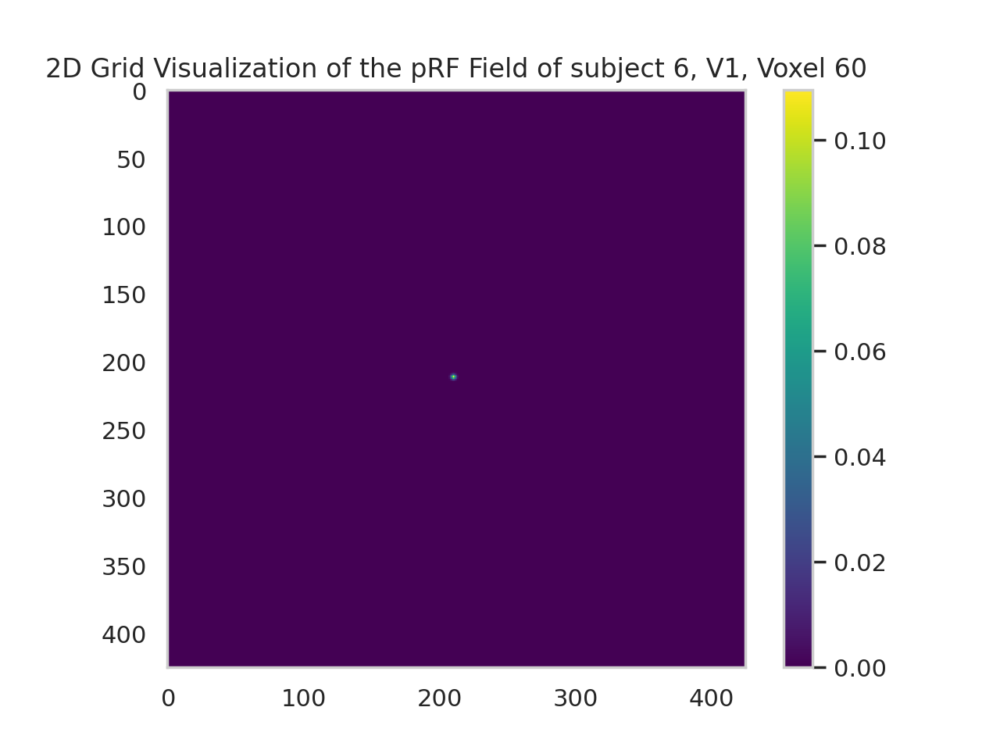

In [ ]:
# Use plt.imshow to visualize without grid lines

plt.imshow(vals, interpolation='none', cmap='viridis')
plt.colorbar()
plt.title(f'2D Grid Visualization of the pRF Field of subject {sub_num}, V1, Voxel {voxel_idx}')
plt.show()

### 3.3.3  Compute for all voxels and create a matrix *K* 
Shape: `(voxels x (pixels * pixels))` 

### 3.3.3.1 Function definition and execution "generate_voxel_maps()"

Generation of voxel maps based on the provided dataframe. 
Input of this function is a dataframe that contains information about voxels, including their coordinates and sigma values in pixel space. 

The function initializes an empty list for voxel_map, computes the voxel maps, and appends them to the list. 

In [272]:
prf_valid_df_v1

,roi,sigma,r2,size,ecc,angle,x_coord,y_coord,ecc_px
0,v1,1.188356,58.235668,0.148415,4.385573,287.467804,66.604401,-211.656876,221.889106
1,v1,0.541474,64.744690,0.085937,4.263033,290.105652,74.143639,-202.545166,215.689165
2,v1,3.790213,74.301102,0.599300,4.294058,278.947327,33.789505,-214.615219,217.258879
3,v1,0.775068,4.890471,0.028924,0.041125,126.884201,-1.248865,1.664288,2.080749
4,v1,0.129613,2.893370,0.010247,0.008996,185.389191,-0.453165,-0.042750,0.455177
...,...,...,...,...,...,...,...,...,...
931,v1,1.231818,24.892067,0.089696,0.246212,172.709076,-12.356441,1.580907,12.457162
932,v1,0.398155,31.449341,0.013858,0.139764,200.214111,-6.635865,-2.443379,7.071407
933,v1,0.761114,31.753546,0.120345,0.217614,167.509232,-10.749620,2.381317,11.010223
934,v1,0.264316,1.036602,0.008172,0.007652,50.877491,0.244293,0.300362,0.387165


In [273]:
prf_valid_df_v1.keys

<bound method NDFrame.keys of     roi     sigma         r2      size       ecc       angle     x_coord  \
0    v1  1.188356  58.235668  0.148415  4.385573  287.467804   66.604401   
1    v1  0.541474  64.744690  0.085937  4.263033  290.105652   74.143639   
2    v1  3.790213  74.301102  0.599300  4.294058  278.947327   33.789505   
3    v1  0.775068   4.890471  0.028924  0.041125  126.884201   -1.248865   
4    v1  0.129613   2.893370  0.010247  0.008996  185.389191   -0.453165   
..   ..       ...        ...       ...       ...         ...         ...   
931  v1  1.231818  24.892067  0.089696  0.246212  172.709076  -12.356441   
932  v1  0.398155  31.449341  0.013858  0.139764  200.214111   -6.635865   
933  v1  0.761114  31.753546  0.120345  0.217614  167.509232  -10.749620   
934  v1  0.264316   1.036602  0.008172  0.007652   50.877491    0.244293   
935  v1  0.056552   1.968396  0.009809  2.944073  181.663300 -148.893326   

        y_coord      ecc_px  
0   -211.656876  221.889106

In [ ]:
def generate_voxel_maps(dataframe: pd.DataFrame) -> np.array:
    """
    Generate voxel maps based on the provided dataframe. 

    Parameters
    ----------
    dataframe (pd.DataFrame): DataFrame containing voxel data including 'v1_sigma_px', 'y_coord', and 'x_coord'.

    Returns
    -------
    np.array: Array of voxel maps.
    """
    voxels_num = dataframe.shape[0] 
    # Resetting the index of the dataframe to 0 to avoid issues with the for loop
    dataframe = dataframe.reset_index(drop=True)

    # voxels_num = 10
    K_mat_slow = []
    
    ys, xs = np.mgrid[Y_SIZE:0:-1, 0:X_SIZE]
    ys -= Y_SIZE // 2
    xs -= X_SIZE // 2

    x1d = xs.ravel()
    y1d = ys.ravel()

    for voxel_idx in range(0,voxels_num):

        # For each voxel, the sigma and mu (mean coordinates) values are extracted from the DataFrame.
        sigma = dataframe["sigma"][voxel_idx]
        mu = [dataframe["y_coord"][voxel_idx],dataframe["x_coord"][voxel_idx]]
        
        print(f"Voxel {voxel_idx}, sigma = {sigma}, mu = {mu}")
        # print(f"Voxel {voxel_idx}")

         # Creation of the covariance matrix for the multivariate normal distribution - visualizing the pRF of a voxel
        cov_mat = np.eye(2) * sigma**2
        
        # If sigma is not zero, a multivariate normal distribution is created, 
        # and the probability density function (PDF) values are computed and reshaped.
        if sigma !=0:
            mvn = stats.multivariate_normal(mu, cov_mat)
            vals1d = mvn.pdf(np.vstack((y1d, x1d)).T)# 160000 x 1 
            vals = vals1d.reshape(X_SIZE, Y_SIZE)

        # If sigma is zero, a zero matrix is created with a single pixel set to 1 at the mean coordinates.
        elif sigma == 0:
            # Create a matrix with where everything is 0 except at the pixels of x,y , where it's 1
            # So it will sum to 1
            vals = np.zeros((X_SIZE,Y_SIZE))
            vals[math.ceil(mu[1]),math.ceil(mu[0])] = 1
            vals1d = vals.reshape(-1)

        #Normalize the voxel map so that it integrates to 1
        vals1d = vals1d / vals1d.sum()

        # Append the vals1d array (flattened voxel map) to the voxel_map list
        K_mat_slow.append(vals1d)
        
    return np.array(K_mat_slow)

In [275]:
print(f"Expected voxel size: {Y_SIZE * X_SIZE}, Actual voxel size: {vals1d.shape[0]}")

Expected voxel size: 180625, Actual voxel size: 180625


In [ ]:
# This generates a voxel map over all voxels in the v1 region  of subject 1 
# with non-zero sigma values, however only 768 auf those 1350 are valid and in the receptive field 
# these are stored in the dataframe prf_v1_subj1_valid_df

K_mat_slow = generate_voxel_maps(prf_valid_df_v1)

# Print the shape of K_mat_slow
print(f"Shape of K_mat_slow: {K_mat_slow.shape}")

Voxel 0, sigma = 1.1883563995361328, mu = [-211.65687561035156, 66.60440063476562]
Voxel 1, sigma = 0.5414735674858093, mu = [-202.545166015625, 74.14363861083984]
Voxel 2, sigma = 3.7902133464813232, mu = [-214.61521911621094, 33.78950500488281]
Voxel 3, sigma = 0.7750675678253174, mu = [1.66428804397583, -1.2488653659820557]
Voxel 4, sigma = 0.12961266934871674, mu = [-0.042750440537929535, -0.4531651437282562]
Voxel 5, sigma = 0.11530162394046783, mu = [0.19133082032203674, -0.33053886890411377]
Voxel 6, sigma = 2.182569980621338, mu = [-66.8412094116211, 211.48959350585938]
Voxel 7, sigma = 0.9708117842674255, mu = [-73.32628631591797, 201.1046600341797]
Voxel 8, sigma = 1.0740137100219727, mu = [-73.01105499267578, 212.38626098632812]
Voxel 9, sigma = 0.7897476553916931, mu = [-62.74519729614258, 203.88385009765625]
Voxel 10, sigma = 4.59540319442749, mu = [-155.3712615966797, 3.858048677444458]
Voxel 11, sigma = 13.855671882629395, mu = [-153.9938507080078, 14.519079208374023]
Vo

### 3.3.3.2 Plot the voxel maps for 10 voxel and print the angle and sigma data 

1


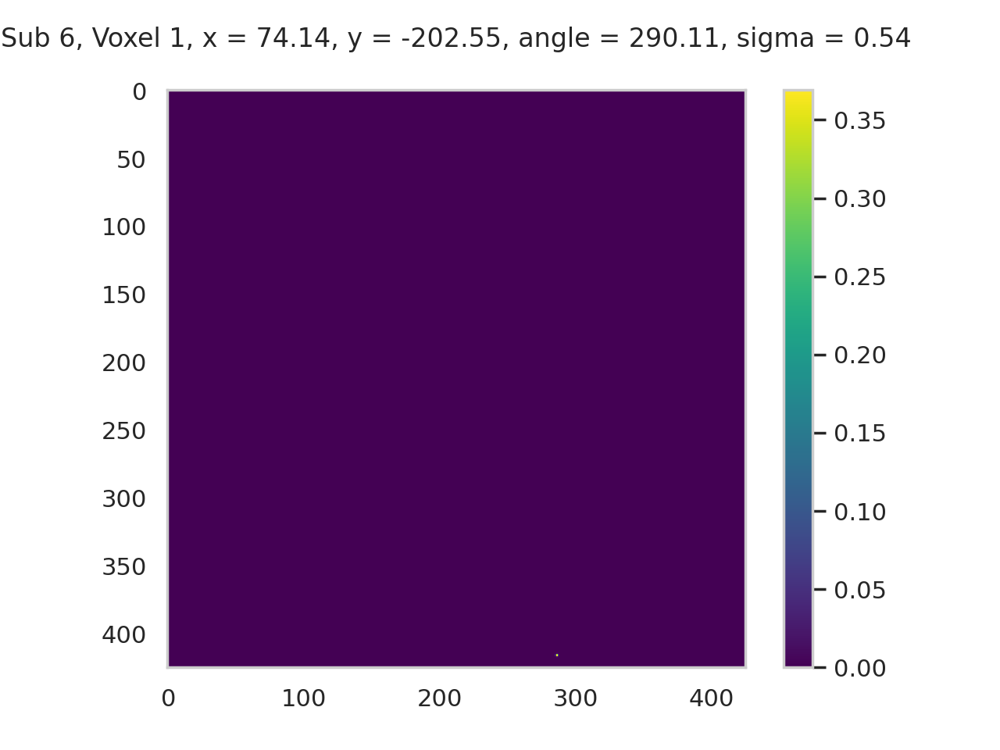

2


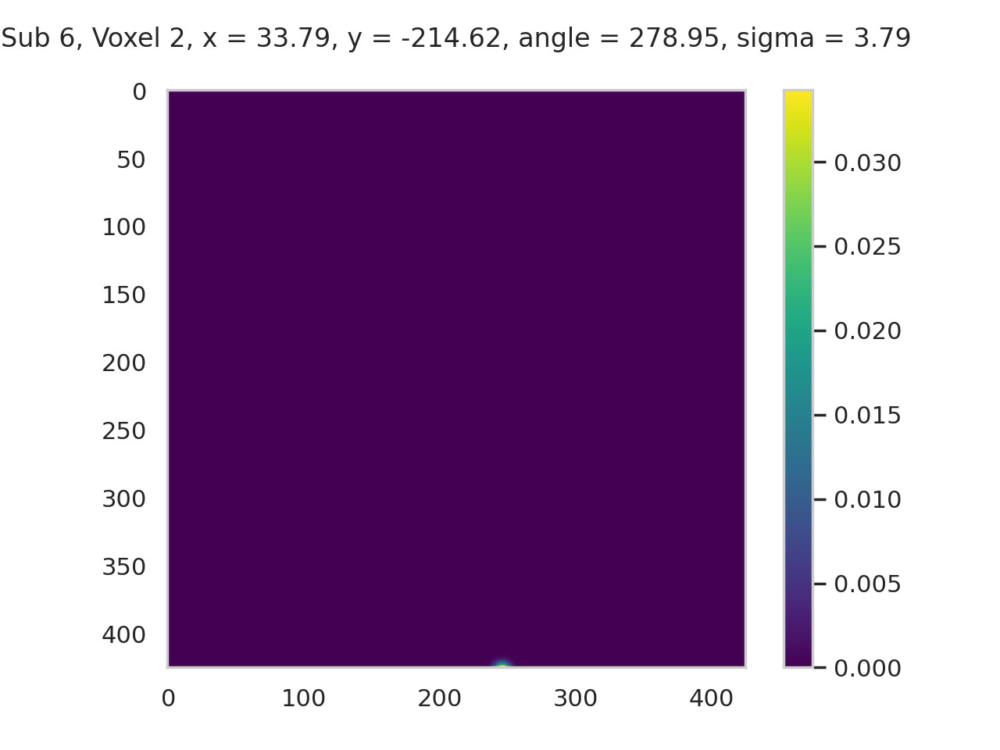

3


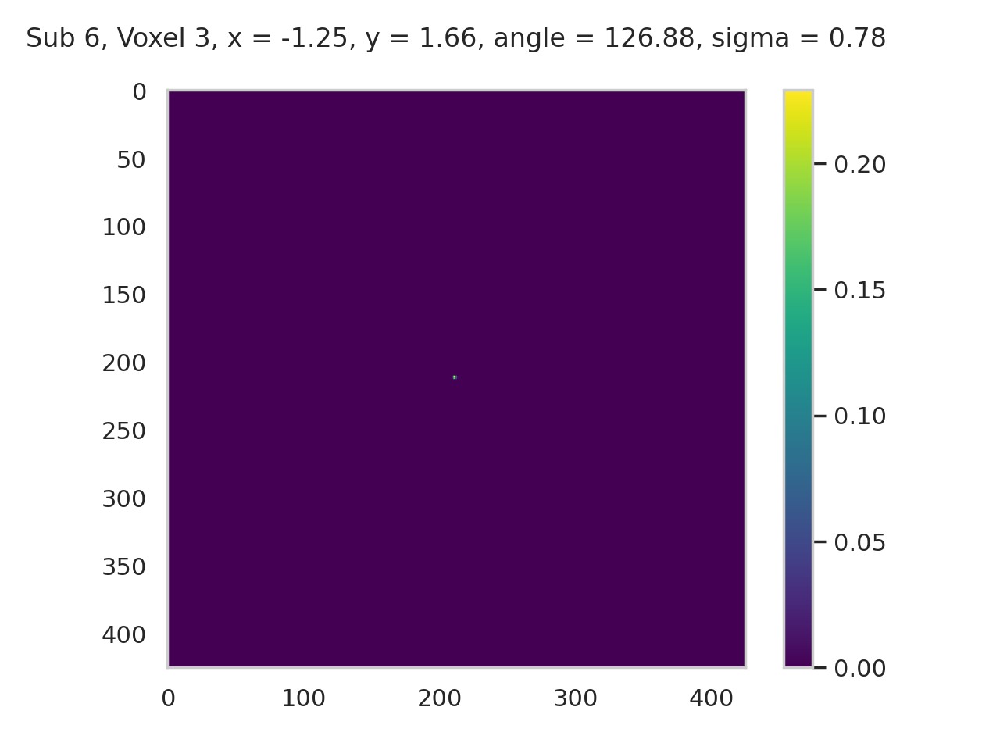

4


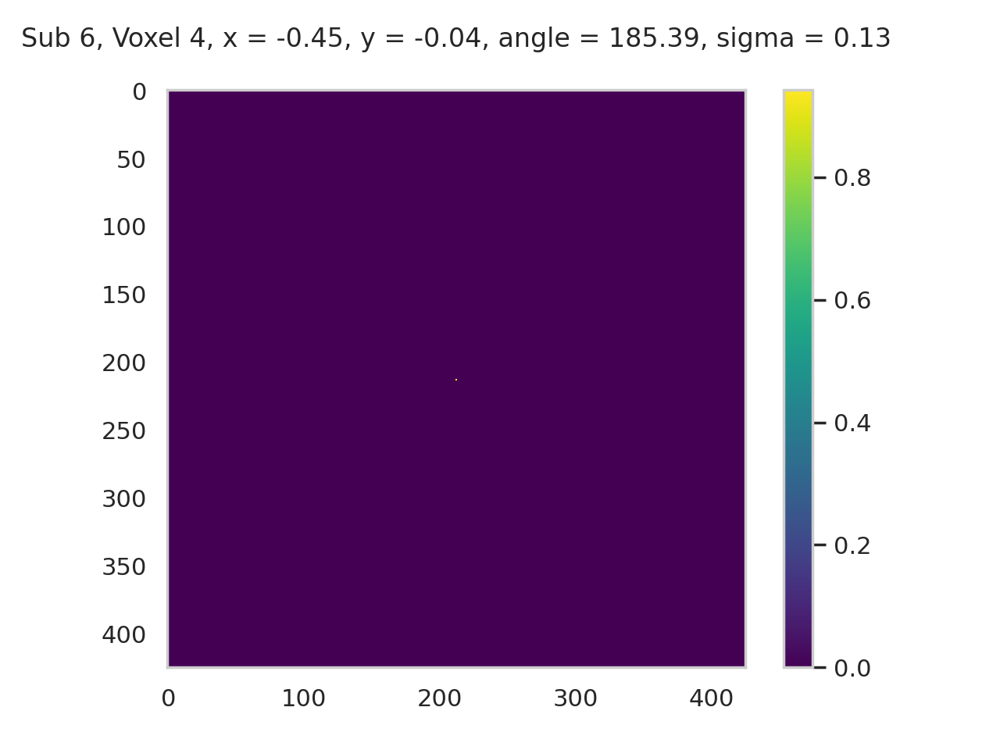

5


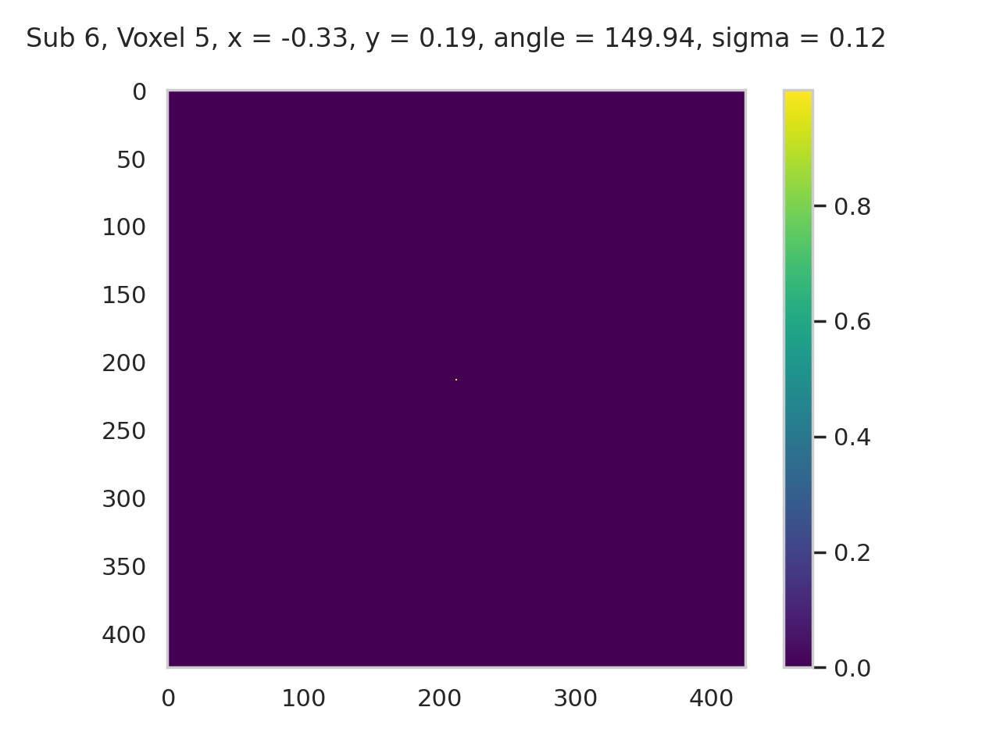

6


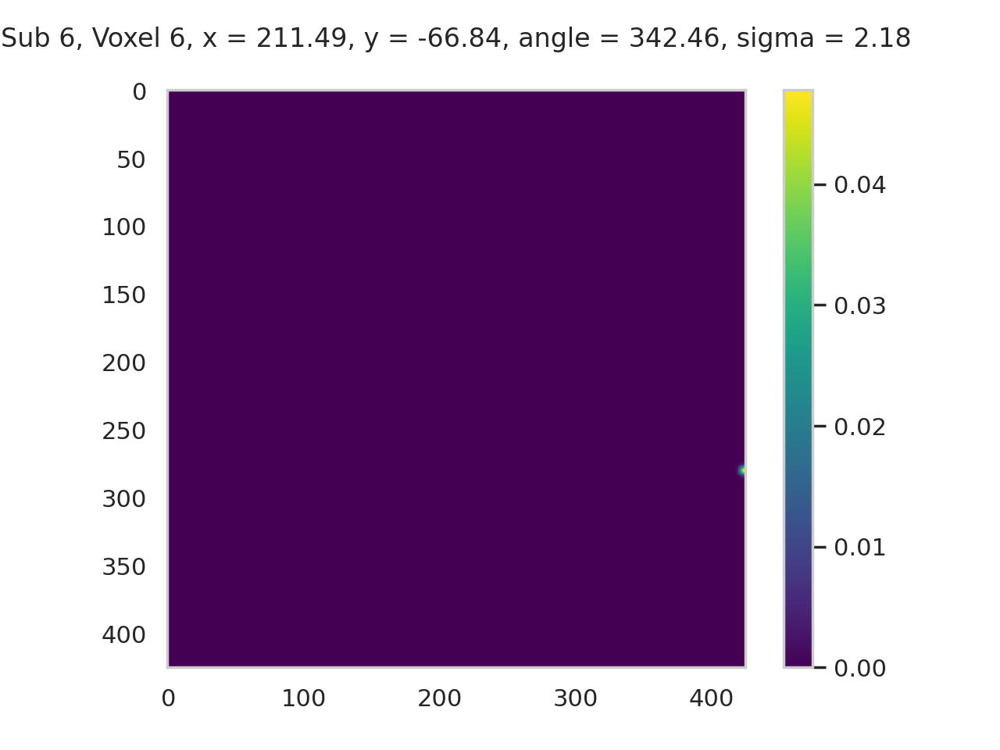

7


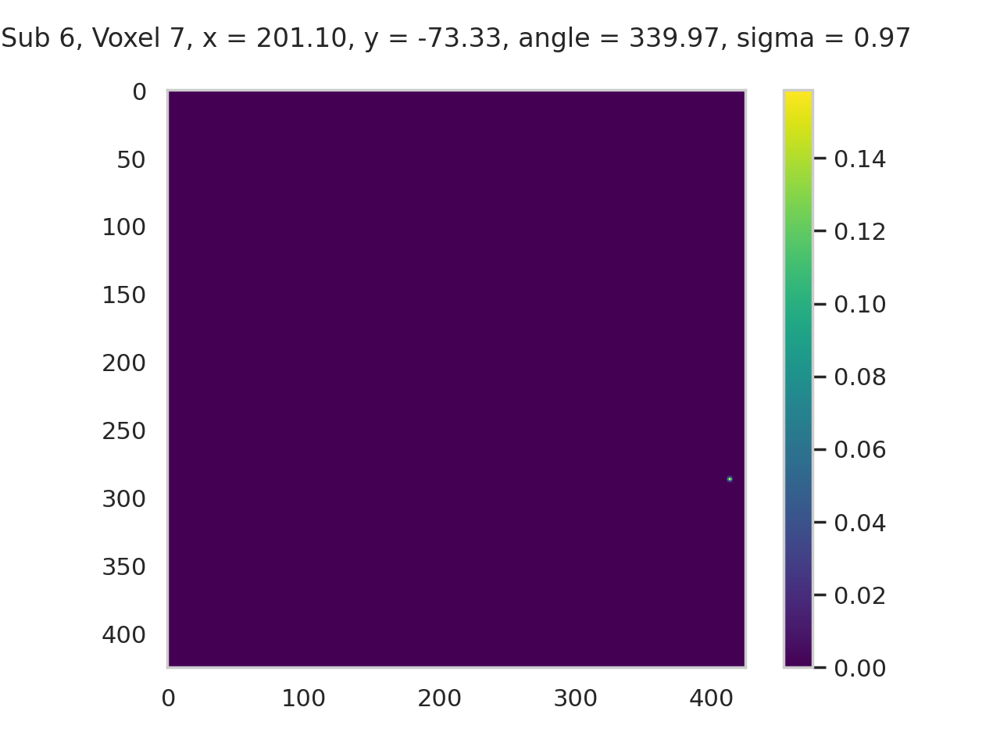

8


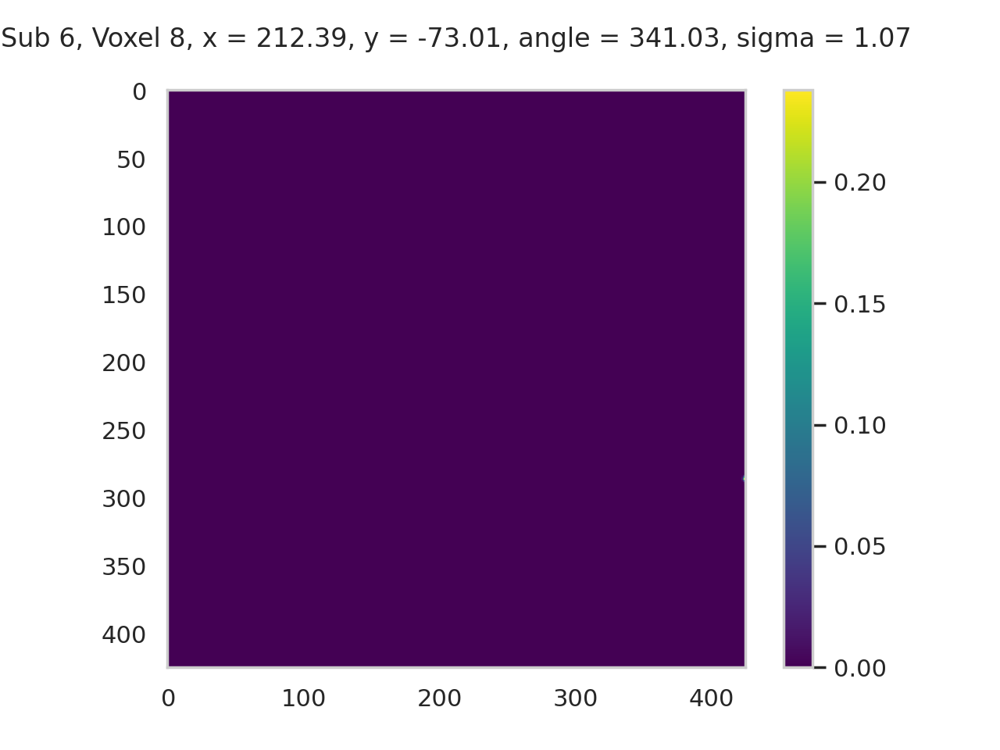

9


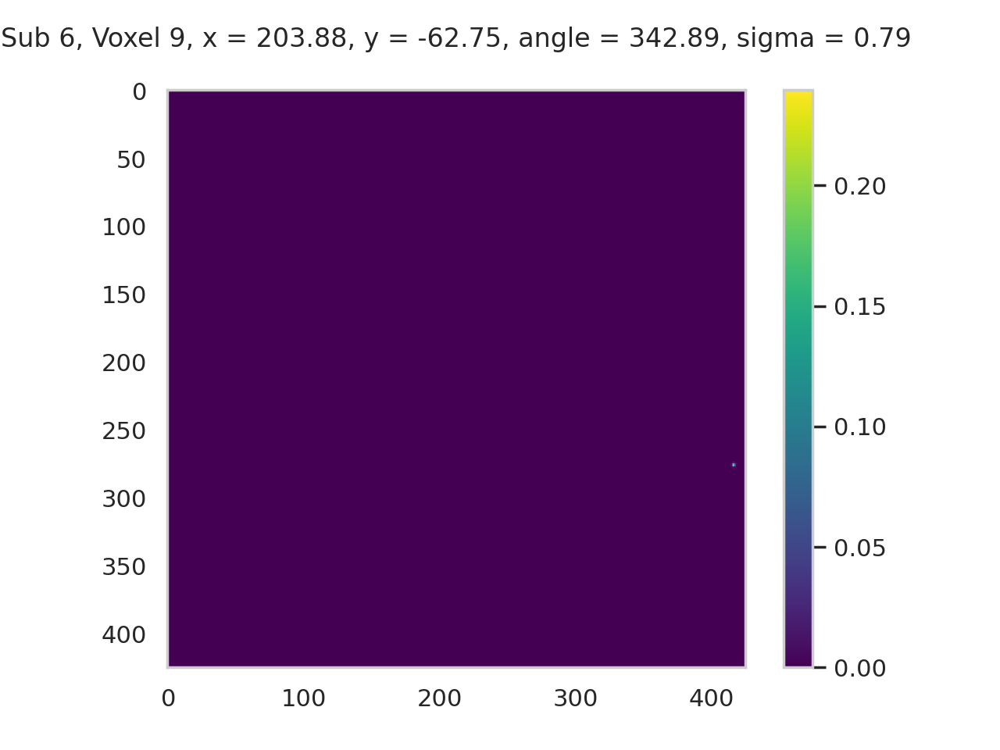

10


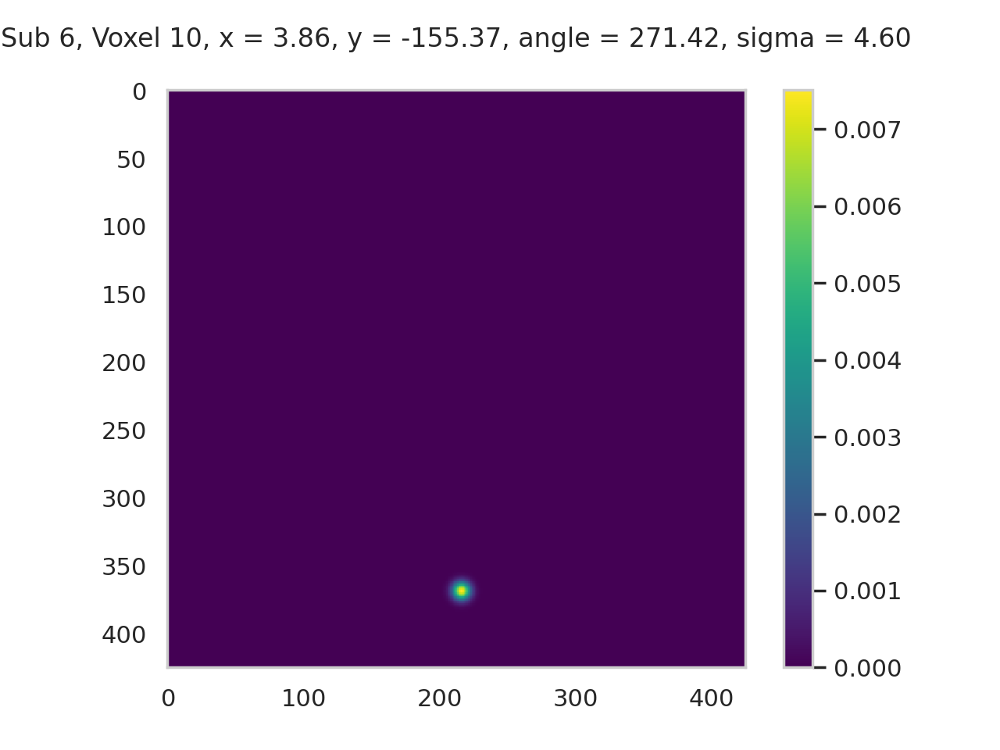

In [ ]:
# Plot the voxel maps for each voxel
# plot the first 10 PRFs of voxels on voxel.map[0]

for i in range(1,min(11, K_mat_slow.shape[0])):
    vals = K_mat_slow[i].reshape(X_SIZE, Y_SIZE)
    print(i)
    x_coord = prf_valid_df_v1["x_coord"][i]
    y_coord = prf_valid_df_v1["y_coord"][i]
    angle = prf_valid_df_v1["angle"][i]
    sigma = prf_valid_df_v1["sigma"][i]
    
    # Increasing the pad value to move the title upwards and loc parameter to center the title 
    plt.title(f'Sub {sub_num}, Voxel {i}, x = {x_coord:.2f}, y = {y_coord:.2f}, angle = {angle:.2f}, sigma = {sigma:.2f}', pad=20, loc='center')     
    plt.imshow(vals, interpolation='none')
    plt.colorbar()
    plt.show()

### 3.3.3.3 - Saving the K matrix generated with the sequential approach processing through every voxel - K_mat_subj1_V1

In [ ]:
# Voxel_map stores the voxel maps for each voxel in the v1 region, with the squential approach 
K_mat_slow

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [279]:
K_mat_slow.shape

(936, 180625)

In [280]:
# Compressing the voxel map to float32
K_mat_slow_compr = np.float32(K_mat_slow)

### 3.3.4 Einstein summation for faster processing of mutliple voxels

In [ ]:
# Print the shape and head with a few rows of the dataframe to verify
prf_valid_df_v1.head()

,roi,sigma,r2,size,ecc,angle,x_coord,y_coord,ecc_px
0,v1,1.188356,58.235668,0.148415,4.385573,287.467804,66.604401,-211.656876,221.889106
1,v1,0.541474,64.744690,0.085937,4.263033,290.105652,74.143639,-202.545166,215.689165
2,v1,3.790213,74.301102,0.599300,4.294058,278.947327,33.789505,-214.615219,217.258879
3,v1,0.775068,4.890471,0.028924,0.041125,126.884201,-1.248865,1.664288,2.080749
4,v1,0.129613,2.893370,0.010247,0.008996,185.389191,-0.453165,-0.042750,0.455177


In [ ]:
# Save the indices of the valid voxels to a NumPy file
print (DATA_PATH_subj)

np.save(DATA_PATH_subj/f'v1_valid_indices_subj{sub_num}.npy',prf_valid_df_v1.index)
# Print confirmation of the saved file
print("File saved successfully")


/gpfs01/bartels/user/lheinemann/nsd-static-saliency/data/subjectwise_data/subject06
File saved successfully


In [283]:
# ONLY FOR V1 - Subj1 
voxels_num = prf_valid_df_v1.shape[0] # 4165 voxels 

# Create a list for sigma_px in the function load_prf_data sigma is already calculated to be in pixel space
sigma = prf_valid_df_v1["sigma"]
cov_mat = sigma **2 

In [284]:
prf_valid_df_v1.min(axis=0)

roi                v1
sigma        0.029901
r2            0.06662
size         0.005821
ecc          0.001984
angle         0.39587
x_coord   -254.903137
y_coord   -254.248413
ecc_px       0.100363
dtype: object

#### Extend Einstein Summation to all ROIs 

#### Load prf_df_subj1_all_rois

In [ ]:
# Print the head of the dataframe prf_df_subj1_all_rois

prf_valid_dict_dfs_all_rois.keys()
combined_prf_valid_df_subj.head()

# V1
prf_valid_dict_dfs_all_rois['v1'].head()
# V2
prf_valid_dict_dfs_all_rois['v2'].head()

,roi,sigma,r2,size,ecc,angle,x_coord,y_coord
936,v2,23.607101,50.341572,1.549260,2.492738,311.583832,83.708199,-94.336418
937,v2,18.420057,77.744690,1.456268,3.291843,318.968933,125.638824,-109.335831
938,v2,7.775805,75.572380,1.229492,2.825619,305.392609,82.800629,-116.543724
939,v2,0.479370,16.063702,0.075797,4.363520,292.346497,83.939522,-204.193573
940,v2,7.416218,84.027092,1.255033,2.694569,309.224426,86.211044,-105.613281


In [286]:
combined_prf_valid_df_subj.head()

,roi,sigma,r2,size,ecc,angle,x_coord,y_coord
0,v1,1.188356,58.235668,0.148415,4.385573,287.467804,66.604401,-211.656876
1,v1,0.541474,64.744690,0.085937,4.263033,290.105652,74.143639,-202.545166
2,v1,3.790213,74.301102,0.599300,4.294058,278.947327,33.789505,-214.615219
3,v1,0.775068,4.890471,0.028924,0.041125,126.884201,-1.248865,1.664288
4,v1,0.129613,2.893370,0.010247,0.008996,185.389191,-0.453165,-0.042750


#### 3.3.4.1 Function definition "generate_df_prfdata_roi_specific()"

Function that loads the dataframe prf_df_subj1_all_rois and generates a dataframe prf_df_roi (e.g prf_df_v1_roi) specific for the roi. 

This dataframe contains all the relevant pRF data for one ROI to create matrix K:
- roi specific angle data 
- roi specific eccentricity data 
- roi specific sigma data
- roi specific eccentricity pixel data 
- roi specific sigma pixel data
- x coordinates in pixel space 
- y coordinates in pixel space 

In [ ]:
def generate_df_prfdata_roi_specific(roi: str) ->  pd.DataFrame:  
    '''
    Create a seperate dataframe for each of the ROI

    Parameters
    ----------
    roi (str): Region of interest (ROI) for which to extract pRF data.

    Returns
    -------
    pd.DataFrame: DataFrame containing the pRF parameters for the specified ROI.

    
    '''
    
    prf_df_roi = prf_valid_dict_dfs_all_rois[roi][['angle','ecc','sigma']].dropna()
    prf_df_roi['ecc_px'] = prf_df_roi['ecc']*stim_sz_px/stim_sz_deg # 425/8.4
    
    return prf_df_roi

In [288]:
# Function call "generate_df_prfdata_roi_specific" to get the pRF data for the V1 ROI
prf_df_v1_roi = generate_df_prfdata_roi_specific("v1")

prf_df_v1_roi.head()

,angle,ecc,sigma,ecc_px
0,287.467804,4.385573,1.188356,221.889106
1,290.105652,4.263033,0.541474,215.689165
2,278.947327,4.294058,3.790213,217.258879
3,126.884201,0.041125,0.775068,2.080749
4,185.389191,0.008996,0.129613,0.455177


In [289]:
# Function call "generate_df_prfdata_roi_specific" to get the pRF data for the V2 ROI
prf_df_v2_roi = generate_df_prfdata_roi_specific("v2")

prf_df_v2_roi.head()

,angle,ecc,sigma,ecc_px
936,311.583832,2.492738,23.607101,126.120661
937,318.968933,3.291843,18.420057,166.551601
938,305.392609,2.825619,7.775805,142.962865
939,292.346497,4.363520,0.479370,220.773317
940,309.224426,2.694569,7.416218,136.332354


Extend to the other ROIs and write a loop to generate_df_prfdata for all ROIs

In [ ]:
# Look for a list where all ROIs are stored 
# for mtl_faces angle, ecc, sigma data are not stored in the columns

all_rois_complete = ["v1","v2","v3","v4",
           "ofa","ffa1", "ffa2","mtl_faces", "atl",
           "eba","fba1", "fba2","mtl_bodies",
           "opa", "ppa", "rsc",
           "owfa", "vwfa_1", "vwfa_2", "mfs_words", "mtl_words",

           "vo1","vo2","phc1","phc2","mst","hmt","lo2","lo1",
           "v3b","v3a","ips0","ips1","ips2","ips3","ips4",
           "ips5","spl1","fef"]

for roi in all_rois_complete:
    try: 
        print(f"Processing ROI: {roi}")
        prf_df_roi = generate_df_prfdata_roi_specific(roi)
        prf_df_roi.to_pickle(DATA_PATH/ f'subjectwise_data/subject0{sub_num}/prf_df_subj{sub_num}_{roi}_roi.pkl')
    except KeyError as e:
        print(f"Skipping ROI {roi} due to missing columns: {e}")

print("Loop execution completed.")


Processing ROI: v1
Processing ROI: v2
Processing ROI: v3
Processing ROI: v4
Processing ROI: ofa
Processing ROI: ffa1
Processing ROI: ffa2
Processing ROI: mtl_faces
Processing ROI: atl
Processing ROI: eba
Processing ROI: fba1
Processing ROI: fba2
Processing ROI: mtl_bodies
Processing ROI: opa
Processing ROI: ppa
Processing ROI: rsc
Processing ROI: owfa
Processing ROI: vwfa_1
Processing ROI: vwfa_2
Processing ROI: mfs_words
Processing ROI: mtl_words
Processing ROI: vo1
Processing ROI: vo2
Processing ROI: phc1
Processing ROI: phc2
Processing ROI: mst
Processing ROI: hmt
Processing ROI: lo2
Processing ROI: lo1
Processing ROI: v3b
Processing ROI: v3a
Processing ROI: ips0
Processing ROI: ips1
Processing ROI: ips2
Processing ROI: ips3
Processing ROI: ips4
Processing ROI: ips5
Processing ROI: spl1
Processing ROI: fef
Loop execution completed.


In [291]:
# Load the pRF data from the saved pickle files for each ROI
for roi in all_rois:
    try:
        #print(f"Processing ROI: {roi}")
        prf_df_roi = pd.read_pickle(DATA_PATH/ f'subjectwise_data/subject0{sub_num}/prf_df_subj{sub_num}_{roi}_roi.pkl')
        #print(f"Loaded data for ROI: {roi}")
    except FileNotFoundError as e:
        print(f"File not found for ROI {roi}: {e}")

In [292]:
# Save pandas datasets for the 4 subjects to disk
# ### 2.6 Save pRF Dataframes for All ROIs per Subject to Disk

# Save the combined DataFrame to a CSV file
#combined_prf_valid_df_subj.to_csv(DATA_PATH_subj / f"prf_valid_df_{sub_num}.csv", index=False)
# TODo: however, was already done before 
#prf_df_subj2_all_rois.to_pickle(DATA_PATH/'subjectwise_data/subject02/prf_df_subj2_all_rois.pkl')
#prf_df_subj3_all_rois.to_pickle(DATA_PATH/'subjectwise_data/subject03/prf_df_subj3_all_rois.pkl')
#prf_df_subj4_all_rois.to_pickle(DATA_PATH/'subjectwise_data/subject04/prf_df_subj4_all_rois.pkl')

#### 3.3.4.2 Functionalize Einstein Summation for all ROIs

In [ ]:
# Function get_no_of_nans counts the number of NaN values in an NumPy array
def get_no_of_nans(arr):
    # Return the number of NaN values in the input array
    return np.count_nonzero(np.isnan(arr))

### Function definition "gen_prf_maps_einstein()"
Steps: 

1. Replace zero sigma values with the smallest non-zero sigma value.
2. Filter valid coordinates within a specified range.
3. Save valid voxel indices to disk.
4. Perform Einstein summation to calculate the pRF maps:
    - Compute the inverse of the covariance matrices.
    - Calculate the difference between coordinate pairs and pRF centers.
    - Compute the exponent part of the multivariate PDF.
    - Calculate the pRF maps and normalize them.
5. Remove voxels with zero-sum PDFs.
6. Return the pRF maps and the non-zero sum mask.

In [ ]:
def gen_prf_maps_einstein(df: dict, roi: str) -> np.array:

    """ Generate pRF maps for a given ROI using the Einstein summation method.
    
    Parameters
    ----------
    df : Dictionary 
        Dictionarry containing pandas DataFrames containing voxel data.
    roi : str
        Region of interest (ROI) for which to generate pRF maps.

    Returns
    -------
     np.array
        Array of pRF maps = K of the equation y= K*x
        pdfs : np.array
        non_zero_sum_mask : np.array 
        (Mask indicating which voxels have non-zero PDF sums)
    """
    df_valid = df[roi]
    """
    # TODO: The executions above should not be neccessary becaus the sigma will not be zero, already
    # filterd in load_prf_data()
    # Replace zero sigmas with the next highest value
    if 'sigma' in df_valid.columns:
        min_val_nonzero = df_valid['sigma'][df_valid['sigma'] != 0].min(axis=0)
    else:
        raise KeyError("Column 'sigma' not found in the DataFrame.") 
    df_valid = df.copy()
    
    # Filter valid coordinates
    # TODO: Check wether this step is still neccessary 
    # Replace zero sigmas with the minimum non-zero value
    df_valid['sigma'] = df_valid['sigma'].replace(0, min_val_nonzero)"""
    

######## Start of Einstein Summation ########
    
    voxels_num = df_valid.shape[0] # 4165 voxels - Number of voxels

    # Load the sigma values from the prf_df_roi dataframe
    sigma = df_valid['sigma']

    # The squaring of sigma (= standard deviance)= variance values results in the values of the covariance matrix
    cov_mat = sigma **2 
    
    # Invert all covariance matrices in one go using the fact that the inverse of a
    # diagonal matrix is a diagonal matrix with diagonal elements replaced by the
    # reciprocals of the original diagonal matrix
    cov_mat_arr = cov_mat.to_numpy().reshape((1,1,-1)) # (1, 1, 4165)    
    
    cov_mat_inv = np.stack([np.eye(2)] * voxels_num, axis = 2) / cov_mat_arr # (2, 2, 4165)
    
    mu_arr = np.array( [df_valid["y_coord"].to_numpy() ,df_valid["x_coord"].to_numpy()]) # (2, 4165)
   
    
    # Turn all points in the image into an array of x, y coordinate pairs and
    # and expand with the number of voxels
    X = np.stack([coord_pairs] * voxels_num, axis = 2)  # (180625, 2, 4165)
    
    # Subtract the pRF means from each of these coordinate pairs so that
    # coordinates are relative to pRF center
    delta_X = X - mu_arr
    
    # Calculate first part of exponent in multivariate PDF for all voxels at all iamges
    F1 = np.einsum('ij...,jk...', delta_X, cov_mat_inv)
    
    # Proceed with the second part of the calculation in the exponent, i.e.:
    F2 = np.einsum('...i,...i', F1, delta_X.transpose(2, 0, 1))
    
    # Divide exponent by -2 and compute power
    pdfs = np.exp(-.5 * F2) # 4165 x 180625 i.e. (voxels x (img_size*img_size))

    ########## Section criteria 3 to prove for valid voxels - Remove voxels with zero PDF sum #########
    
    # Sanity check, wether the PDFs sum to 1
    print(f"No of Voxels with PDF summing to zero (will be removed): {(pdfs.sum(axis=1) == 0).sum()}") # Take sum across each voxel 

    # PDFs that sum to zero will have a 1 placed at the location of the pRF center in pixel space
    # First, find the indices of the voxels whose PDFs sum to zero
    zero_sum_ids = np.where(pdfs.sum(axis=1) == 0)[0]
    for zsi in zero_sum_ids:
        # Distance of each pixel from the pRF center of this voxel
        cur_dist = np.sqrt(np.sum(delta_X[:, :, zsi] ** 2, axis=1))
        # Find the index of the pixel with the minimum distance
        min_dist_idx = np.argmin(cur_dist)
        # Set the PDF value at this index to 1
        pdfs[zsi, min_dist_idx] = 1
    
    # Check that no PDFs remain that sum to zero
    assert np.all(pdfs.sum(axis=1) != 0), "Some PDFs still sum to zero after correction"

    # Remove the voxels whose PDFs sum to zero 
    sum_across_voxels = pdfs.sum(axis=1)
    non_zero_sum_mask = (sum_across_voxels != 0)
    pdfs = pdfs[non_zero_sum_mask]

    # Also remove those voxels from the prf_valid_dct_dfs_all_rois
    df_valid = df_valid[non_zero_sum_mask]
    # Save the indices of the valid voxels to a NumPy file
    np.save(DATA_PATH_subj/f"valid_indices_subj{sub_num}_{roi}.npy",df_valid.index)
    
    # Instead of calculating the factor outside the power, simply rescale PDFs so that they integrate to 1.
    pdfs = pdfs / np.tile(pdfs.sum(axis=1), (X_SIZE * Y_SIZE, 1)).T #(4165, 180625)

    # Print the type and shape of the PDF matrix to understand the structure 
    print(type(pdfs))
    print(f"PDF matrix shape: {pdfs.shape}")

    # print(f"No of Voxels with PDF summing to zero: {(pdfs.sum(axis=1) == 0).sum()}")
    return pdfs, non_zero_sum_mask

In [295]:
DATA_PATH

PosixPath('/gpfs01/bartels/user/lheinemann/nsd-static-saliency/data')

In [ ]:
# Function call "gen_prf_maps_einstein" to generate pRF maps for the V1 ROI

pdfs_v1_prf = gen_prf_maps_einstein(prf_valid_dict_dfs_all_rois, 'v1')

No of Voxels with PDF summing to zero (will be removed): 0
<class 'numpy.ndarray'>
PDF matrix shape: (936, 180625)


In [297]:
pdfs_v1_prf

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True

In [298]:
# Only access the first array of the pdfs_v1_prf tuple for the pdfs 
pdfs_v1_prf[0]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [299]:
voxels_num = prf_df_v1_roi.shape[0]
print (voxels_num) # 1350 voxels for V1 -- for a resolution of 1.8 mm (for 1mm resolution in Hardiks code it was 4165 voxels for v1) 

936


### Example for V1: Save the non_zero_sum_mask and K_mat_subj

In [ ]:
roi= 'v1'

# Save the pRF maps = K matrix for subj1 to disk
np.save(DATA_PATH / f'subjectwise_data/subject0{sub_num}/K_mat_subj0{sub_num}_{roi}.npy', pdfs_v1_prf[0])
# Save the non_zero_sum_mask to disk
np.save(DATA_PATH / f'subjectwise_data/subject0{sub_num}/Non_Zero_Sum_Mask_K_mat_subj0{sub_num}_{roi}.npy', pdfs_v1_prf[1])

# Print the paths 

#print(DATA_PATH / f'subjectwise_data/subject0{sub_num}/K_mat_subj0{sub_num}_{roi}.npy', pdfs_v1_prf[0])
#print(DATA_PATH / f'subjectwise_data/subject0{sub_num}/Non_Zero_Sum_Mask_K_mat_subj0{sub_num}_{roi}.npy', pdfs_v1_prf[1])

# Shape for V1: 768, 180625 with 1.8mm spatial resolution

### Function definition "get_rois_from_df()"

In [301]:
def get_rois_from_df(dataframe: pd.DataFrame) -> set:
    '''
    Extract the unique ROIs from the "roi" column of a DataFrame.

    Parameters
    ----------
    dataframe : pd.DataFrame
        DataFrame containing voxel data with an "roi" column.

    Returns
    -------
    set
        Set of unique regions of interest (ROIs) extracted from the "roi" column.
    '''
    if 'roi' not in dataframe.columns:
        raise ValueError("The DataFrame does not contain a 'roi' column.")
    
    # Extract unique ROIs from the "roi" column
    rois_from_df = set(dataframe['roi'].unique())
    return rois_from_df


In [302]:
# Function call "get_rois_from_df" for the dataframe prf_df_subj1_all_rois
print(get_rois_from_df(combined_prf_valid_df_subj))

{'v3a', 'fba2', 'eba', 'ips0', 'fef', 'atl', 'mfs_words', 'vwfa_2', 'rsc', 'vo2', 'lo2', 'v4', 'v3b', 'v2', 'mtl_bodies', 'owfa', 'ips1', 'mst', 'vwfa_1', 'ffa2', 'ppa', 'v1', 'ofa', 'ffa1', 'ips2', 'opa', 'ips5', 'v3', 'mtl_words', 'phc1', 'hmt', 'ips3', 'ips4', 'phc2', 'fba1', 'lo1', 'spl1', 'vo1'}


In [303]:
# Print the keys of the dictionary all_rois_df_dict_subj1
print(prf_valid_dict_dfs_all_rois.keys())

# Print head of the dictionary all_rois_df_dict_subj1
for key, value in prf_valid_dict_dfs_all_rois.items():
    print(f"Key: {key}")
    print(f"Value: {value.head()}")

dict_keys(['v1', 'v2', 'v3', 'v4', 'ofa', 'ffa1', 'ffa2', 'mtl_faces', 'atl', 'eba', 'fba1', 'fba2', 'mtl_bodies', 'opa', 'ppa', 'rsc', 'owfa', 'vwfa_1', 'vwfa_2', 'mfs_words', 'mtl_words', 'vo1', 'vo2', 'phc1', 'phc2', 'mst', 'hmt', 'lo2', 'lo1', 'v3b', 'v3a', 'ips0', 'ips1', 'ips2', 'ips3', 'ips4', 'ips5', 'spl1', 'fef'])
Key: v1
Value:   roi     sigma         r2      size       ecc       angle    x_coord  \
0  v1  1.188356  58.235668  0.148415  4.385573  287.467804  66.604401   
1  v1  0.541474  64.744690  0.085937  4.263033  290.105652  74.143639   
2  v1  3.790213  74.301102  0.599300  4.294058  278.947327  33.789505   
3  v1  0.775068   4.890471  0.028924  0.041125  126.884201  -1.248865   
4  v1  0.129613   2.893370  0.010247  0.008996  185.389191  -0.453165   

      y_coord      ecc_px  
0 -211.656876  221.889106  
1 -202.545166  215.689165  
2 -214.615219  217.258879  
3    1.664288    2.080749  
4   -0.042750    0.455177  
Key: v2
Value:     roi      sigma         r2      si

### Function definition "save_K_matrix_subjectwise()" - Einsteinsummation for all ROIS of the subject 

In [304]:
def save_K_matrix_subjectwise(sub_num):
    """
    Save the K matrix for a specific subject if it doesn't already exist.
    """

    subject_data_path = DATA_PATH / f'subjectwise_data/subject0{sub_num}'
    subject_data_path.mkdir(parents=True, exist_ok=True)
    
    # Generate the K matrix and save it
    # combined_prf_valid_df_subj1 = pd.read_pickle(DATA_PATH/ f'subjectwise_data/subject0{sub_num}/combined_prf_valid_df_subj{sub_num}_all_rois.pkl')
    # Adapt to several subjects 
    # all_roi_df_dict_subj = prf_valid_dict_dfs_all_rois
    rois_from_df = get_rois_from_df(combined_prf_valid_df_subj)
    
    print(f"Generating for subject: {sub_num} \n")
    
    for roi in tqdm(rois_from_df):
    # for roi_df, roi in zip(tqdm(all_roi_df_dict_subj), rois_from_df):

        # Check if the K matrix file already exists
        k_mat_file_path = subject_data_path / f'K_mat_subj0{sub_num}_{roi}.npy'
        print(f"Checking existence of: {k_mat_file_path}") 

        #if k_mat_file_path.exists():
            #print(f"K matrix for subject {sub_num}, ROI {roi} already exists. Skipping generation.")
            #continue # Skip to the next ROI if the K matrix already exists
        #else:
        print(f"Generating K matrix for subject {sub_num}, ROI {roi} ...")
        pdfs_roi, non_zero_mask_roi = gen_prf_maps_einstein(prf_valid_dict_dfs_all_rois, roi) 
        
        # Save the non_zero voxels' mask to disk 
        np.save(DATA_PATH_subj/f'v1_valid_indices_subj{sub_num}_{roi}.npy',non_zero_mask_roi)
        
        # TODO: Adapt this to Pathlib saving, probably does not work 
        np.save(k_mat_file_path, pdfs_roi, non_zero_mask_roi)

In [305]:
# TODO: Uncomment if you want to generate and save the K matrices via Einstein summation for all rois
# Or change sub_num to the desired subject number (1,2,3,4, ...) 
save_K_matrix_subjectwise(sub_num = sub_num)

Generating for subject: 6 



  0%|          | 0/38 [00:00<?, ?it/s]

Checking existence of: /gpfs01/bartels/user/lheinemann/nsd-static-saliency/data/subjectwise_data/subject06/K_mat_subj06_v3a.npy
Generating K matrix for subject 6, ROI v3a ...
No of Voxels with PDF summing to zero (will be removed): 0
<class 'numpy.ndarray'>
PDF matrix shape: (293, 180625)
Checking existence of: /gpfs01/bartels/user/lheinemann/nsd-static-saliency/data/subjectwise_data/subject06/K_mat_subj06_fba2.npy
Generating K matrix for subject 6, ROI fba2 ...
No of Voxels with PDF summing to zero (will be removed): 0
<class 'numpy.ndarray'>
PDF matrix shape: (181, 180625)
Checking existence of: /gpfs01/bartels/user/lheinemann/nsd-static-saliency/data/subjectwise_data/subject06/K_mat_subj06_eba.npy
Generating K matrix for subject 6, ROI eba ...
No of Voxels with PDF summing to zero (will be removed): 1
<class 'numpy.ndarray'>
PDF matrix shape: (2197, 180625)
Checking existence of: /gpfs01/bartels/user/lheinemann/nsd-static-saliency/data/subjectwise_data/subject06/K_mat_subj06_ips0.np

In [ ]:
# Load K_mat subj1 v1 
K_mat_subj1_v1 = np.load(DATA_PATH / f'subjectwise_data/subject0{sub_num}/K_mat_subj0{sub_num}_v1.npy')

# Shape of K_mat_subj1_v1
K_mat_subj1_v1.shape

(936, 180625)

## 3.4 Apply the Non_Zero_Mask for further selection of the valid voxels in df_valid to load only the beta data (Y) with the valid voxels in the correlation 

Cut out the voxels whose PDFs sum to 0 - saved in the non_zero_sum_mask applied in Einstein Summation of K 

In [307]:
sub_num

6

In [308]:
roi

'v1'

In [309]:
non_zero_sum_mask_roi = np.load(DATA_PATH/f'subjectwise_data/subject0{sub_num}/valid_indices_subj{sub_num}_{roi}.npy')

In [310]:
# Only access the third array of the pdfs_v1_prf tuple for the non_zero_sum_masks
# somehow only accesses the roi of v1 - sub2 977
# non_zero_sum_mask_roi = pdfs_v1_prf[1]

In [311]:
non_zero_sum_mask_roi

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [312]:
prf_valid_dict_dfs_all_rois[roi].shape

(936, 9)

In [313]:
prf_valid_dict_dfs_all_rois['v2'].shape

(1013, 8)

In [314]:
roi

'v1'

In [315]:
non_zero_sum_mask_roi.shape

(936,)

In [ ]:
# Ensure the mask is aligned with the DataFrame's index
if isinstance(non_zero_sum_mask_roi, pd.Series):
    non_zero_sum_mask_roi = non_zero_sum_mask_roi.reindex(prf_valid_dict_dfs_all_rois[roi].index, fill_value=False)

# Also remove those voxels from the prf_valid_dct_dfs_all_rois
#prf_valid_dict_dfs_all_rois[roi] = prf_valid_dict_dfs_all_rois[roi][non_zero_sum_mask_roi]
# Use .iloc if non_zero_sum_mask_roi is an index mask (list or array of indices)
prf_valid_dict_dfs_all_rois[roi] = prf_valid_dict_dfs_all_rois[roi].iloc[non_zero_sum_mask_roi]

# Save the indices of the valid voxels to a NumPy file
np.save(DATA_PATH_subj/f"valid_indices_subj{sub_num}_{roi}.npy",prf_valid_dict_dfs_all_rois[roi].index)

# Print the shape of the adapted dataframe, should not contain any 0 any more and can be now applied to 
# Load the beta maps (Y)
print(f"Shape of prf_valid_dict_dfs_all_rois[roi]: {prf_valid_dict_dfs_all_rois[roi].shape}")


Shape of prf_valid_dict_dfs_all_rois[roi]: (936, 9)


## 3.5 Visualization of examples of PDFs for each ROI

Take five random voxels from each of the ROI and print their PDFs side by side. 
Intuition is that as we go deeper, the PDFs would get more and more diffused 

In [ ]:
# Load the K matrices for the V1 and V2 ROIs for subject 1
for roi in ['v1','v2','v3']:
    k_mat_name = f"K_mat_subj0{sub_num}_{roi}.npy"
    print(k_mat_name)
    k_mat_roi = np.load(f"{DATA_PATH_subj}/{k_mat_name}")
    print(k_mat_roi.shape)

K_mat_subj06_v1.npy
(936, 180625)
K_mat_subj06_v2.npy
(1013, 180625)
K_mat_subj06_v3.npy
(1035, 180625)


### 3.5.1 Function definition "plot_example_pdfs_from_roi()"

In [ ]:
def plot_example_pdfs_from_roi(roi: str):
    """"
    Plot example probability density functions (PDFs) for a given ROI. The PDFs refer to the population receptive field maps (pRFs) 
    for different voxels in the ROI. The pRF maps represent the spatial distribution of neural response to the nsd natural scene images.
    This provides insight of how different parts of the visual field are represented in the brain. 

    Parameters
    ----------
    roi : str
        Region of interest (ROI) for which to plot example PDFs.

    """
    # Load the K matrix for the specified ROI 
    # The K matrix loaded here is generated with the Einstein summation method
    # The sequential approach can be loaded with the same code, just change the file name to "SlowComp_K_mat_subj01_{roi}.npy"  
    k_mat_name = f"K_mat_subj0{sub_num}_{roi}.npy"
    k_mat_roi = np.load(f"{DATA_PATH_subj}/{k_mat_name}")
    print(f"Loading PDFs for {roi} from {k_mat_name}...")

    # Plotting code 
    idx_list = random.sample(range(0,k_mat_roi.shape[0]),5)

    num_rows = 1
    num_cols = 5

    fig = plt.figure(figsize=(20, 20))

    for i, idx in enumerate(idx_list, start=1):
        plt.subplot(num_rows, num_cols, i)

        pdf_map = k_mat_roi[idx].reshape(425,425)
       
        plt.imshow(pdf_map, origin='upper',  interpolation='none', cmap='viridis')
        plt.title(f'Voxel {idx}')
        
    # Adjust layout and show the plot
    # fig.suptitle(f'{roi.upper()}')
    plt.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

    # Save the figure with minimal white space
    plt.savefig(f"{roi}_{sub_num}_example_pdfs.png", bbox_inches='tight')
    plt.show()
    plt.close(fig)

In [319]:
# # TODO: Uncomment if you want to plot the example PDFs for all ROIs 

""" # This code cell runs about 1 1/2 minute to generate the plots for all ROIs
for roi in rois:
    plot_example_pdfs_from_roi(roi) """

' # This code cell runs about 1 1/2 minute to generate the plots for all ROIs\nfor roi in rois:\n    plot_example_pdfs_from_roi(roi) '

## 3.6 Compare K_mat of slower way sequentially processing for each voxel and the K resulting from faster computing via Einstein summation

SlowComp_K_mat_subj01_v1.npy vs. K_mat_subj01_v1.npy.

In [ ]:
""" # Load the two matrices: 
# 1. the K matrix of the slower way of sequentially processing and
# 2. ... and the K matrix generated with einstein summation

K_mat_slow = K_mat_slow 
K_mat_einstein = pdfs_v1_prf[0]  #np.load(DATA_PATH / 'subjectwise_data/subject01/K_mat_subj01_v1.npy')
# Print the diffrenet shapes 
print(f"Shape of K matrix (Slow): {K_mat_slow.shape}")
print(f"Shape of K matrix (Einstein): {K_mat_einstein.shape}")

np.allclose(K_mat_slow, K_mat_einstein)

print(K_mat_slow.sum(axis=1))
print(K_mat_einstein.sum(axis=1))

# # Compare the head of the two matrices
# print(f"Head of K matrix (Slow): {K_mat_slow[:5]}")
# print(f"Head of K matrix (Einstein): {K_mat_einstein[:5]}")

# # Compare the tail of the two matrices
# print(f"Tail of K matrix (Slow): {K_mat_slow[-5:]}")
# print(f"Tail of K matrix (Einstein): {K_mat_einstein[-5:]}")

# # Count the non zero values in the two matrices
# print(f"Non zero values in K matrix (Slow): {np.count_nonzero(K_mat_slow)}")
# print(f"Non zero values in K matrix (Einstein): {np.count_nonzero(K_mat_einstein)}")

# TODO: The Einstein Matrix has 972 valid voxels because 5 PDFs were summing to zero
# And thus had to be removed  """

' # Load the two matrices: \n# 1. the K matrix of the slower way of sequentially processing and\n# 2. ... and the K matrix generated with einstein summation\n\nK_mat_slow = K_mat_slow \nK_mat_einstein = pdfs_v1_prf[0]  #np.load(DATA_PATH / \'subjectwise_data/subject01/K_mat_subj01_v1.npy\')\n# Print the diffrenet shapes \nprint(f"Shape of K matrix (Slow): {K_mat_slow.shape}")\nprint(f"Shape of K matrix (Einstein): {K_mat_einstein.shape}")\n\nnp.allclose(K_mat_slow, K_mat_einstein)\n\nprint(K_mat_slow.sum(axis=1))\nprint(K_mat_einstein.sum(axis=1))\n\n# # Compare the head of the two matrices\n# print(f"Head of K matrix (Slow): {K_mat_slow[:5]}")\n# print(f"Head of K matrix (Einstein): {K_mat_einstein[:5]}")\n\n# # Compare the tail of the two matrices\n# print(f"Tail of K matrix (Slow): {K_mat_slow[-5:]}")\n# print(f"Tail of K matrix (Einstein): {K_mat_einstein[-5:]}")\n\n# # Count the non zero values in the two matrices\n# print(f"Non zero values in K matrix (Slow): {np.count_nonzero(K_

In [321]:
#np.allclose(K_mat_slow, K_mat_einstein)

### 3.7.1 Comparison of the differently generated K_mats and the visualization of the pRFs of a single voxel  

In [322]:
""" n_voxels_to_show = 10

voxel_number = np.random.randint(0, K_mat_slow.shape[0], n_voxels_to_show)
# voxel_number = (5,11,2,3,4,50,6,7,8,9)
px_v = px_h = 425

f = plt.figure(figsize=(10, n_voxels_to_show * 5))

for cur_plot_num, cur_vox_num in enumerate(voxel_number):

    cur_K_slow = K_mat_slow[cur_vox_num, :].reshape(px_v, px_h)
    cur_K_ein = K_mat_einstein[cur_vox_num, :].reshape(px_v, px_h)

    ax = f.add_subplot(n_voxels_to_show, 3, cur_plot_num * 3 + 1)
    ax.matshow(cur_K_slow,interpolation='none', cmap='viridis') 
    ax.set_title(f"Voxel {cur_vox_num} (Slow)")

    ax = f.add_subplot(n_voxels_to_show, 3, cur_plot_num * 3 + 2)
    ax.matshow(cur_K_ein,interpolation='none', cmap='viridis')
    ax.set_title(f"Voxel {cur_vox_num} (Einstein)")

    # Caluclation of the pRF maps of a single voxel_number 
    # The corresponding sigma (size of the receptve field) and mu (center of the receptive field) 
    # for this voxel are extracted from the prf_v1_subj1 dataframe
    sigma = prf_valid_df_v1["sigma"].iloc[cur_vox_num]
    mu = [prf_valid_df_v1["y_coord"].iloc[cur_vox_num], prf_valid_df_v1["x_coord"].iloc[cur_vox_num]]

    # Creation of the covariance matrix for the multivariate normal distribution - visualizing the pRF of a voxel
    cov_mat = np.eye(2) * sigma**2

    if sigma !=0:
        mvn = stats.multivariate_normal(mu, cov_mat)
        vals1d = mvn.pdf(np.vstack((y1d, x1d)).T)
        vals = vals1d.reshape(px_v, px_h)


    elif sigma == 0:
        # Create a 2d space with everything 0 except at the x,y position 
        vals = np.zeros((px_v,px_h))
        vals[math.ceil(mu[1]),math.ceil(mu[0])] = 1
        vals1d = vals.reshape(-1)
    
    # Compare this in a third row to the pRFs of single voxels
    ax = f.add_subplot(n_voxels_to_show, 3, cur_plot_num * 3 + 3)
    ax.imshow(vals, interpolation='none', cmap='viridis')
    ax.set_title(f' Voxel {cur_vox_num} (prf Map)')

# Adjust layout to remove white space
plt.tight_layout()

# Show the plot
plt.show() """

' n_voxels_to_show = 10\n\nvoxel_number = np.random.randint(0, K_mat_slow.shape[0], n_voxels_to_show)\n# voxel_number = (5,11,2,3,4,50,6,7,8,9)\npx_v = px_h = 425\n\nf = plt.figure(figsize=(10, n_voxels_to_show * 5))\n\nfor cur_plot_num, cur_vox_num in enumerate(voxel_number):\n\n    cur_K_slow = K_mat_slow[cur_vox_num, :].reshape(px_v, px_h)\n    cur_K_ein = K_mat_einstein[cur_vox_num, :].reshape(px_v, px_h)\n\n    ax = f.add_subplot(n_voxels_to_show, 3, cur_plot_num * 3 + 1)\n    ax.matshow(cur_K_slow,interpolation=\'none\', cmap=\'viridis\') \n    ax.set_title(f"Voxel {cur_vox_num} (Slow)")\n\n    ax = f.add_subplot(n_voxels_to_show, 3, cur_plot_num * 3 + 2)\n    ax.matshow(cur_K_ein,interpolation=\'none\', cmap=\'viridis\')\n    ax.set_title(f"Voxel {cur_vox_num} (Einstein)")\n\n    # Caluclation of the pRF maps of a single voxel_number \n    # The corresponding sigma (size of the receptve field) and mu (center of the receptive field) \n    # for this voxel are extracted from the p

In [323]:
#K_mat_slow.shape, K_mat_einstein.shape, prf_valid_df_v1.shape

In [324]:
""" ##### 
# Comparison of the two matrices of slow_comp and einstein computation
# ##### 

K_mat_slow 
K_mat_einstein 

# Print the maximum value of both 
print (f"K_mat_slow maximum value: {K_mat_slow.max()}")
print (f"K_mat_einstein maximum value: {K_mat_einstein.max()}")

# Method 1: Element-wise comparison
are_equal = np.array_equal(K_mat_slow, K_mat_einstein)
print(f"K_mat_slow and K_mat_einstein are equal: {are_equal}")

# Method 2: Element-wise comparison with tolerance
are_close = np.allclose(K_mat_einstein, K_mat_slow, atol=1e-8)
print(f"K_mat_slow and K_mat_einstein are approximately equal: {are_close}")

# Method 3: Difference matrix
difference = K_mat_slow - K_mat_einstein
print(f"Difference between K_mat_slow and K_mat_einstein:\n{difference}") """

' ##### \n# Comparison of the two matrices of slow_comp and einstein computation\n# ##### \n\nK_mat_slow \nK_mat_einstein \n\n# Print the maximum value of both \nprint (f"K_mat_slow maximum value: {K_mat_slow.max()}")\nprint (f"K_mat_einstein maximum value: {K_mat_einstein.max()}")\n\n# Method 1: Element-wise comparison\nare_equal = np.array_equal(K_mat_slow, K_mat_einstein)\nprint(f"K_mat_slow and K_mat_einstein are equal: {are_equal}")\n\n# Method 2: Element-wise comparison with tolerance\nare_close = np.allclose(K_mat_einstein, K_mat_slow, atol=1e-8)\nprint(f"K_mat_slow and K_mat_einstein are approximately equal: {are_close}")\n\n# Method 3: Difference matrix\ndifference = K_mat_slow - K_mat_einstein\nprint(f"Difference between K_mat_slow and K_mat_einstein:\n{difference}") '

In [325]:
"""  Find indices where the difference is significant
threshold = 1e-2  # Define a threshold for significant differences
significant_diff_indices = np.where(np.abs(difference) > threshold)

# Print the indices and values of significant differences
for idx in zip(*significant_diff_indices):
    print(f"Index: {idx}, K_mat_slow: {K_mat_slow[idx]}, K_mat_einstein: {K_mat_einstein[idx]}, Difference: {difference[idx]}") """

'  Find indices where the difference is significant\nthreshold = 1e-2  # Define a threshold for significant differences\nsignificant_diff_indices = np.where(np.abs(difference) > threshold)\n\n# Print the indices and values of significant differences\nfor idx in zip(*significant_diff_indices):\n    print(f"Index: {idx}, K_mat_slow: {K_mat_slow[idx]}, K_mat_einstein: {K_mat_einstein[idx]}, Difference: {difference[idx]}") '

### 3.7 Summing the probability densities across voxels (generated via Einstein summation) - Visualization

- Plotting a heatmap of the pRF maps to visualize the spatial distribution of the pRF maps across the V1 ROI 
- Each pixel in the heatmap represents a specific location in the visual field, and the color indicates the intensity/ value of the pRF at that location.  
- By summing the pRF maps along the voxel dimension, the plot highlights regions with higher overall pRF activity.
- Areas with higher intensity values (warmer colors) indicate regions with stronger pRF responses and vice versa. 

Text(0.5, 1.0, 'Heatmap of pRF Maps for V1 ROI')

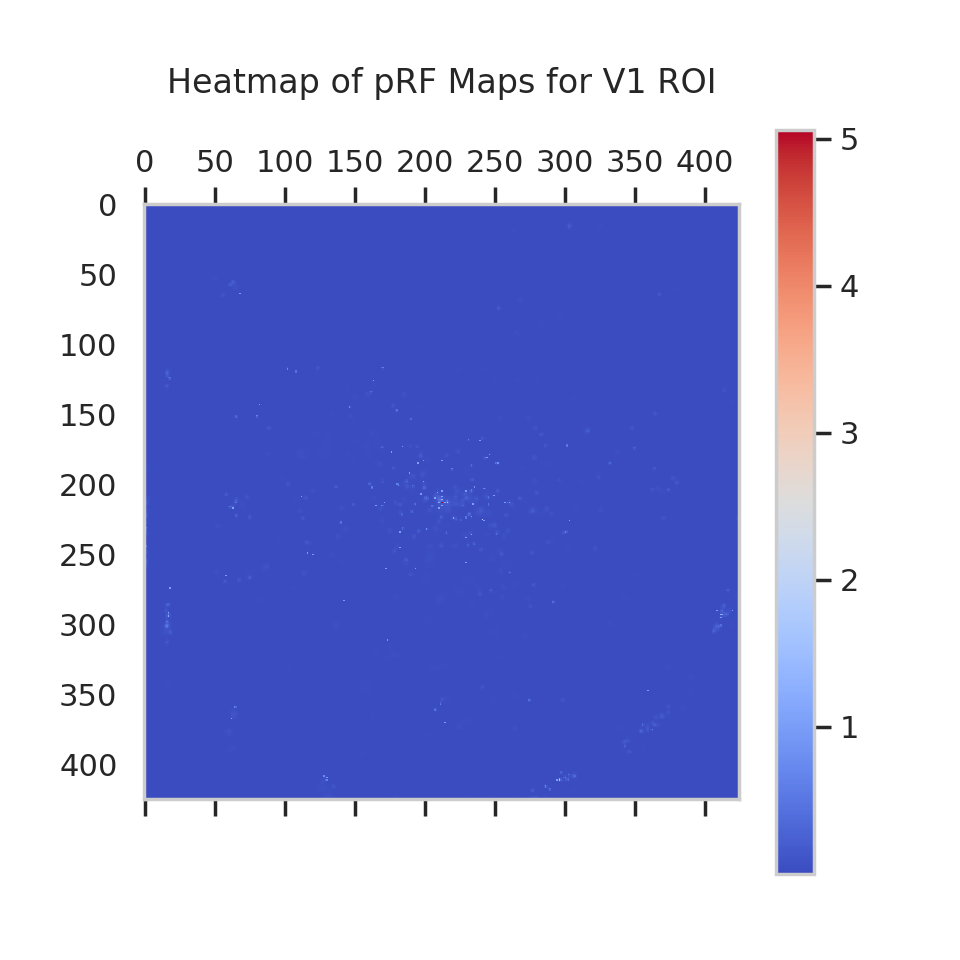

In [ ]:
# Plotting a heatmap of the pRF maps for the V1 ROI
plt.matshow(pdfs_v1_prf[0].reshape(pdfs_v1_prf[0].shape[0], 425, 425).sum(axis=0), cmap='coolwarm')

# Plot Colorbar
plt.colorbar()

# Set the title of the plot
plt.title('Heatmap of pRF Maps for V1 ROI', pad=20, loc='center')

### 3.7.1 Scatterplot of the `mu(x,y)` and the `sigmas` 
Scatterplot that visualizes the spatial distribution of voxels in the V1 region of interest (ROI) based on their coordinates and sigma values.

- Each point in the scatter plot represents a voxel in the V1 ROI.
- X and Y coordinates of each point are refering to the DataFrame prf_v1_subj1_valid 
- The *size of each point* is determined by the v1_sigma_px column, which represents the sigma value (a measure of the spread or size of the receptive field) for each voxel
    - Larger sigma values => larger points and vice versa
- the scatterplot shows the *mu(x,y)* values because the x and y coordinates of each point represent the mean (mu) positions of the receptive field for each voxel 
- The alpha= 0.1 parameter sets the transparency of the points to 0.1, making the points semi-transparent.

--> The plot provides a visual representation of where the voxels are located in the visual field.

Ability to identify regions with larger or smaller receptive fields based on the size of sigma. 

Text(0.5, 1.0, 'Scatter Plot of pRFs for V1-Sub1 Based on Coordinates and Sigma Values')

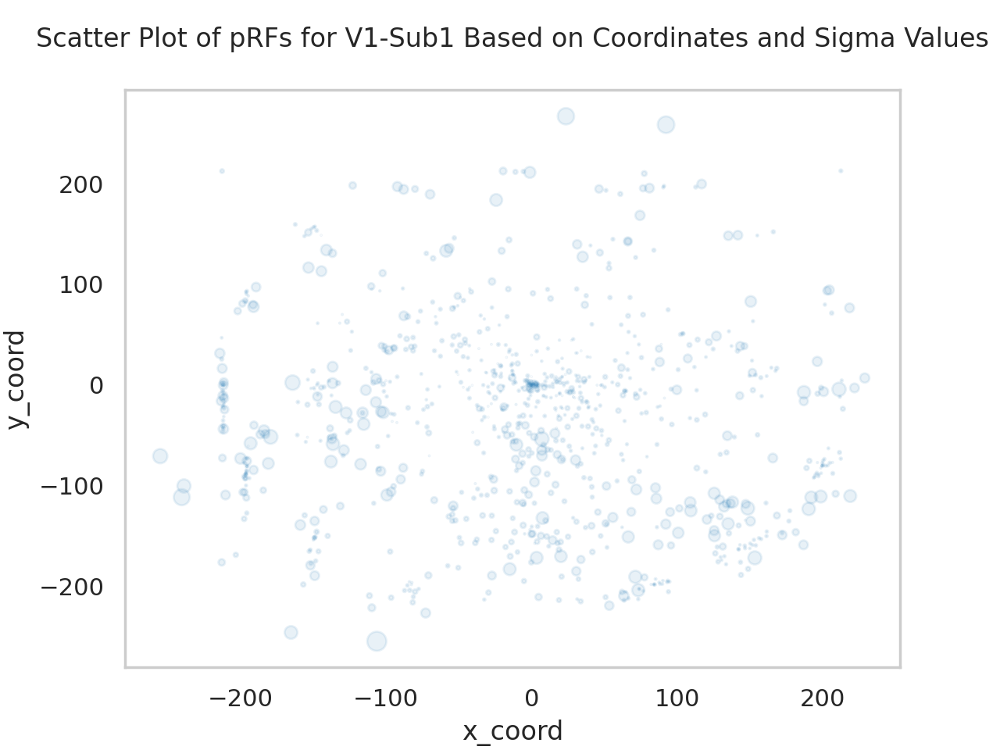

In [327]:
ax1 = prf_valid_df_v1.plot.scatter(x='x_coord',y='y_coord', s='sigma', alpha = 0.1)  

# Set the title of the plot
ax1.set_title('Scatter Plot of pRFs for V1-Sub1 Based on Coordinates and Sigma Values', pad=20, loc='center')

Intuition of the plot:
 
- Larger receptive fied sizes (sigma sizes) of the pRFs in the periphery are reasonable because the receptive fields get larger (less specific in the periphery)
- Probably focus was at the center during the perception of the image (also the requirement in an pRF experiment)
- However, you can see that some areas have a higher occurence of prFs then others (--> they are probably the more salient ones) 

# 4. Function definition and execution "get_betas_from_numpy()" 

*(to load the exact betas for the corresponding timeslot, based on entered ROI)*

The function output is a nested list of the beta maps corresponding to the different nsd ids of the shared1000 (e.g. 2951). 
- Within the nested list there should be for each entry of the nsd img id another list of different nsd img ids 

In [328]:
# Load the CSV file df_nsd_trial_file into a DataFrame
df_nsd_trial = pd.read_csv(df_nsd_trial_file)

df_nsd_trial.head()

,nsdId,cocoId,subject1_rep0,subject1_rep1,subject1_rep2,subject2_rep0,subject2_rep1,subject2_rep2,subject3_rep0,subject3_rep1,...,subject5_rep2,subject6_rep0,subject6_rep1,subject6_rep2,subject7_rep0,subject7_rep1,subject7_rep2,subject8_rep0,subject8_rep1,subject8_rep2
0,2951,262145,2616,9716,27566,2616,9716,27566,2616,9716,...,27566,2616,9716,27566,2616,9716,27566,2616,9716,27566
1,2991,262239,18458,18697,27711,18458,18697,27711,18458,18697,...,27711,18458,18697,27711,18458,18697,27711,18458,18697,27711
2,3050,262414,6299,6448,6697,6299,6448,6697,6299,6448,...,6697,6299,6448,6697,6299,6448,6697,6299,6448,6697
3,3078,524646,4289,4515,4537,4289,4515,4537,4289,4515,...,4537,4289,4515,4537,4289,4515,4537,4289,4515,4537
4,3147,262690,8087,8443,26807,8087,8443,26807,8087,8443,...,26807,8087,8443,26807,8087,8443,26807,8087,8443,26807


Since an error could occur because the trial number (`trial_num`) derived from the `nsd_id` is missing in the beta data for the specific subject. This likely occured because the subject had fewer trials or the trial number is not present in the beta data.

To handle this case, I added a check to ensure that the `trial_num` is within the valid range of indices for the `beta_maps_full` array. If the trial number is out of bounds, the code skips that trial and continues processing (calculating the mean beta maps) the remaining trials.

This occured the fist time for subject 3 while trying to execute the 'get_betas_from_numpy()' code for subject 3, ROI v1 and nSD ides 2951, third trial: trial id (27566). The betas_subj03 _v1.npy fiel has the shape (24000,1156). Instead of (3000,amount of voxels for subj 1 and 2). 

In [329]:
# Define the function get_betas, adapapted function, returns betas as an flattened betas array 
# Think of applying the roi mask before, to to betas full, to enhance processing 
def get_betas_from_numpy(data: pd.DataFrame, nsd_id: Union[List[int], int], sub_num: int, roi: str,
              verbosity=1) -> List[List[np.ndarray]]:
    nested_beta_maps_masked = []
    """
    get_betas(data: pd.DataFrame, nsd_id: Union[List[int], int], sub_num: int) -> List[List[np.ndarray]]
    
    Return the beta maps for a single image or a series of images given their NSD IDs and subject number
    
    Parameters
    ----------
    
    data: pd.DataFrame
        The DataFrame df_nsd_trial mapping the NSD IDs to trial IDs for each subject
        
    nsd_id: Union[List[int], int]
        A single NSD ID or a list of NSD IDs for which the beta maps are to be returned
        
    sub_num: int
        The subject number for which the beta maps are to be returned

    roi: str
        The region of interest for which the beta maps are to be returned
        
    Returns
    -------
    betas: List[List[np.ndarray]]
        A nested list of beta maps for the given NSD IDs
    """

    # Ensure nsd_id is a list
    if isinstance(nsd_id, int):
        nsd_id = [nsd_id]

    # Read all beta patterns from numpy file
    # Path to the numpy file containing the beta maps
    #beta_path = DATA_PATH / f'subjectwise_data/subject0{sub_num}/betas_full_{roi}.npy'

    # TODO: Adapt beta_path to the correct path
    # Load all beta maps stored in a NIfTI file depending on the entered roi in the function call 
    # The beta maps include all 30,000 trials of the subject


    # Note: for some subjects, only a limited number of sessions are available and not 40 sessions
    # sub1: 40 sessions, sub2: 40 sessions, sub3: 32 sessions, sub4: 30 sessions, sub5: 40 sessions, 
    # sub6: 32 sessions, sub7: 40 sessions, sub8: 30 sessions
    # TODO: Maybe adaptation of these edge cases for the code neccessary

    beta_path = DATA_PATH / f'subjectwise_data/subject0{sub_num}/betas_valid_subj0{sub_num}_{roi}.npy'
    
    # Load the beta maps from the numpy file
    beta_maps_full = np.load(str(beta_path), allow_pickle=True)
    num_trials = beta_maps_full.shape[0]  # Total number of trials in the beta data

    # Reduce the betas_valid_subj0{sub_num}_{roi}.npy to the valid voxels in deleting the voxels 
    # whose PDFs sum to zero
    print(f"ROI: {roi}")
    # valid_voxel_path = DATA_PATH/f'subjectwise_data/subject0{sub_num}/valid_indices_subj{sub_num}_{roi}.npy'
    # # Load the beta maps from the numpy file
    # valid_voxel_indices_per_roi = np.load(str(valid_voxel_path), allow_pickle=True)

    assert beta_path.exists(), f"Beta path not found: {beta_path}"
    # assert valid_voxel_path.exists(), f"Valid voxel path not found: {valid_voxel_path}"

    # Apply the non_zero_sum_mask_roi to beta_maps_full
    # This will keep only the columns (voxels) where the mask is True
    # beta_maps_full_valid = beta_maps_full[:, valid_voxel_indices_per_roi]

    if verbosity > 0:
        print(f"ROI: {roi}")
        print(f"Loaded beta maps from: {beta_path}")
        # print(f"Loaded valid voxel indices from: {valid_voxel_path}")
        print(f"Shape of beta_maps_full before masking: {beta_maps_full.shape}")
        # print(f"Shape of beta_maps_full after masking: {beta_maps_full_valid.shape}")
   
    for i in nsd_id:
        
        beta_maps = []
        # Set the number of repetitions to 3 because the shared1000 nsd images were shown 3 times to each subject
        n_repetitions = 3

        # Load the trial number for the NSD ID
        for rep_num in range(n_repetitions):
            trial_num = np.int32(data.loc[data['nsdId'] == i][f'subject{sub_num}_rep{rep_num}'])

            # Print the trial number to verify
            if verbosity > 0:
                print(f"Trial Number for NSD ID {i}: {trial_num}")
            ############################################################################
            ############### Extra check if a trial is missing ##########################

            if len(trial_num) == 0:
                print(f"Warning: NSD ID {rep_num} not found in the trial mapping.")
                # TODO: Append a placeholder array of zeros
                beta_maps.append(np.zeros((1, beta_maps_full.shape[1])))
                continue
        
            trial_num = trial_num[0]  # Extract the trial number
            
            # Check if the trial number is within bounds
            if trial_num < 1 or trial_num > num_trials:
                print(f"Warning: Trial number {trial_num} for NSD ID {nsd_id} is out of bounds (1 to {num_trials}).")
                # Append a placeholder array of zeros
                beta_maps.append(np.zeros((1, beta_maps_full.shape[1])))
                continue
            ###########################################################################


            # Extract the beta map for the specified trial
            # TODO: Changed the indexing to sess_trial_num - 1 to match the 0-based indexing of Python
            trial_beta_map = beta_maps_full[trial_num - 1, ...][np.newaxis, :]  # e.g. shape (1, 1173) for v1
            # Append the beta map to the list
            beta_maps.append(trial_beta_map)

            if verbosity > 0:
                print(f"Loaded beta map for NSD ID {nsd_id}, trial number {trial_num}.")
                # Print the shape of the extracted beta map to verify
                print(f"Shape of beta map for trial {trial_num}:", trial_beta_map.shape)


            # TODO: Uncomment to display the beta map
            """ # Display a slice of the beta map (e.g., the middle slice along the z-axis)
            plt.imshow(trial_beta_map[:, :, trial_beta_map.shape[2] // 2], cmap='gray')
            plt.title(f"Beta Map for Trial {sess_trial_num} and NSD ID {i}")
            plt.axis('off')
            plt.show() """

            

        # Convert beta_maps to a NumPy array with shape (e.g. 3, 1173)
        beta_maps = np.vstack(beta_maps)

        # Apply the mask to the beta maps
        # beta_maps_masked = beta_maps[:, mask_np == 1]

        # Append the list of beta maps for this nsd_id to the nested list
        nested_beta_maps_masked.append(beta_maps)

    nested_beta_maps_masked = np.asarray(nested_beta_maps_masked)
    nested_beta_maps_masked = nested_beta_maps_masked.reshape(-1, n_repetitions, beta_maps_full.shape[1])

        # Convert the nested list to a NumPy array and save it to a file
        #np.save('nested_beta_maps.npy', np.array(beta_maps, dtype=object))

    return nested_beta_maps_masked

In [331]:
roi = 'v3'

# Function call 

beta_v3 = get_betas_from_numpy(df_nsd_trial, nsd_id = nsd_id, sub_num = sub_num, roi = roi)

ROI: v3
ROI: v3
Loaded beta maps from: /gpfs01/bartels/user/lheinemann/nsd-static-saliency/data/subjectwise_data/subject06/betas_valid_subj06_v3.npy
Shape of beta_maps_full before masking: (24000, 925)
Trial Number for NSD ID 2951: [2616]
Loaded beta map for NSD ID [2951], trial number 2616.
Shape of beta map for trial 2616: (1, 925)
Trial Number for NSD ID 2951: [9716]
Loaded beta map for NSD ID [2951], trial number 9716.
Shape of beta map for trial 9716: (1, 925)
Trial Number for NSD ID 2951: [27566]


#### Set standard parameters for the plots: colormap viridis and no grids


In [ ]:
# Set standard parameters for the plots: colormap viridis and no grids

# Turn off grids globally, before executing all matplotlib plots were - number ii ofthis code because it 
# did not work before 

# Printed with grids 
plt.rcParams['axes.grid'] = False

# Set the default colormap to viridis
plt.rcParams['image.cmap'] = 'viridis'

## 4.1 Function call "get_betas_from_numpy()" 
*Load the three corresponding betas of one participant and one image and calculate the mean beta map*

In [333]:
""" # Load the CSV file df_nsd_trial_file into a DataFrame
df_nsd_trial = pd.read_csv(df_nsd_trial_file)

# Example usage to call the function get_betas_from_numpy() for a single nsd_id
nsd_id = [2951, 2991]

# Load the beta maps (N = 3) for the entered NSD ID and subject 1
beta_maps = get_betas_from_numpy(df_nsd_trial, nsd_id, sub_num=sub_num, roi = 'ffa2', verbosity=1)

# Print the shapes of the beta maps to verify
for i, trial_beta_map in enumerate(beta_maps):
    # Transfer the list of trial_beta_map to a NumPy array to inspect the shapes 
    trial_beta_map_np = np.array(trial_beta_map)
    print(f"Shape of beta map for nsd_id {nsd_id[i]}: {trial_beta_map_np.shape}") """

' # Load the CSV file df_nsd_trial_file into a DataFrame\ndf_nsd_trial = pd.read_csv(df_nsd_trial_file)\n\n# Example usage to call the function get_betas_from_numpy() for a single nsd_id\nnsd_id = [2951, 2991]\n\n# Load the beta maps (N = 3) for the entered NSD ID and subject 1\nbeta_maps = get_betas_from_numpy(df_nsd_trial, nsd_id, sub_num=sub_num, roi = \'ffa2\', verbosity=1)\n\n# Print the shapes of the beta maps to verify\nfor i, trial_beta_map in enumerate(beta_maps):\n    # Transfer the list of trial_beta_map to a NumPy array to inspect the shapes \n    trial_beta_map_np = np.array(trial_beta_map)\n    print(f"Shape of beta map for nsd_id {nsd_id[i]}: {trial_beta_map_np.shape}") '

In [334]:
sub_num 

6

In [335]:
print("Debugging `df_nsd_trial` DataFrame:")
print(df_nsd_trial.info())  # Check column types
print(df_nsd_trial.head())  # Preview first few rows

Debugging `df_nsd_trial` DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 26 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   nsdId          1000 non-null   int64
 1   cocoId         1000 non-null   int64
 2   subject1_rep0  1000 non-null   int64
 3   subject1_rep1  1000 non-null   int64
 4   subject1_rep2  1000 non-null   int64
 5   subject2_rep0  1000 non-null   int64
 6   subject2_rep1  1000 non-null   int64
 7   subject2_rep2  1000 non-null   int64
 8   subject3_rep0  1000 non-null   int64
 9   subject3_rep1  1000 non-null   int64
 10  subject3_rep2  1000 non-null   int64
 11  subject4_rep0  1000 non-null   int64
 12  subject4_rep1  1000 non-null   int64
 13  subject4_rep2  1000 non-null   int64
 14  subject5_rep0  1000 non-null   int64
 15  subject5_rep1  1000 non-null   int64
 16  subject5_rep2  1000 non-null   int64
 17  subject6_rep0  1000 non-null   int64
 18  subject6_rep1

# 5. Visualization of the relationship of sigma and eccentricity

Visualization of the sigma and eccentricity data for subject 1, ROI=V1 
Data contained form dictionary: prf_df_subj1_all_rois 

In [ ]:
# Turn off grids globally, before executing all matplotlib plots were - number ii ofthis code because it 
# did not work before 

# Printed with grids 
plt.rcParams['axes.grid'] = False

# Set the default colormap to viridis
plt.rcParams['image.cmap'] = 'viridis'

In [337]:
# Access only the eccentricity and sigma data of roi_dataframes['v1']
prf_valid_dict_dfs_all_rois['v1'][['ecc', 'sigma']]

,ecc,sigma
0,4.385573,1.188356
1,4.263033,0.541474
2,4.294058,3.790213
3,0.041125,0.775068
4,0.008996,0.129613
...,...,...
931,0.246212,1.231818
932,0.139764,0.398155
933,0.217614,0.761114
934,0.007652,0.264316


<Axes: xlabel='ecc', ylabel='sigma'>

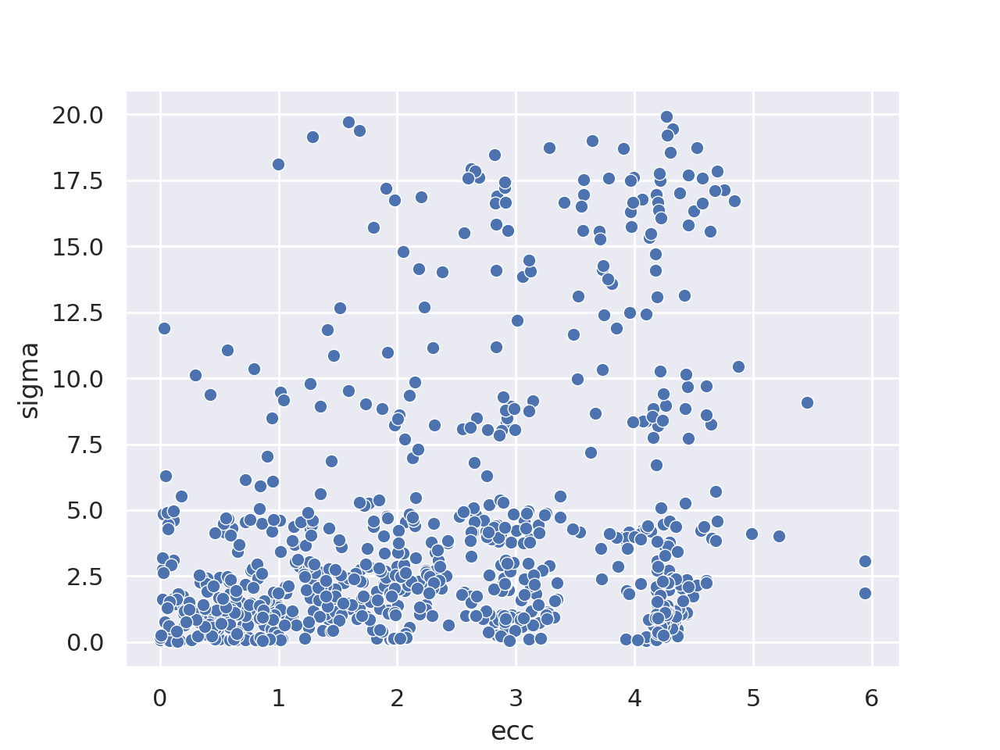

In [338]:
# Plot the eccentricity and sigma data for v1
sns.set_theme()
sns.scatterplot(x='ecc',y='sigma',data=df_v1_rows.query("ecc < 35 & sigma < 20 & r2 > 0"))
# plt.xlim(0,35)
# plt.ylim(0,20)

## 5.1 Function definitions "*binscatter()*" and "*plot_binned_scatter()*" to create and plot a binned scatterplot

In [339]:
import binsreg

def binscatter(**kwargs):
    # Estimate binsreg
    est = binsreg.binsreg(**kwargs);
    
    # Retrieve estimates
    df_est = pd.concat([d.dots for d in est.data_plot])
    df_est = df_est.rename(columns={'x': kwargs.get("x"), 'fit': kwargs.get("y")})
    
    # Add confidence intervals
    if "ci" in kwargs:
        df_est = pd.merge(df_est, pd.concat([d.ci for d in est.data_plot]))
        df_est = df_est.drop(columns=['x'])
        df_est['ci'] = df_est['ci_r'] - df_est['ci_l']
    
    # Rename groups
    if "by" in kwargs:
        df_est['group'] = df_est['group'].astype(df[kwargs.get("by")].dtype)
        df_est = df_est.rename(columns={'group': kwargs.get("by")})

    return df_est

##### Function definition "*plot_binned_scatter()*"

In [340]:
def plot_binned_scatter(prf_df: dict, sub_num: int) -> None:

    """
    Generate binned scatter plots based on the provided dataframe.

    Parameters
    ----------
    prf_df (pd.DataFrame): dictionary containing several DataFrames containing voxel data.
    sub_num (int): Subject number.

    Returns
    -------
    None, rather visuakizes the scatter plots.
    """
    
    df_est_v1 = binscatter(x='ecc',y='sigma',
                           data=prf_df['v1'].query("ecc < 4.5 & sigma < 20 & r2 > 0"), 
                           ci=(3,3),randcut=1);
    df_est_v2 = binscatter(x='ecc',y='sigma',
                           data=prf_df['v2'].query("ecc < 4.5 & sigma < 20 & r2 > 0"), 
                           ci=(3,3),randcut=1);
    df_est_v3 = binscatter(x='ecc',y='sigma',
                           data=prf_df['v3'].query("ecc <4.5 & sigma < 20 & r2 > 0"), 
                           ci=(3,3),randcut=1);
    df_est_v4= binscatter(x='ecc',y='sigma',
                           data=prf_df['v4'].query("ecc < 4.5 & sigma < 20 & r2 > 0"), 
                           ci=(3,3),randcut=1);
    
    # Binned scatter plot 
    # Create the figure and axes
    fig,ax = plt.subplots(figsize=(10, 6))
    sns.set_palette("tab10")
    
    # Plot for V1
    # sns.scatterplot(x='v1_ecc',y='v1_sigma',data=df_est_v1, label = 'V1')
    sns.regplot(x='ecc',y='sigma',data=df_est_v1,label = 'V1', x_jitter =.05)
    plt.errorbar('ecc', 'sigma', yerr='ci', data=df_est_v1, ls='', lw=2, alpha=0.2, label='');
    
     # Plot for V2
    sns.regplot(x='ecc',y='sigma',data=df_est_v2,label = 'V2', x_jitter =.05, x_estimator=np.mean)
    # sns.scatterplot(x='v2_ecc',y='v2_sigma',data=df_est_v2, label = 'V2')
    plt.errorbar('ecc', 'sigma', yerr='ci', data=df_est_v2, ls='', lw=2, alpha=0.2,label='');

     # Plot for V3
    sns.regplot(x='ecc',y='sigma',data=df_est_v3,label = 'V3',x_jitter =.05, x_estimator=np.mean)
    # sns.scatterplot(x='v3_ecc',y='v3_sigma',data=df_est_v3, label = 'V3')
    plt.errorbar('ecc', 'sigma', yerr='ci', data=df_est_v3, ls='', lw=2, alpha=0.2,label='');

     # Plot for V4
    sns.regplot(x='ecc',y='sigma',data=df_est_v4,label = 'V4',x_jitter =.05, x_estimator=np.mean)
    # sns.scatterplot(x='v4_ecc',y='v4_sigma',data=df_est_v4, label = 'V4')
    plt.errorbar('ecc', 'sigma', yerr='ci', data=df_est_v4, ls='', lw=2, alpha=0.2,label='');

    # Set axis labels and title
    ax.set(xlabel = 'Eccentricity', ylabel = 'Sigma',title =f'Subject: {sub_num}')
    ax.legend()

    # Enter a title of the figure 
    plt.suptitle(f'Binned Scatterplot of Eccentricity vs. Sigma for Subject {sub_num}')
    plt.show()

##### Function call to plot the binned scatter plot for the pRF data of subject 1

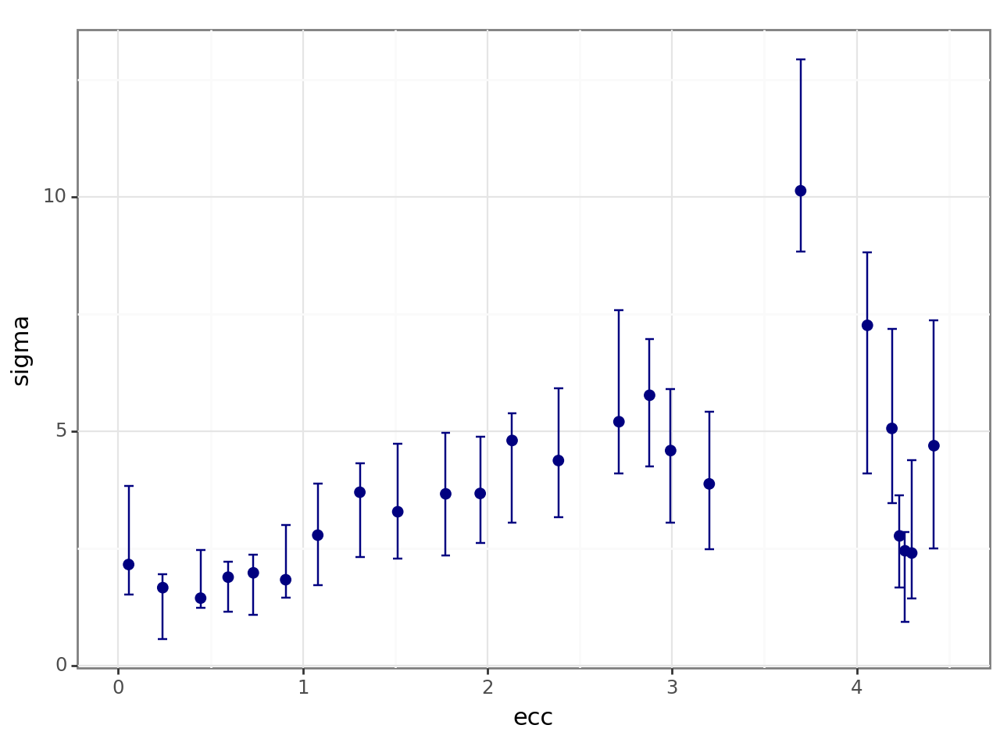

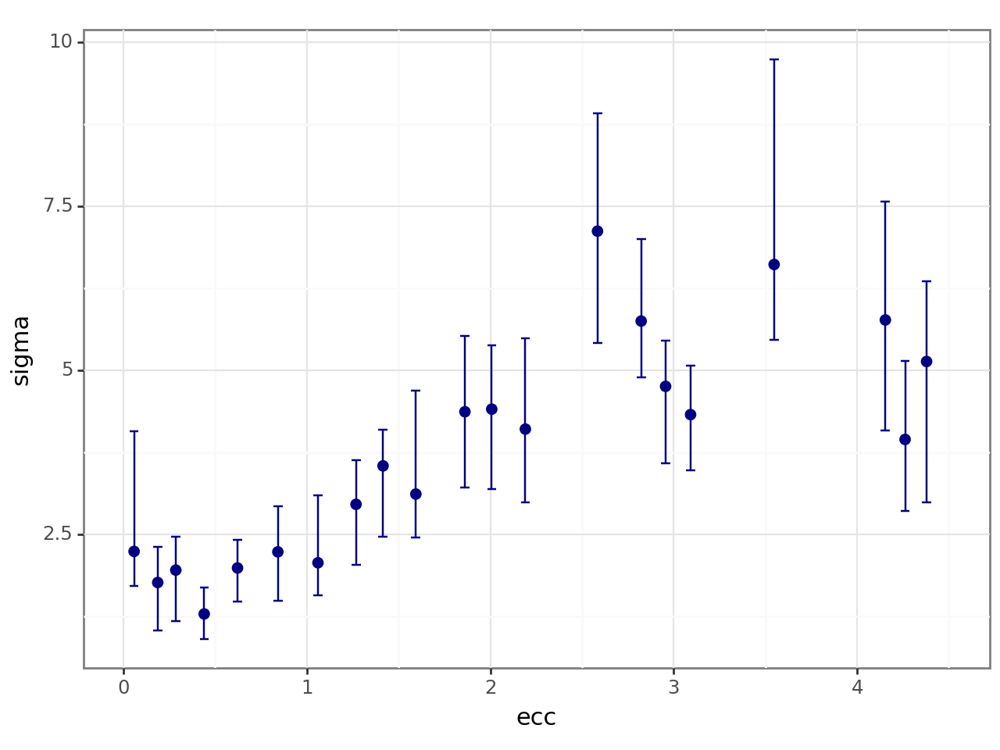

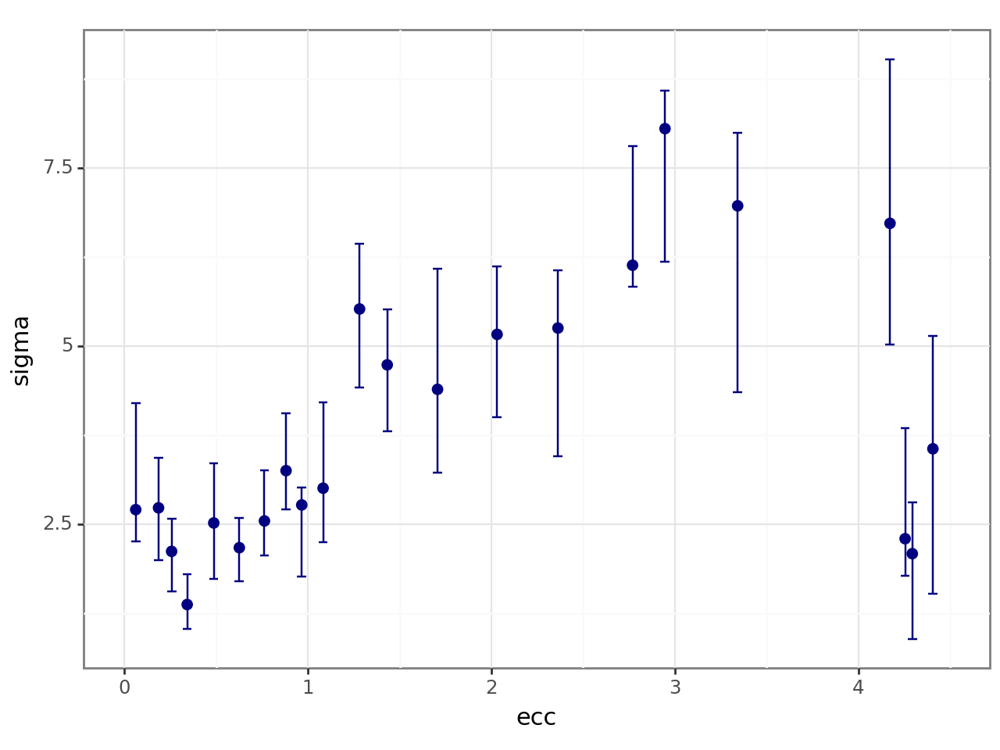

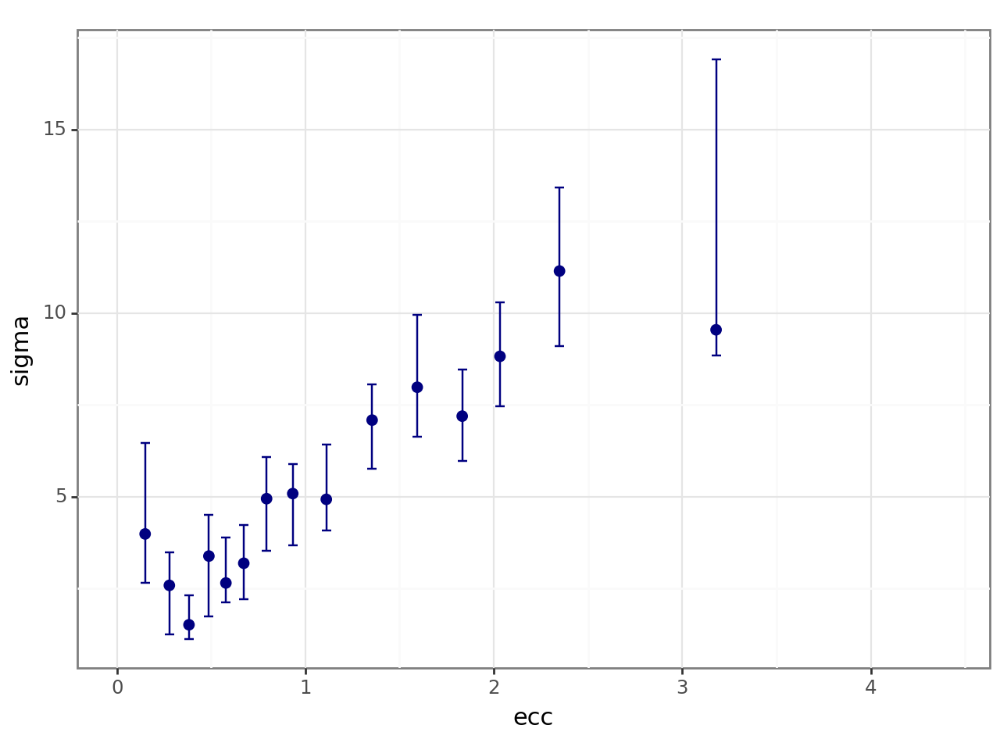

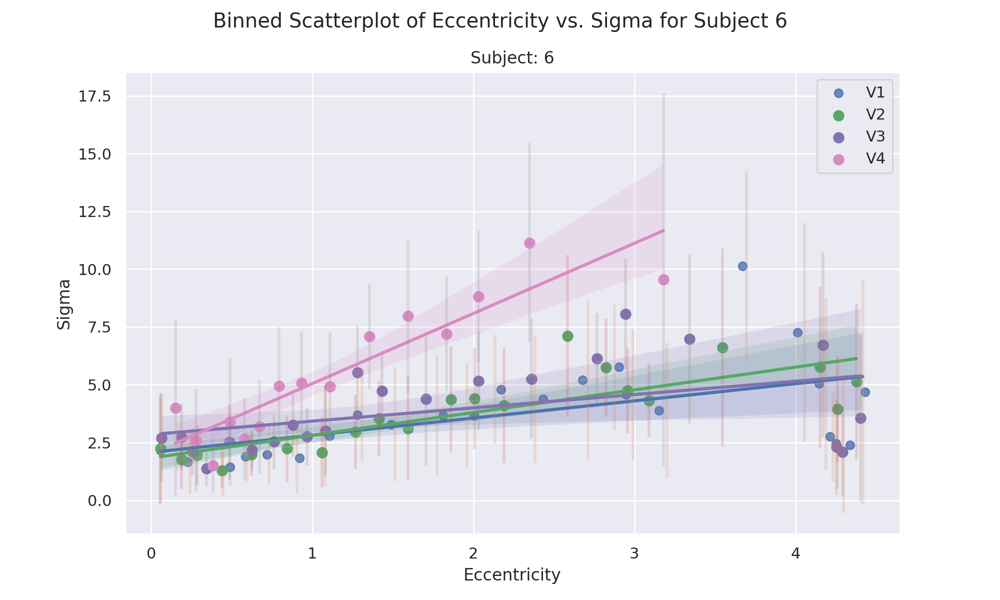

In [341]:
# New with 1.8 mm 
plot_binned_scatter(prf_valid_dict_dfs_all_rois, sub_num = sub_num)

In [342]:
sal_model

'GroundTruthEyeTracking'

# 6. Function defintion of "*match_salmap_and_betas_for_nsd_id()*" 
*(to load and return the corresponding ground truth saliency map(s) for an or mutiple img_ids and the corresponding beta_maps (*N*=3 per trial))*

Note that the scan session number of each NSD subject varies due to missing scan session, there might be the edge case that a shared1000 nsd image is not presented three times, but just two or one time. 

The NIfTI files for the betas are only in 4 out of 8 subjects completly available (due to missing scan sessions during the NSD data collection).

- sub1: 40 scan sessions
- sub2: 40 scan sessions
- sub3: 32 scan sessions
- sub4: 30 scan sessions
- sub5: 40 scan sessions
- sub6: 32 scan sessions
- sub7: 40 scan sessions
- sub8: 30 scan sessions

The nested_beta_maps array will then likely have less then 3 beta maps stored. 

So to handle these *edge cases* the length of the nested_beta map calculated in "get_betas()" has to be returned and if an nsd image is only presented two times the mean of the two beta maps is build on, if it is just presenetd one time no mean hast to be build on. 



In [ ]:
# Ensure that the saliency map and the beta maps are loaded as wished for the same subject, and same nsd img 
def match_salmap_and_betas_for_nsd_id(data: pd.DataFrame, nsd_id: Union[List[int], int],
                                      sub_num: int, roi: str, sal_model = str, verbosity=0) -> Tuple[np.ndarray, List[np.ndarray], np.ndarray]:
    """
    Load the saliency map and the beta maps for a specific NSD ID
    and perform the calculations y = k*x 

    Parameters
    ----------
    data : pd.DataFrame
        The dataframe containing the NSD IDs and the corresponding subject numbers
    nsd_id : Union[List[int], int]
        A single NSD ID or a list of NSD IDs for which the saliency maps are to be returned
    sub_num : int
        The subject number for which the saliency maps and beta maps are to be returned
    roi : str
        The region of interest for which the beta maps are to be returned
    sal_model : str
        The saliency model to be used for generating the saliency maps
    verbosity : int
        The verbosity level for printing the trial numbers and shapes of the beta maps

    Returns: Tuple
    -------
    salmap : np.ndarray
        The saliency map for the NSD image(s)
    nested_beta_maps : List[np.ndarray]
        The beta maps for the NSD image(s)
    mean_beta_map : np.ndarray
        The mean beta map for the NSD image(s)

    """
    # Ensure nsd_id is a list
    single_nsd_id = False
    if isinstance(nsd_id, int):
        nsd_id = [nsd_id]
        single_nsd_id = True

    # Initialize lists to store results
    all_salmaps = []
    all_nested_beta_maps = []
    all_mean_beta_maps = []

    # Initialize a dictionary to store individual beta maps for each NSD ID
    individual_beta_maps = {}

    ######################################## Get saliency maps - adapted to the entered saliency model ##############################

    for nsd in nsd_id:
        # Function call to get the saliency map for the first fixations for the entered nsdId
        if sal_model == 'GroundTruthEyeTracking':
            # Get the saliency map for the first fixations
            salmap = get_saliency(nsd)
            
            if verbosity > 0:
                # Plot the saliency map
                plt.imshow(salmap, cmap='hot')
                plt.axis('off')
                plt.title(f'NSD ID: {nsd}')
                plt.show()
        elif sal_model == 'AllFixations':
            # Get the saliency map for all fixations
            salmap = get_saliency_all_fixations(nsd)
            
            if verbosity > 0:
                # Plot the saliency map
                plt.imshow(salmap, cmap='hot')
                plt.axis('off')
                plt.title(f'NSD ID: {nsd}')
                plt.show()

        elif sal_model == 'DeepGaze':
            # Get the saliency map using the DeepGaze model
            salmap = get_saliency_deepgaze(nsd)
       
            if verbosity > 0:
                # Plot the saliency map
                plt.imshow(salmap, cmap='hot')
                plt.axis('off')
                plt.title(f'NSD ID: {nsd}')
                plt.show()
        if salmap is None or not isinstance(salmap, np.ndarray):
            raise ValueError(f"Invalid saliency map returned for NSD ID {nsd}.")
        
    ##################################################################################################################################

        # If get_saliency returns a tuple, extract the first element
        if isinstance(salmap, tuple):
            salmap = salmap[0]  # Assuming the first element is the actual saliency map

        # Ravel the saliency map to a 1D array for the matrix computation after plotting it 
        salmap = salmap.ravel()

        # Load the beta maps (N = 3) for the entered NSD ID and subject 1
        nested_beta_maps = get_betas_from_numpy(data, nsd, sub_num, roi, verbosity=verbosity)

        # Print the shapes of the beta maps to verify   
        for i,trial_beta_map in enumerate(nested_beta_maps):
            # Transfer the list of trial_beta_map to a NumPy array to inspect the shapes 
            trial_beta_map_np = np.array(trial_beta_map)
            if verbosity > 0:
                print(f"Shape of beta maps for nsd_id {nsd}, trial{i}: {trial_beta_map_np.shape}")
            # Store the individual beta maps for each NSD ID
            individual_beta_maps[nsd] = trial_beta_map_np

        ###################### Mean caluclaion of the beta maps for several nsd_ids ##############################
        
        # Calculate the mean of the nested_beta_maps for each NSD ID by averaging along the first axis (trials) for each NSD ID
        # of the shared1000 images, so that the mean_beta_maps can be used in the correlation of the beta activity (fMRI data) with the modeled beta activity via pRF modeling 

        # Out of the three trials, we get the mean beta map values 
        # along diemsnion axis = 1: z-dimension, axis = 2: y-dimension and axis = 3: z-dimension
        # for each NSD ID

        # Calculate the mean from the reshaped individual beta maps
        mean_beta_map = np.mean(np.array(individual_beta_maps[nsd]), axis=0)

        # Save the mean beta map as a numpy array in the subjectwise data directory
        # np.save(DATA_PATH_subj / f'mean_beta_map_sub{sub_num}_nsd_id{nsd}.npy', mean_beta_map)
        if verbosity > 1:
            # Print the shape of mean_beta_map to verify
            print(f"Mean beta map for NSD ID {nsd}: {mean_beta_map.shape}")
        
        # If nsd_id is a list: Append the results to the lists
        if isinstance(nsd_id, list):
            all_salmaps.append(salmap)
            all_nested_beta_maps.append(nested_beta_maps)
            all_mean_beta_maps.append(mean_beta_map)

    # Return the corresponding saliency map(s), the nested beta map(s) and the mean beta map(s)
    return (all_salmaps[0], all_nested_beta_maps[0], all_mean_beta_maps[0]) if single_nsd_id else (all_salmaps, all_nested_beta_maps, all_mean_beta_maps)


In [344]:
# Print a list of the distinct shared1000 NSD Ids 
shared1000_list

[2951,
 2991,
 3050,
 3078,
 3147,
 3158,
 3165,
 3172,
 3182,
 3387,
 3435,
 3450,
 3490,
 3627,
 3683,
 3688,
 3730,
 3810,
 3843,
 3848,
 3857,
 3914,
 3952,
 4052,
 4059,
 4130,
 4157,
 4250,
 4326,
 4424,
 4437,
 4613,
 4668,
 4691,
 4769,
 4787,
 4836,
 4870,
 4893,
 4931,
 5035,
 5107,
 5205,
 5286,
 5302,
 5339,
 5428,
 5460,
 5503,
 5543,
 5575,
 5584,
 5603,
 5715,
 5879,
 5891,
 6133,
 6200,
 6223,
 6432,
 6445,
 6490,
 6515,
 6522,
 6525,
 6559,
 6641,
 6714,
 6802,
 7008,
 7040,
 7121,
 7208,
 7337,
 7367,
 7410,
 7419,
 7481,
 7655,
 7660,
 7841,
 7860,
 7945,
 7949,
 7955,
 8007,
 8110,
 8205,
 8226,
 8263,
 8275,
 8319,
 8388,
 8395,
 8416,
 8436,
 8466,
 8510,
 8632,
 8647,
 8808,
 8844,
 8926,
 8934,
 9028,
 9049,
 9148,
 9231,
 9435,
 9463,
 9681,
 9723,
 9805,
 9848,
 9866,
 9918,
 9979,
 10007,
 10047,
 10065,
 10106,
 10108,
 10245,
 10394,
 10472,
 10508,
 10587,
 10601,
 10611,
 10908,
 11160,
 11334,
 11488,
 11522,
 11567,
 11618,
 11636,
 11690,
 11726,
 1179

### 6.1 Function call "*match_salmap_and_betas_for_nsd_id()* one NSD Id"

In [345]:
# Function call to match and load saliency map and the betas for a nsd_id
# TODO: Change verbosity level if you want to print the saliency maps, here set to 1

salmap_2951, nested_beta_maps_2951, mean_beta_map_2951= match_salmap_and_betas_for_nsd_id(data = df_nsd_trial, nsd_id = 2951, sub_num = sub_num, roi = 'v1', sal_model= sal_model, verbosity = 0)

ROI: v1


In [346]:
print(df_nsd_trial.head())  # Check the first few rows of the DataFrame
print(sub_num)             # Check the subject number
print(sal_model)           # Check the saliency model

   nsdId  cocoId  subject1_rep0  subject1_rep1  subject1_rep2  subject2_rep0  \
0   2951  262145           2616           9716          27566           2616   
1   2991  262239          18458          18697          27711          18458   
2   3050  262414           6299           6448           6697           6299   
3   3078  524646           4289           4515           4537           4289   
4   3147  262690           8087           8443          26807           8087   

   subject2_rep1  subject2_rep2  subject3_rep0  subject3_rep1  ...  \
0           9716          27566           2616           9716  ...   
1          18697          27711          18458          18697  ...   
2           6448           6697           6299           6448  ...   
3           4515           4537           4289           4515  ...   
4           8443          26807           8087           8443  ...   

   subject5_rep2  subject6_rep0  subject6_rep1  subject6_rep2  subject7_rep0  \
0          27566  

In [347]:
mean_beta_map_2951.shape

(936,)

In [348]:
mean_beta_map_2951

array([ 6.13333333e+01,  1.27666667e+02,  2.93333333e+02, -2.33333333e+02,
        7.66666667e+00, -4.16666667e+01,  2.32000000e+02,  4.20666667e+02,
        5.83333333e+01,  4.16666667e+02,  2.53333333e+01,  5.33666667e+02,
        4.30000000e+01,  3.08333333e+02,  9.10000000e+01,  5.63333333e+01,
        3.36666667e+02,  7.60000000e+01,  3.10000000e+02,  8.96000000e+02,
        6.79666667e+02,  1.66666667e+00,  3.30666667e+02,  3.67000000e+02,
        2.63333333e+02,  2.12333333e+02,  2.77666667e+02,  2.15000000e+02,
        1.50666667e+02,  5.36666667e+01,  2.77666667e+02,  3.32666667e+02,
        1.90666667e+02,  6.32333333e+02,  6.67333333e+02,  2.48200000e+03,
        1.23000000e+02,  1.36666667e+01, -1.56666667e+01,  9.03333333e+01,
       -6.10000000e+01,  8.66666667e+01,  2.32000000e+02,  1.66333333e+02,
       -1.16333333e+02, -1.05000000e+02,  8.03666667e+02,  1.27833333e+03,
        3.70666667e+02,  2.64000000e+02,  3.19333333e+02,  2.16666667e+02,
        1.67666667e+02,  

In [349]:
# Function call to load multiple saliency maps and beta maps for multiple nsd_ids, verbosity = 1
salmaps, nested_beta_maps_masked, mean_beta_maps = match_salmap_and_betas_for_nsd_id(data = df_nsd_trial, nsd_id = shared1000_list[:3], sub_num = sub_num, roi = 'v1', sal_model= sal_model, verbosity = 0)

ROI: v1
ROI: v1
ROI: v1


### 6.2 Function call "*match_salmap_and_betas_for_nsd_id()* for multiple NSD Ids "

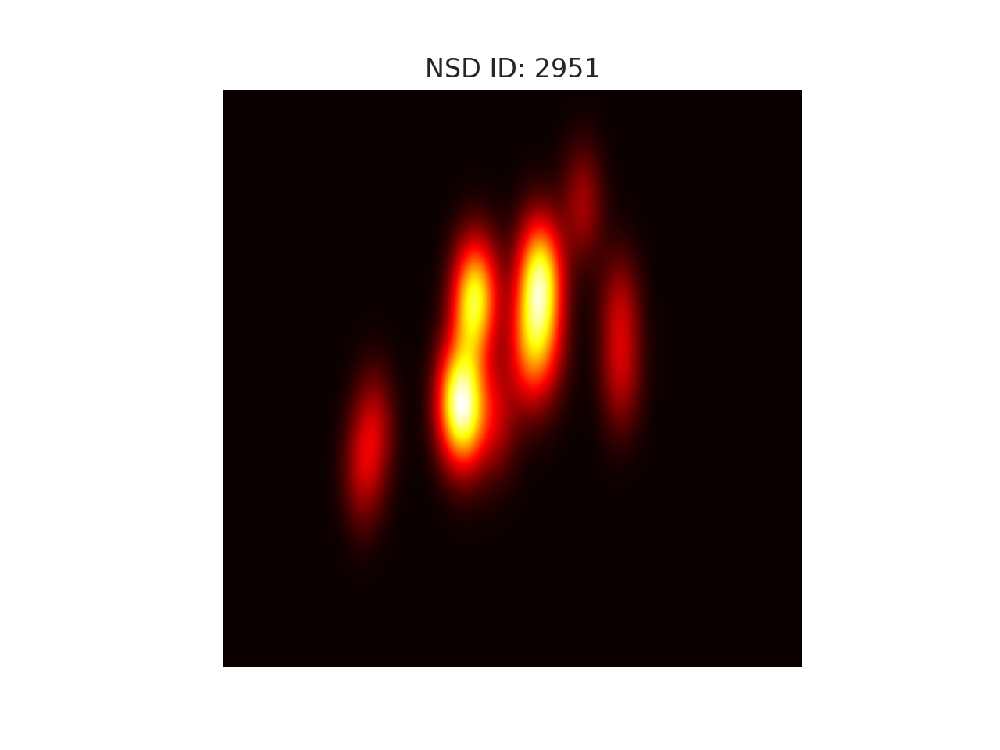

ROI: v1
ROI: v1
Loaded beta maps from: /gpfs01/bartels/user/lheinemann/nsd-static-saliency/data/subjectwise_data/subject06/betas_valid_subj06_v1.npy
Shape of beta_maps_full before masking: (24000, 936)
Trial Number for NSD ID 2951: [2616]
Loaded beta map for NSD ID [2951], trial number 2616.
Shape of beta map for trial 2616: (1, 936)
Trial Number for NSD ID 2951: [9716]
Loaded beta map for NSD ID [2951], trial number 9716.
Shape of beta map for trial 9716: (1, 936)
Trial Number for NSD ID 2951: [27566]
Shape of beta maps for nsd_id 2951, trial0: (3, 936)


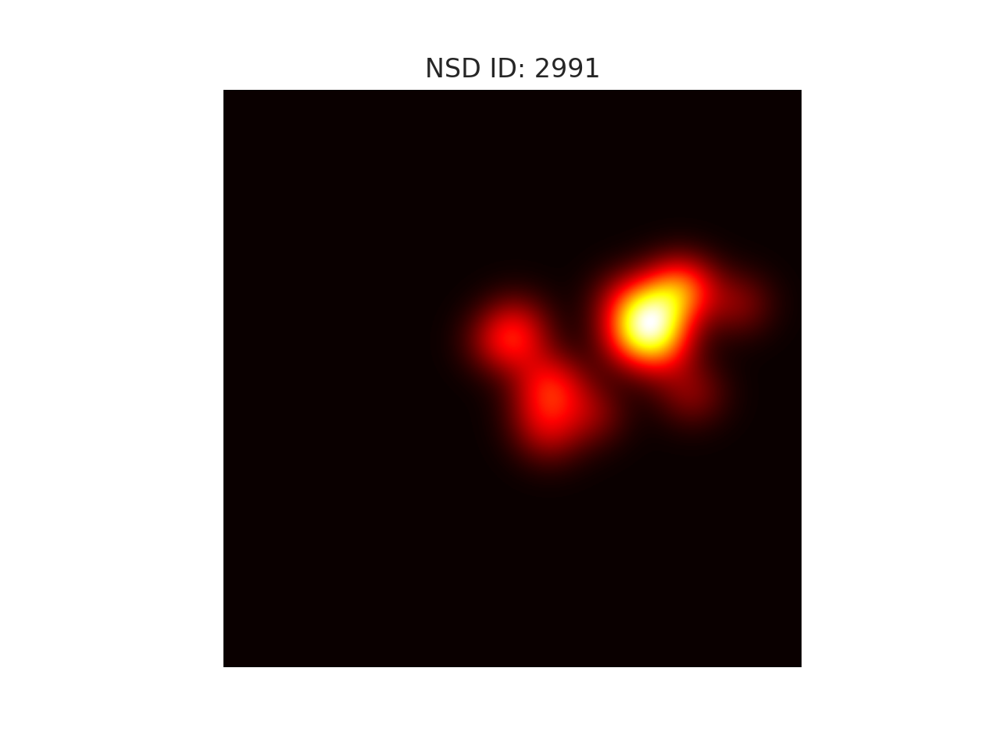

ROI: v1
ROI: v1
Loaded beta maps from: /gpfs01/bartels/user/lheinemann/nsd-static-saliency/data/subjectwise_data/subject06/betas_valid_subj06_v1.npy
Shape of beta_maps_full before masking: (24000, 936)
Trial Number for NSD ID 2991: [18458]
Loaded beta map for NSD ID [2991], trial number 18458.
Shape of beta map for trial 18458: (1, 936)
Trial Number for NSD ID 2991: [18697]
Loaded beta map for NSD ID [2991], trial number 18697.
Shape of beta map for trial 18697: (1, 936)
Trial Number for NSD ID 2991: [27711]
Shape of beta maps for nsd_id 2991, trial0: (3, 936)


In [350]:
# Example usage to call the function get_betas_from_numpy() for multiple nsd_ids
nsd_ids = [2951, 2991]

# Call the function to load multiple saliency maps and beta maps for multiple nsd_ids
salmaps, nested_beta_maps_masked, mean_beta_maps = match_salmap_and_betas_for_nsd_id(data=df_nsd_trial, nsd_id=nsd_ids, sub_num=sub_num, roi='v1', sal_model= sal_model, verbosity=1)

# --------------------------- Part II ----------------------------

# Comparing pRF saliency based on ground-truth eye-tracking data to observed (fMRI betas) 

### Converting polar to cartesian coordinates

- Can then generate a 2D “image” which describes where each voxel “looks” at, in pixel space 
- Pointwise multiply/convolve the 2D image with the stimuli image(s) 
- This will tell how much *“Saliency drive”* each voxel is receiving for that stimuli image(s)


For example, for a `425 x 425 = 180625 px` image:

- Unravel (flatten) the 2D image for each voxel to get a `voxels x 180625`. Multiplay with an image of `180625 x 1` . This resuls in a vector of size `voxels x 1`. Now we can correlate this vector **(Predicted)** to the betas **(Observed)** generated from the fMRI experiment.


Similar to this operation:

$\underset{v\times 1}{\mathrm{\hat{Y}}} =  \underset{voxels \times 180,625}{K} \times \underset{180,625\times 1}{\textbf{x}} $

# A. Calculate Y_hat_and_get_betas and voxelwise correlation with fMRI betas

Load the `K`, `betas` and `S_mat`=x matrices for correlation

### A.1 Function definition "*gen_corr_w_beta()* for at least two or more nsd ids stored in a list" 

Caluclate the Y Matrix and load the corresponding betas from the ground truth data 

In [355]:
sub_num

6

In [356]:
sal_model

'GroundTruthEyeTracking'

In [ ]:
def gen_corr_w_betas(roi, sal_model, print_log, nsd_id, sub_num, return_corr_only=False):
    """ Generate the correlation matrix between the betas 
    and the Y_hat matrix for a given ROI.

    Parameters
    ----------
    roi : str
        Region of interest (ROI).
    print_log : bool
        Print log messages.
    nsd_id : Union[list]
        A list of nsd image ids (e.g. shared1000_list).
        The list must contain at least two values for the correlation calculation.
   
    return_corr_only: bool,
         whether to return only the correlation matrix.

    Returns:
    corr_mat: np.ndarray
        The correlation matrix (if return_corr_only is True).
        Otherwise, returns a tuple (corr_mat, Y_hat, betas_val).
    """
    print(f"Computing correlation for {roi}\n")

    # Load the K matrix for the given subject and ROI
    K_mat = np.load(DATA_PATH / f"subjectwise_data/subject0{sub_num}" /  f"K_mat_subj0{sub_num}_{roi}.npy")
   
    if print_log: 
        print(f"K matrix: {K_mat.shape}")
    
    # Initialize lists to aggregate results
    all_Y_hat = []
    all_betas_mat = []
    
    
    S_mat, _, all_mean_beta_maps = match_salmap_and_betas_for_nsd_id(data = df_nsd_trial, nsd_id= nsd_id, sub_num = sub_num, roi = roi, sal_model= sal_model, verbosity = 0)
    
    for i, nsd in enumerate(nsd_id):
        S_mat_current = S_mat[i] 
        betas_mat = all_mean_beta_maps[i]

        # Debugging information
        if print_log:
            print(f"NSD ID: {nsd}")
            print(f"S_mat shape for NSD ID {nsd}: {S_mat_current.shape}")
            print(f"Betas matrix shape for NSD ID {nsd}: {betas_mat.shape}")
        
        # Index the betas for valid voxels
        #betas_val = betas_mat[roi_valid_indices]

        #if print_log: 
            #print(f"Betas matrix after indexing and transposing: {betas_val.shape}")
        
        # Transpose S_mat to match dimensions for matrix multiplication
        S_mat_current = S_mat_current.T
        
        # Compute Y_hat
        Y_hat = K_mat @ S_mat_current
        if print_log:
            print(f"Y_hat matrix: {Y_hat.shape}")
        
        # Ensure that Y_hat is reshaped to (shape of valid voxels in roi, e.g 768 for subj 1 and v1,1)
        if Y_hat.ndim == 1:
            Y_hat = Y_hat.reshape(-1, 1)  # Reshape to (1, n) if it's 1D

        # Ensure betas_mat is reshaped to (e.g. 768,1) - first number of valid voxels in the nsd id and then number of nsd ids
        if betas_mat.ndim == 1:
            betas_mat = betas_mat.reshape(-1, 1)  # Reshape to (1, n) if it's 1D

        ############################# Ensure that betas_mat and Y_hat have the same shape ####################################
        
        # Check if the shapes of betas_mat and Y_hat match and raise an error if they don't
        # If the shapes are not equal and the correlation would be computed --> misleading results
        if betas_mat.shape[0] != Y_hat.shape[0]:    
            # This should not be done, since it is not sure that the voxels in betas_mat indicate the same voxels as in Y_hat
            # so this would lead to misleading results and those rois have to be exluded 
            # For subj 6 there were 8 ROIs were the betas_mat was a bit smaller than the computeted K Matrix - based on the 
            # valid voxels for the pRF modeling and resulting in a higher shape of Y _hat[0]
            if betas_mat.shape[0] < Y_hat.shape[0]:
                # If betas_mat has fewer rows than Y_hat, pad betas_mat with zeros so that the correlations for the stored 
                # voxels in betas map can still be computed 
                betas_mat = np.pad(betas_mat, ((0, Y_hat.shape[0] - betas_mat.shape[0]), (0, 0)), mode='constant')
        
            elif betas_mat.shape[0] > Y_hat.shape[0]:
                Y_hat = np.pad(Y_hat, ((0, betas_mat.shape[0] - Y_hat.shape[0]), (0, 0)), mode='constant')
            if betas_mat.shape[0] != Y_hat.shape[0]:
                # If the shapes still don't match, raise an error
                raise ValueError(f"Shape mismatch: betas_mat shape {betas_mat.shape} and Y_hat shape {Y_hat.shape} do not match.")
                   
        # Aggregate results
        all_Y_hat.append(Y_hat)
        all_betas_mat.append(betas_mat)
  
    ##################################################################################################################
    # Concatenate results along the second axis across all NSD IDs so that we have a single matrix of Y for all entered NSD IDs
    all_Y_hat = np.concatenate(all_Y_hat, axis=1)  # Shape: (shape of valid voxels in roi, e.g 768 for subj 1 and v1, number of NSD IDs)
    all_betas_mat = np.concatenate(all_betas_mat, axis=1)  # Shape: (768, number of NSD IDs)= Y_hat and betas map have to have the same shape 

    if print_log:
        print(f"Concatenated Y_hat shape: {all_Y_hat.shape}")
        print(f"Concatenated betas_val shape: {all_betas_mat.shape}")

    # Compute the correlation matrix
    # Correlate across the rows (i.e. the valid voxels in each ROI)
    corr_mat = np.corrcoef(all_betas_mat, all_Y_hat, rowvar=True)
    if print_log:
        print(f"Correlation matrix shape: {corr_mat.shape}")
    
    # If you want to correlate across the NSD Ids use rowvar = False, however in this study we 
    # want to corrlate the rows (i.e. the valid voxels in each ROI)
    # corr_mat = np.corrcoef(all_betas_val, all_Y_hat, rowvar=False)
    if return_corr_only:
        return corr_mat
    else:
        return corr_mat, all_Y_hat, all_betas_mat

Set the standard parameters of plots again 

In [358]:
# Set standard parameters for the plots: colormap viridis and no grids

# Turn off grids globally, before executing all matplotlib plots were - number ii ofthis code because it 
# did not work before 

# printed with grids 
plt.rcParams['axes.grid'] = False

# Set the default colormap to viridis
plt.rcParams['image.cmap'] = 'viridis'

### A.1.1 Function call *gen_corr_w_betas()*" for two nsd_ids and V1

In [359]:
# Function call for the correlation of a single nsd id - test with two images 
nsd_id = [2951, 2991]
corr_mat_v1_list, Y_hat_v1_list, betas_val_v1_list = gen_corr_w_betas(roi = 'v1', sal_model= sal_model, sub_num= sub_num, print_log = True, nsd_id = nsd_id)

Computing correlation for v1

K matrix: (936, 180625)
ROI: v1
ROI: v1
NSD ID: 2951
S_mat shape for NSD ID 2951: (180625,)
Betas matrix shape for NSD ID 2951: (936,)
Y_hat matrix: (936,)
NSD ID: 2991
S_mat shape for NSD ID 2991: (180625,)
Betas matrix shape for NSD ID 2991: (936,)
Y_hat matrix: (936,)
Concatenated Y_hat shape: (936, 2)
Concatenated betas_val shape: (936, 2)
Correlation matrix shape: (1872, 1872)


/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide


In [360]:
Y_hat_v1_list

array([[1.39479366e-16, 1.93345770e-28],
       [1.67832297e-15, 7.43062171e-27],
       [9.83199852e-17, 9.09912760e-27],
       ...,
       [2.83577568e-05, 2.18293301e-05],
       [2.90890895e-05, 3.24097748e-05],
       [3.02789549e-09, 7.50278200e-19]])

In [361]:
Y_hat_v1_list.shape

(936, 2)

In [362]:
corr_mat_v1_list.shape

(1872, 1872)

In [363]:
corr_mat_v1_list

array([[ 1.,  1.,  1., ...,  1., -1.,  1.],
       [ 1.,  1.,  1., ...,  1., -1.,  1.],
       [ 1.,  1.,  1., ...,  1., -1.,  1.],
       ...,
       [ 1.,  1.,  1., ...,  1., -1.,  1.],
       [-1., -1., -1., ..., -1.,  1., -1.],
       [ 1.,  1.,  1., ...,  1., -1.,  1.]])

In [ ]:
# Distinguish the highest value of corr_mat_v1_list
highest_corr = np.max(corr_mat_v1_list)
print(np.isnan(corr_mat_v1_list).any())  # True if there are NaN values
nan_indices = np.where(np.isnan(corr_mat_v1_list))
# Count the number of NaN values
nan_count = np.sum(np.isnan(corr_mat_v1_list)) # There are 3071 NaN values for v1 (1536*1536 = 2.359.296, 2.359.296-3.071 =2.356.225 )

print(f"Number of NaN values: {nan_count}")
print(f"NaN values found at indices: {nan_indices}")

print(highest_corr)

True
Number of NaN values: 3743
NaN values found at indices: (array([   0,    1,    2, ..., 1869, 1870, 1871]), array([405, 405, 405, ..., 405, 405, 405]))
nan


In [365]:
print("Variance of rows in all_betas_val:")
print(np.var(betas_val_v1_list, axis=1))

print("Variance of rows in all_Y_hat:")
print(np.var(Y_hat_v1_list, axis=1))

Variance of rows in all_betas_val:
[2.65225000e+03 1.53402778e+03 2.55466944e+04 1.86777778e+02
 1.82250000e+02 1.99751111e+04 6.94444444e+01 6.21469444e+03
 6.77877778e+03 2.58673611e+04 3.28711111e+03 1.80625000e+03
 7.51111111e+01 3.66084444e+04 2.38469444e+03 3.57210000e+04
 1.15600000e+03 5.13611111e+01 8.28100000e+03 2.75625000e+03
 1.17877778e+03 1.13777778e+02 1.74240000e+04 1.46944444e+01
 8.13002778e+03 4.20336111e+03 5.80136111e+03 9.31225000e+03
 9.93344444e+03 2.86225000e+03 1.05625000e+03 1.39240000e+04
 4.26844444e+03 2.36844444e+03 5.01736111e+03 7.89432250e+05
 8.90027778e+02 3.40277778e+03 6.25000000e+02 1.55417778e+04
 5.75069444e+03 1.15921111e+04 1.21366944e+04 7.19669444e+03
 6.50250000e+02 6.84694444e+02 1.54173611e+04 3.25802500e+04
 5.42113611e+04 1.04544444e+03 1.85867778e+04 6.18844444e+03
 2.89802778e+03 2.48336111e+03 2.79446944e+04 6.48025000e+03
 6.84694444e+02 6.92566944e+04 9.24802778e+03 9.66944444e+01
 2.22506944e+04 2.32562500e+04 2.71151111e+04 5.05

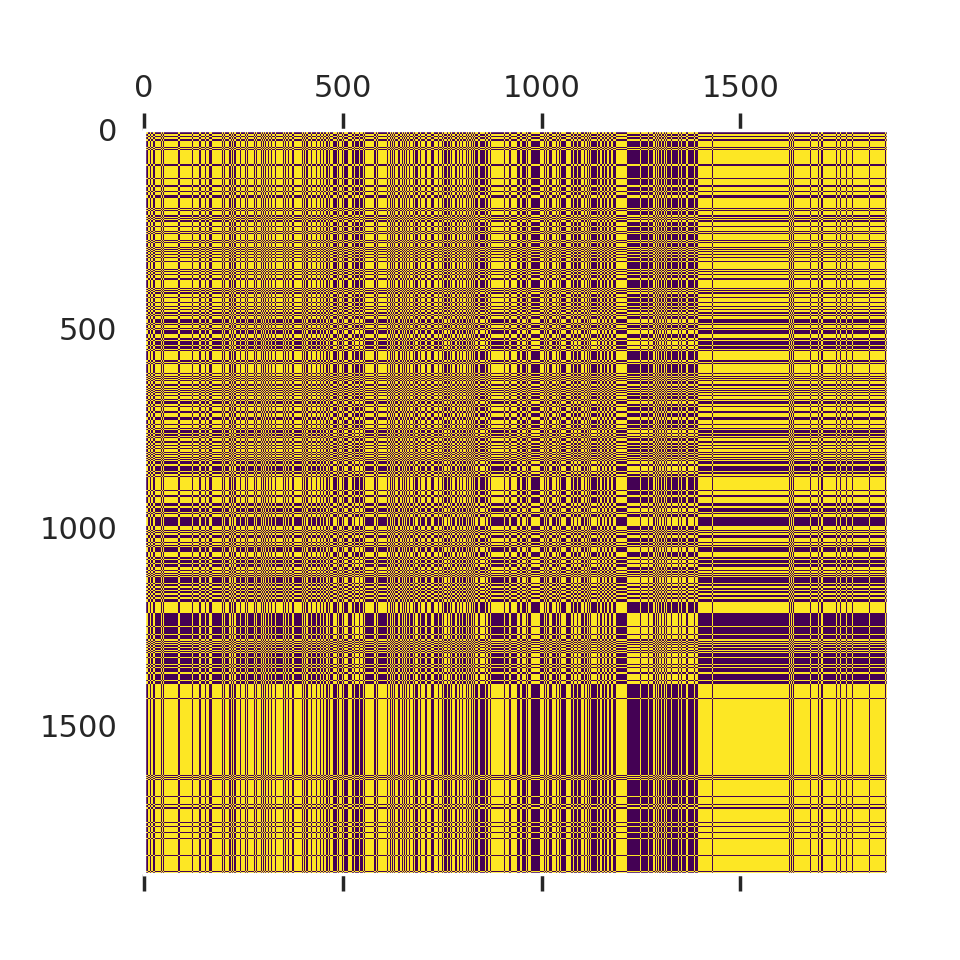

In [366]:
# Plot the correlation matrix
plt.matshow(corr_mat_v1_list)

In [ ]:
# Since we are only interested in the correlation b/w betas_valid and Y_hat and not between themselves, let's remove the irrelevant entries
#rel_size = (corr_mat_v1_list.shape[0])// 2
#corr_mat_rel_v1_list = corr_mat_v1_list[rel_size:,:rel_size]

In [368]:
#corr_mat_rel_v1_list

#### A.1.2 Function call *gen_corr_w_betas()*" for 3 nsd_ids and V1

In [369]:
# Function call for the correlation of a single nsd id - test with first 3 nsd_ids of the shared1000 dataset
nsd_id = shared1000_list[:3]
corr_mat_v1_3nsdid, Y_hat_v1_3nsdid, betas_val_v1_3nsdid = gen_corr_w_betas(roi = 'v1', sal_model= sal_model, sub_num= sub_num,  print_log = True, nsd_id = nsd_id)

Computing correlation for v1

K matrix: (936, 180625)
ROI: v1
ROI: v1
ROI: v1
NSD ID: 2951
S_mat shape for NSD ID 2951: (180625,)
Betas matrix shape for NSD ID 2951: (936,)
Y_hat matrix: (936,)
NSD ID: 2991
S_mat shape for NSD ID 2991: (180625,)
Betas matrix shape for NSD ID 2991: (936,)
Y_hat matrix: (936,)
NSD ID: 3050
S_mat shape for NSD ID 3050: (180625,)
Betas matrix shape for NSD ID 3050: (936,)
Y_hat matrix: (936,)
Concatenated Y_hat shape: (936, 3)
Concatenated betas_val shape: (936, 3)
Correlation matrix shape: (1872, 1872)


In [370]:
corr_mat_v1_3nsdid.shape

(1872, 1872)

In [371]:
""" # Distinguish the highest value of corr_mat_v1_list
highest_corr = np.max(corr_mat_v1_3nsdid)
print (highest_corr) """

' # Distinguish the highest value of corr_mat_v1_list\nhighest_corr = np.max(corr_mat_v1_3nsdid)\nprint (highest_corr) '

In [372]:
""" # Print how often the highest correlation occurs
highest_corr_count = np.sum(corr_mat_v1_3nsdid == highest_corr)
print(f"Highest correlation value: {highest_corr}")
print(f"Number of times highest correlation occurs: {highest_corr_count}")
# Analysis of nan values in the correlation matrix 
print(np.isnan(corr_mat_v1_3nsdid).any())  # True if there are NaN values
nan_indices = np.where(np.isnan(corr_mat_v1_3nsdid))
# Count the number of NaN values
nan_count = np.sum(np.isnan(corr_mat_v1_3nsdid))
print(f"Number of NaN values: {nan_count}") """

' # Print how often the highest correlation occurs\nhighest_corr_count = np.sum(corr_mat_v1_3nsdid == highest_corr)\nprint(f"Highest correlation value: {highest_corr}")\nprint(f"Number of times highest correlation occurs: {highest_corr_count}")\n# Analysis of nan values in the correlation matrix \nprint(np.isnan(corr_mat_v1_3nsdid).any())  # True if there are NaN values\nnan_indices = np.where(np.isnan(corr_mat_v1_3nsdid))\n# Count the number of NaN values\nnan_count = np.sum(np.isnan(corr_mat_v1_3nsdid))\nprint(f"Number of NaN values: {nan_count}") '

In [373]:
""" # Plot the correlation matrix
plt.matshow(corr_mat_v1_3nsdid) """

' # Plot the correlation matrix\nplt.matshow(corr_mat_v1_3nsdid) '

In [374]:
""" # Since we are only interested in the correlation b/w betas_valid and Y_hat and not between themselves, let's remove the irrelevant entries
rel_size = (corr_mat_v1_3nsdid.shape[0])// 2
corr_mat_rel_v1_3nsdid = corr_mat_v1_3nsdid[rel_size:,:rel_size] """

" # Since we are only interested in the correlation b/w betas_valid and Y_hat and not between themselves, let's remove the irrelevant entries\nrel_size = (corr_mat_v1_3nsdid.shape[0])// 2\ncorr_mat_rel_v1_3nsdid = corr_mat_v1_3nsdid[rel_size:,:rel_size] "

In [375]:
## Plot the correlation matrix
#plt.matshow(corr_mat_rel_v1_3nsdid)

#### A.1.3 Function call *gen_corr_w_betas()*" for 5 nsd_ids and V1

In [376]:
# Function call for the correlation of a single nsd id - test with all nsd ids of the shared1000 dataset
nsd_id = shared1000_list[:5]
corr_mat_v1_5nsdid, Y_hat_v1_5nsdid, betas_val_v1_5nsdid = gen_corr_w_betas(roi = 'v1', sal_model= sal_model, sub_num= sub_num, print_log = True, nsd_id = nsd_id)

Computing correlation for v1

K matrix: (936, 180625)
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
NSD ID: 2951
S_mat shape for NSD ID 2951: (180625,)
Betas matrix shape for NSD ID 2951: (936,)
Y_hat matrix: (936,)
NSD ID: 2991
S_mat shape for NSD ID 2991: (180625,)
Betas matrix shape for NSD ID 2991: (936,)
Y_hat matrix: (936,)
NSD ID: 3050
S_mat shape for NSD ID 3050: (180625,)
Betas matrix shape for NSD ID 3050: (936,)
Y_hat matrix: (936,)
NSD ID: 3078
S_mat shape for NSD ID 3078: (180625,)
Betas matrix shape for NSD ID 3078: (936,)
Y_hat matrix: (936,)
NSD ID: 3147
S_mat shape for NSD ID 3147: (180625,)
Betas matrix shape for NSD ID 3147: (936,)
Y_hat matrix: (936,)
Concatenated Y_hat shape: (936, 5)
Concatenated betas_val shape: (936, 5)
Correlation matrix shape: (1872, 1872)


In [377]:
""" plt.matshow(corr_mat_v1_5nsdid)
# Since we are only interested in the correlation b/w betas_valid and Y_hat and not between themselves, let's remove the irrelevant entries
rel_size = (corr_mat_v1_5nsdid.shape[0])// 2
corr_mat_rel_v1_5nsdid = corr_mat_v1_5nsdid[rel_size:,:rel_size]
plt.matshow(corr_mat_rel_v1_5nsdid) """

" plt.matshow(corr_mat_v1_5nsdid)\n# Since we are only interested in the correlation b/w betas_valid and Y_hat and not between themselves, let's remove the irrelevant entries\nrel_size = (corr_mat_v1_5nsdid.shape[0])// 2\ncorr_mat_rel_v1_5nsdid = corr_mat_v1_5nsdid[rel_size:,:rel_size]\nplt.matshow(corr_mat_rel_v1_5nsdid) "

### A.1.4 Function call *gen_corr_w_betas()*" for first 15 nsd_ids and V1

In [378]:
""" # Function call for the correlation of a single nsd id - test with all nsd ids of the shared1000 dataset
nsd_id = shared1000_list[:15]
corr_mat_v1_15nsdid, Y_hat_v1_15nsdid, betas_val_v1_15nsdid = gen_corr_w_betas(roi = 'v1', sal_model= sal_model, sub_num = sub_num, print_log = True, nsd_id = nsd_id) """

" # Function call for the correlation of a single nsd id - test with all nsd ids of the shared1000 dataset\nnsd_id = shared1000_list[:15]\ncorr_mat_v1_15nsdid, Y_hat_v1_15nsdid, betas_val_v1_15nsdid = gen_corr_w_betas(roi = 'v1', sal_model= sal_model, sub_num = sub_num, print_log = True, nsd_id = nsd_id) "

In [379]:
""" plt.matshow(corr_mat_v1_15nsdid)
# Since we are only interested in the correlation b/w betas_valid and Y_hat and not between themselves, let's remove the irrelevant entries 
rel_size = (corr_mat_v1_15nsdid.shape[0])// 2
corr_mat_rel_v1_15nsdid = corr_mat_v1_15nsdid[rel_size:,:rel_size]
plt.matshow(corr_mat_rel_v1_15nsdid)
 """

" plt.matshow(corr_mat_v1_15nsdid)\n# Since we are only interested in the correlation b/w betas_valid and Y_hat and not between themselves, let's remove the irrelevant entries \nrel_size = (corr_mat_v1_15nsdid.shape[0])// 2\ncorr_mat_rel_v1_15nsdid = corr_mat_v1_15nsdid[rel_size:,:rel_size]\nplt.matshow(corr_mat_rel_v1_15nsdid)\n "

### A.2 Function call *gen_corr_w_betas()*" for all nsd_ids and v1
Correlate the pRF estimated fMRI response of all nsd imgs with the calculated beta response. 

In [ ]:
# Generate the correlation matrix for the V1 ROI, print log
# is set to true 

# Function call for the correlation of a single nsd id - test with all nsd ids of the shared1000 dataset
nsd_ids = shared1000_list
corr_mat_v1, Y_hat_v1, betas_val_v1 = gen_corr_w_betas(roi = 'v1', sal_model= sal_model, sub_num= sub_num, print_log = True, nsd_id = nsd_ids)

Computing correlation for v1

K matrix: (936, 180625)
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
RO

(1872, 1872)


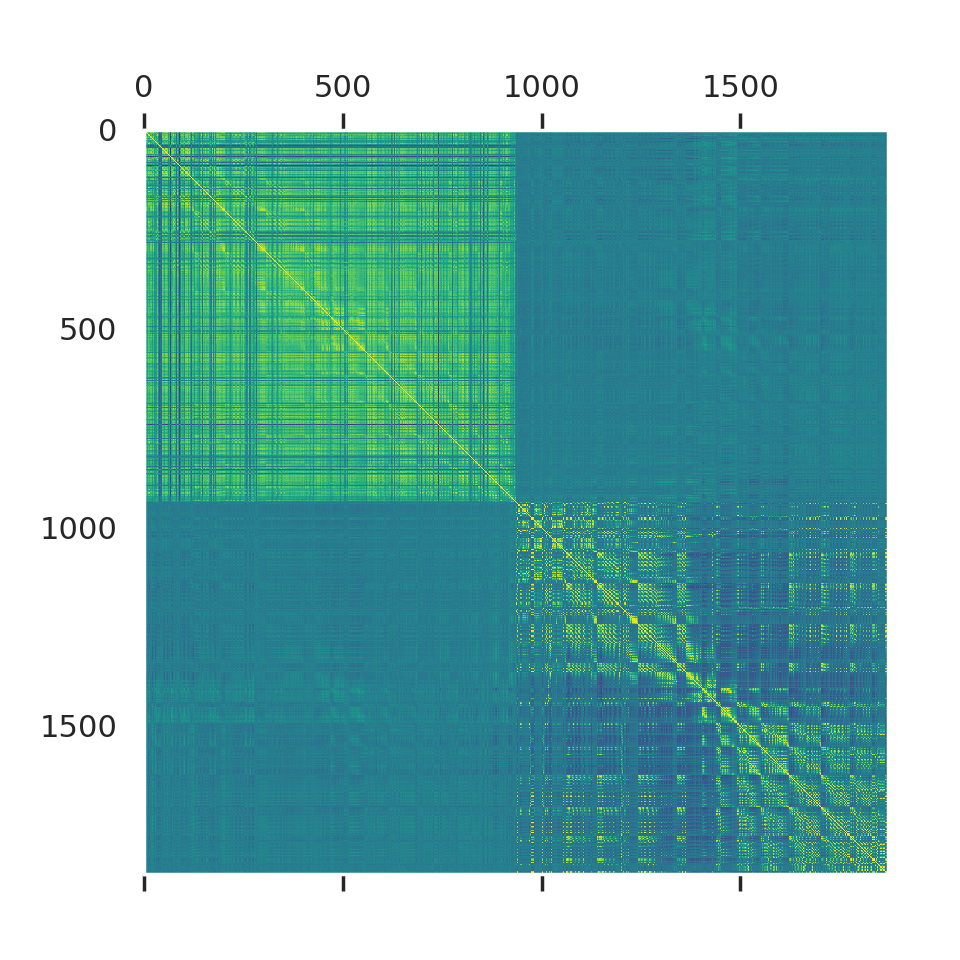

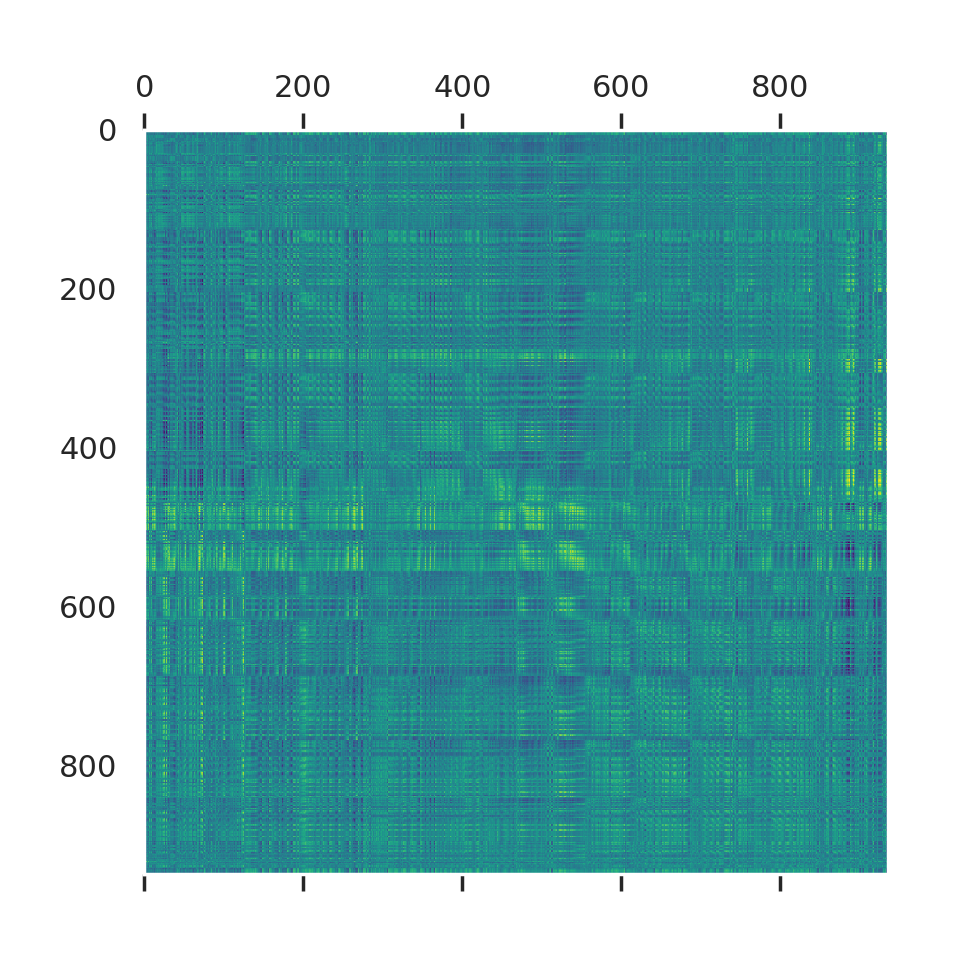

In [383]:
print(corr_mat_v1.shape)

# Plot the correlation matrix
plt.matshow(corr_mat_v1)

# Since we are only interested in the correlation b/w betas_valid and Y_hat and not between themselves, let's remove the irrelevant entries 
rel_size = (corr_mat_v1.shape[0])// 2
corr_mat_rel_v1 = corr_mat_v1[rel_size:,:rel_size]

plt.matshow(corr_mat_rel_v1, cmap='viridis')


In [384]:
print(np.tanh(np.arctanh(corr_mat_rel_v1)))
print(corr_mat_rel_v1.max())

[[ 0.00249434 -0.00465927  0.02191129 ... -0.0357837   0.03500812
  -0.023111  ]
 [-0.00533591 -0.01124386  0.0145315  ... -0.03035335  0.03121824
  -0.03150784]
 [ 0.00598809  0.00488225  0.03141925 ... -0.06951227  0.04612093
   0.00565545]
 ...
 [-0.08444551 -0.0846816  -0.08550365 ...  0.04865819 -0.10191515
  -0.04226233]
 [-0.0793817  -0.08339604 -0.09045168 ...  0.051959   -0.10907902
  -0.04107582]
 [-0.06268848 -0.06628944 -0.10945469 ...  0.00592966 -0.00668567
  -0.01349557]]
0.3034108612757175


In [ ]:
# Basic statistics of the correlation matrix

# Print the shape of the correlation matrix
print(corr_mat_rel_v1.shape)
# Distinguish the highest value of corr_mat_v1_list
highest_corr = np.max((corr_mat_rel_v1))
# Print how often the highest correlation occurs
highest_corr_count = np.sum((corr_mat_rel_v1) == highest_corr)
print(f"Highest correlation value: {highest_corr}")
print(f"Number of times highest correlation occurs: {highest_corr_count}")
# Analysis of nan values in the correlation matrix 
print(np.isnan(corr_mat_rel_v1).any())  # True if there are NaN values
nan_indices = np.where(np.isnan(corr_mat_rel_v1))
# Count the number of NaN values
nan_count = np.sum(np.isnan(corr_mat_rel_v1)) # There are 3071 NaN values for v1 (1536*1536 = 2.359.296, 2.359.296-3.071 =2.356.225 )

print(f"Number of NaN values: {nan_count}")
print(f"NaN values found at indices: {nan_indices}")

print(highest_corr)
# Print the distribution of other values in the correlation matrix 
print(np.unique(corr_mat_rel_v1))
# Print the variance of the correlation matrix
print(f"Variance of corr_mat: {np.var(corr_mat_rel_v1)}")

# Print the mean of the correlation matrix
print(f"Mean of corr_mat: {np.mean(corr_mat_rel_v1)}")
# Print the standard deviation of the correlation matrix
print(f"Standard deviation of corr_mat: {np.std(corr_mat_rel_v1)}")

# Print the median of the correlation matrix
f"Median of corr_mat: {np.median(corr_mat_rel_v1)}"
# Print the 25th percentile of the correlation matrix
f"Mean of 25th percentile: {np.percentile(corr_mat_rel_v1,25)}"
# Print the 75th percentile of the correlation matrix
f"Mean of 75th percentile: {np.percentile(corr_mat_rel_v1,75)}"

(936, 936)
Highest correlation value: 0.3034108612757175
Number of times highest correlation occurs: 1
False
Number of NaN values: 0
NaN values found at indices: (array([], dtype=int64), array([], dtype=int64))
0.3034108612757175
[-0.27564192 -0.27014993 -0.26973899 ...  0.29845469  0.29934421
  0.30341086]
Variance of corr_mat: 0.0025872798568290596
Mean of corr_mat: -0.004601880706790109
Standard deviation of corr_mat: 0.05086531093809473


'Mean of 75th percentile: 0.025390816212013126'

In [386]:
# Generate the correlation matrix for the V1 ROI, print log
# is set to True 

# Function call for the correlation of a single nsd id - test with all nsd ids of the shared1000 dataset
nsd_ids = shared1000_list
corr_mat_v3, Y_hat_v3, betas_val_v3 = gen_corr_w_betas(roi = 'v3', sal_model= sal_model,  sub_num= sub_num, print_log = True, nsd_id = nsd_ids)

Computing correlation for v3

K matrix: (1035, 180625)
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
ROI: v3
R

### A.3 Function call generate correlation matrix and y hat for subject 1 and v4 



In [387]:
# Generate the correlation matrix for the V1 ROI, print log
# is set to True 

# Function call for the correlation of a single nsd id - test with all nsd ids of the shared1000 dataset
nsd_ids = shared1000_list
corr_mat_v4, Y_hat_v4, betas_val_v4 = gen_corr_w_betas(roi = 'v4', sal_model= sal_model,  sub_num= sub_num, print_log = True, nsd_id = nsd_ids)

Computing correlation for v4

K matrix: (415, 180625)
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
RO

In [388]:
# Save correlation matrix for the V4 ROI and all nsd ids to disk
sal_model

if sal_model == 'GroundTruthEyeTracking':
    np.save(DATA_PATH_subj/ f'corr_mat_v4_4quatils.npy', corr_mat_v4)
elif sal_model == 'AllFixations':
    np.save(DATA_PATH_subj/ f'corr_mat_v4_allfixations_4quartils.npy', corr_mat_v4)
elif sal_model== 'DeepGaze':
    np.save(DATA_PATH_subj/ f'corr_mat_v4_deepgazeIIE_4quartils.npy', corr_mat_v4)

(830, 830)


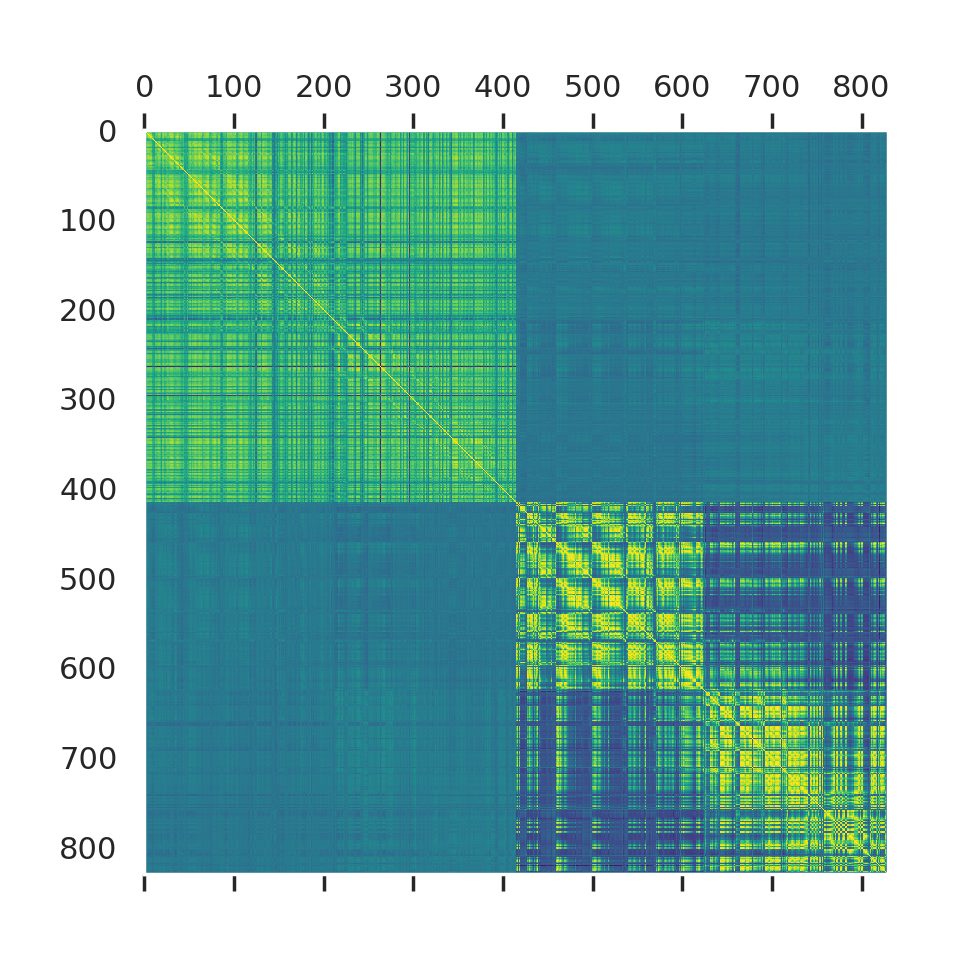

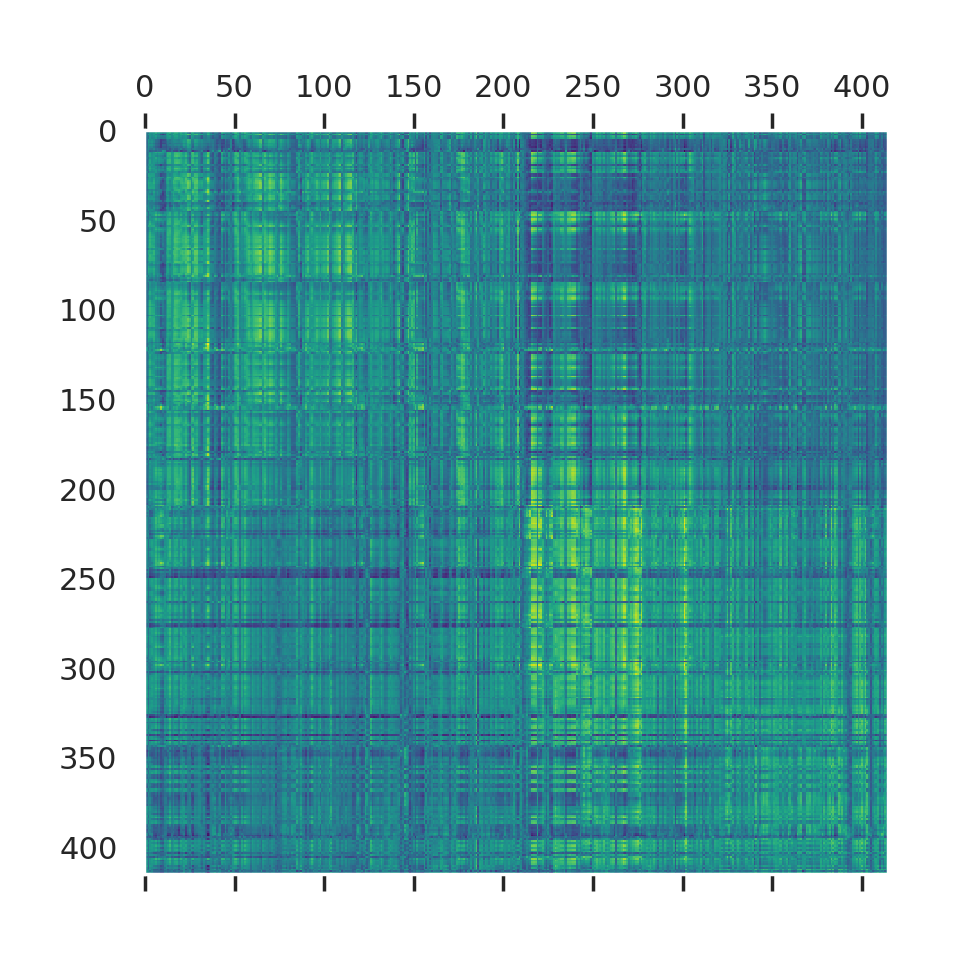

In [389]:
print(corr_mat_v4.shape)

# Plot the correlation matrix
plt.matshow(corr_mat_v4)

# Since we are only interested in the correlation b/w betas_valid and Y_hat and not between themselves, let's remove the irrelevant entries 
rel_size = (corr_mat_v4.shape[0])// 2
corr_mat_rel_v4 = corr_mat_v4[rel_size:,:rel_size]

plt.matshow(corr_mat_rel_v4, cmap='viridis')

In [390]:
# Save correlation matrix for the V4 ROI and all nsd ids to disk
sal_model

if sal_model == 'GroundTruthEyeTracking':
    np.save(DATA_PATH_subj/ f'corr_mat_rel_v4_4quatils.npy', corr_mat_rel_v4)
elif sal_model == 'AllFixations':
    np.save(DATA_PATH_subj/ f'corr_mat_rel_v4_allfixations_4quartils.npy', corr_mat_rel_v4)
elif sal_model == 'DeepGaze':
    np.save(DATA_PATH_subj/ f'corr_mat_rel_v4_deepgazeIIE_4quartils.npy', corr_mat_rel_v4)

### A.4 Function call *gen_corr_w_betas()*" for all nsd_ids and V2


In [391]:
""" # Generate the correlation matrix for the V1 ROI, print log
# is set to True 

# Function call for the correlation of a single nsd id - test with all nsd ids of the shared1000 dataset
nsd_ids = shared1000_list
corr_mat_v2, Y_hat_v2, betas_val_v2 = gen_corr_w_betas(roi = 'v2', sal_model= sal_model, sub_num= sub_num, print_log = True, nsd_id = nsd_ids) """

" # Generate the correlation matrix for the V1 ROI, print log\n# is set to True \n\n# Function call for the correlation of a single nsd id - test with all nsd ids of the shared1000 dataset\nnsd_ids = shared1000_list\ncorr_mat_v2, Y_hat_v2, betas_val_v2 = gen_corr_w_betas(roi = 'v2', sal_model= sal_model, sub_num= sub_num, print_log = True, nsd_id = nsd_ids) "

In [392]:
""" print(corr_mat_v2.shape)

# Plot the correlation matrix
plt.matshow(corr_mat_v2)

# Since we are only interested in the correlation b/w betas_valid and Y_hat and not between themselves, let's remove the irrelevant entries 
rel_size = (corr_mat_v2.shape[0])// 2
corr_mat_rel_v2 = corr_mat_v2[rel_size:,:rel_size]

plt.matshow(corr_mat_rel_v2, cmap='viridis') """

" print(corr_mat_v2.shape)\n\n# Plot the correlation matrix\nplt.matshow(corr_mat_v2)\n\n# Since we are only interested in the correlation b/w betas_valid and Y_hat and not between themselves, let's remove the irrelevant entries \nrel_size = (corr_mat_v2.shape[0])// 2\ncorr_mat_rel_v2 = corr_mat_v2[rel_size:,:rel_size]\n\nplt.matshow(corr_mat_rel_v2, cmap='viridis') "

In [393]:
""" # Save correlation matrix for the V2 ROI and all nsd ids, sub 1 to disk
sal_model

if sal_model == 'GroundTruthEyeTracking':
    np.save(DATA_PATH_subj/ f'corr_mat_v2.npy', corr_mat_v2)
    np.save(DATA_PATH_subj/ f'corr_mat_rel_v2.npy', corr_mat_rel_v2)
elif sal_model == 'AllFixations':
    np.save(DATA_PATH_subj/ f'corr_mat_v2_allfixations.npy', corr_mat_v2)
    np.save(DATA_PATH_subj/ f'corr_mat_rel_v2_allfixations.npy', corr_mat_rel_v2)
elif sal_model == 'DeepGaze':
    np.save(DATA_PATH_subj/ f'corr_mat_v2_deepgaze.npy', corr_mat_v2)
    np.save(DATA_PATH_subj/ f'corr_mat_rel_v2_deepgaze.npy', corr_mat_rel_v2) """


" # Save correlation matrix for the V2 ROI and all nsd ids, sub 1 to disk\nsal_model\n\nif sal_model == 'GroundTruthEyeTracking':\n    np.save(DATA_PATH_subj/ f'corr_mat_v2.npy', corr_mat_v2)\n    np.save(DATA_PATH_subj/ f'corr_mat_rel_v2.npy', corr_mat_rel_v2)\nelif sal_model == 'AllFixations':\n    np.save(DATA_PATH_subj/ f'corr_mat_v2_allfixations.npy', corr_mat_v2)\n    np.save(DATA_PATH_subj/ f'corr_mat_rel_v2_allfixations.npy', corr_mat_rel_v2)\nelif sal_model == 'DeepGaze':\n    np.save(DATA_PATH_subj/ f'corr_mat_v2_deepgaze.npy', corr_mat_v2)\n    np.save(DATA_PATH_subj/ f'corr_mat_rel_v2_deepgaze.npy', corr_mat_rel_v2) "

# B. Function call and execution *gen_corr_full()*" for all nsd_ids and all ROIs

- Either generate correlation for all ROIs 
- ... or generate correlation for a list of ROIs, depending on neighbored regions in the brain 

In [ ]:
# Divide ROIs into different categories

viz_roi_list = ["v1","v2","v3","v4"]
floc_faces_roi_list = ["ofa","ffa1", "ffa2", "atl"]
floc_words_roi_list = ["eba","fba1", "fba2"]
floc_places_roi_list = ["opa", "ppa", "rsc"]
floc_bodies_roi_list = ["owfa", "vwfa_1", "vwfa_2", "mfs_words", "mtl_words"]

ventral_temporal_roi_list = ["vo1","vo2","phc1","phc2"]
dorso_lateral_roi_list = ["v3a","v3b","lo2","lo1"]
pareital_frontal_roi_list = ["ips0","ips1","ips2","ips3","ips4","ips5","spl1","fef"]
       

## B.1. Generate correlation corr_full for all ROIs/ a given ROI-list, for the given subject id and the given saliency model and the given nds_ids 

Returns df_main --> a dataframe containing the corrleation values (Pearsons r) and p-values for a given voxel of the main diagonal (of the corr_mat_rel_roi - *the lower, left quadrant of the correlation matrix with the full betas*) 


In [ ]:
def generate_corr_full(roi_list, sub_num, sal_model, nsd_ids):
    '''
    Generate the correlation coefficients and p-values for the given list of ROIs and return them as a dataframe.
    Handles edge cases where an ROI might cause an error (e.g., zero voxels).

    Parameters
    ----------
    roi_list : list
        List of ROIs to process.

    sub_num : int
        Subject number.

    sal_model : str
        Saliency model to use.
    
    nsd_ids : list
        List of NSD IDs to process.
    
    Returns
    -------
    df_main : pd.DataFrame
        DataFrame containing the correlation coefficients of the main diagonal
        ( voxel x correlation with voxel x) for each voxel of a ROI and the
        corresponding p-value (of the correlation coefficient) for each voxel) 
    '''

    corr_vals = {}
    p_vals = {}
    
    
    for roi in roi_list:
        try:
            print(f"Processing ROI: {roi}")
            # Generate the correlation matrix for the current ROI
            corr_mat_roi = gen_corr_w_betas(roi=roi, sal_model= sal_model, sub_num= sub_num, print_log=False, nsd_id=nsd_ids, return_corr_only=True)
            
            # Only look at the correlation between betas_valid and Y_hat and not between themselves
            rel_size = (corr_mat_roi.shape[0]) // 2
            print(f"rel_size for ROI {roi}: {rel_size}")
            
            # Extract the relevant part of the correlation matrix
            corr_mat_rel_roi = corr_mat_roi[rel_size:, :rel_size]
            print(f"Relevant part of the correlation matrix for ROI {roi}:")
            print(corr_mat_rel_roi)
            
            # Extract the diagonal of the correlation matrix
            corr_vals[roi] = corr_mat_rel_roi.diagonal()

            # # Compute p-values for the correlation coefficients
            n = rel_size  # Number of samples
            t_stat = corr_vals[roi] * np.sqrt((n - 2) / (1 - corr_vals[roi]**2))
            p_vals[roi] = 2 * (1 - t.cdf(np.abs(t_stat), df=n - 2))  # Two-tailed p-value
        
        except Exception as e:
            # Print an error message and continue with the next ROI
            print(f"Error processing ROI '{roi}': {e}")
            continue
    
    # Create a main dataframe to which all smaller dataframes (for each ROI) will be appended
    df_main = pd.DataFrame(columns=['ROI', 'corr_coeff', 'p_value'])
    
    for key, val in corr_vals.items():  # Key: ROI, Value: array of correlations
        roi_as_list = [key] * val.shape[0]  # Duplicate the ROI string so that it's in the format we want
        corr_val_list = val
        p_val_list = p_vals[key]
        temp_df = pd.DataFrame({'ROI': roi_as_list, 'corr_coeff': corr_val_list, 'p_value': p_val_list})
        df_main = pd.concat((df_main, temp_df), ignore_index=True)
        
    return df_main

In [396]:
corr_ofa = generate_corr_full(roi_list = ["ofa"], sub_num = sub_num, sal_model = sal_model, nsd_ids = nsd_ids)

Processing ROI: ofa
Computing correlation for ofa

ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI:

In [398]:
viz_roi_list

['v1', 'v2', 'v3', 'v4']

# B.1.1 Function call: To generate correlations for all ROIs

In [399]:
corr_df_viz = generate_corr_full(viz_roi_list, sub_num = sub_num, sal_model = sal_model, nsd_ids = nsd_ids)

Processing ROI: v1
Computing correlation for v1

ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1

ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
rel_size for ROI

/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide


rel_size for ROI v3: 1035
Relevant part of the correlation matrix for ROI v3:
[[-0.026298   -0.01169408 -0.09734905 ...         nan         nan
          nan]
 [ 0.02784759  0.03830103  0.01163826 ...         nan         nan
          nan]
 [-0.06635429 -0.07266888 -0.02854085 ...         nan         nan
          nan]
 ...
 [-0.0402761   0.032636   -0.03621549 ...         nan         nan
          nan]
 [-0.06514574 -0.04371042 -0.12000646 ...         nan         nan
          nan]
 [-0.04697069  0.00744112 -0.08170698 ...         nan         nan
          nan]]
Processing ROI: v4
Computing correlation for v4

ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: 

In [400]:
corr_df_viz 

,ROI,corr_coeff,p_value
0,v1,0.002494,0.939252
1,v1,-0.011244,0.731187
2,v1,0.031419,0.336956
3,v1,-0.024113,0.461231
4,v1,-0.043554,0.183072
...,...,...,...
3394,v4,0.002304,0.962672
3395,v4,0.031059,0.528061
3396,v4,0.061690,0.209800
3397,v4,-0.034034,0.489291


In [401]:
corr_df_viz.shape

(3399, 3)

In [402]:
print(corr_df_viz.max())
print(corr_df_viz.min())

ROI                 v4
corr_coeff    0.245648
p_value       0.998693
dtype: object
ROI                 v1
corr_coeff   -0.109079
p_value            0.0
dtype: object


In [403]:
# Set the style to "whitegrid"
sns.set_style("whitegrid")

## B.2 Visualization of correlation 

/tmp/ipykernel_1386843/2707679052.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

/tmp/ipykernel_1386843/2707679052.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



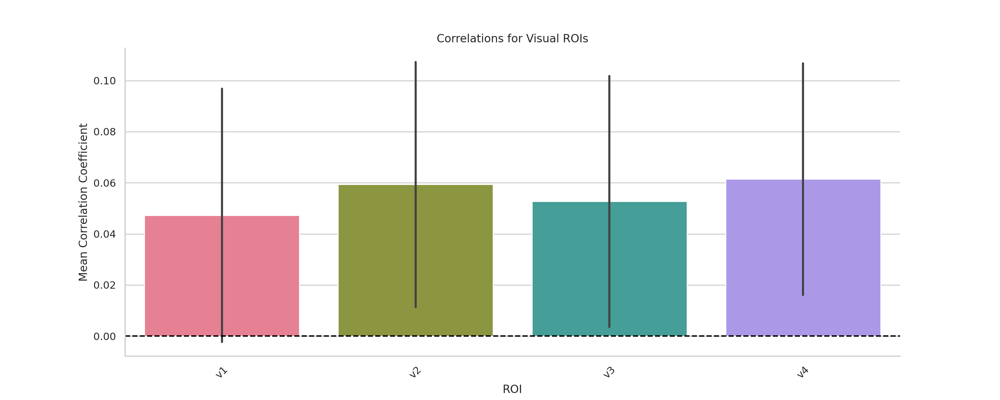

In [404]:
# Bar plot 
# Set the figure size
plt.figure(figsize=(15, 6))  # width and height adjustment

# Create the bar plot
g = sns.barplot(data=corr_df_viz, x="ROI", y="corr_coeff", ci="sd", palette="husl")

# Customize the plot
sns.despine()  # Remove the top and right spines

g.axhline(0, color="black", linestyle="--")  # Add a horizontal line at y=0
g.set(title="Correlations for Visual ROIs", ylabel="Mean Correlation Coefficient")  # Set the title and y-axis label

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()


### Swarm Plot Visual ROIS - Current Sub_Num 

/tmp/ipykernel_1386843/1827206749.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 7.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 10.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 6.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinemann/miniconda3/envs/ns

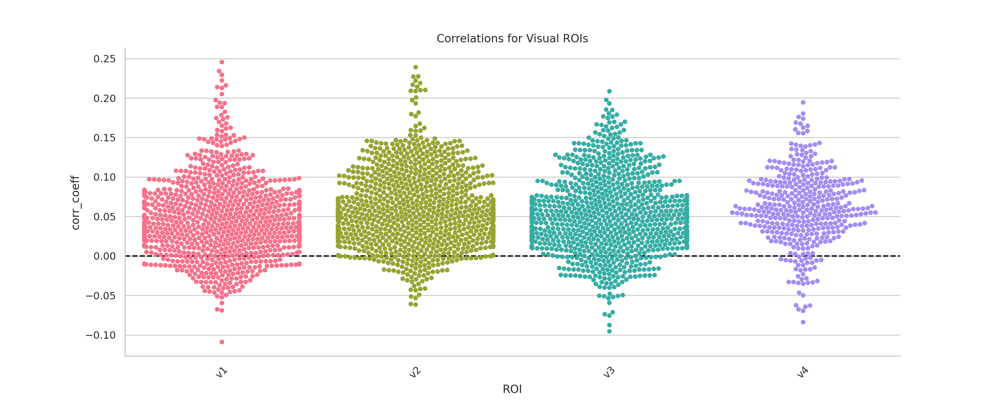

In [405]:
# Swarm plot of the correlation coefficients for each ROI of v1,v2,v3,v4
# Set the figure size
plt.figure(figsize=(15, 6))  # Adjust the width and height as needed

# Create the swarm plot
g = sns.swarmplot(data=corr_df_viz, x="ROI", y="corr_coeff", orient = "v", palette="husl")

# Customize the plot
sns.despine()  # Remove the top and right spines
g.axhline(0, color="black", linestyle="--")  # Add a horizontal line at y=0
g.set(title="Correlations for Visual ROIs")  # Set the title

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()

In [406]:
print(corr_df_viz.duplicated().sum())

109


In [407]:
print(corr_df_viz.head())
print(corr_df_viz["ROI"].value_counts())

  ROI  corr_coeff   p_value
0  v1    0.002494  0.939252
1  v1   -0.011244  0.731187
2  v1    0.031419  0.336956
3  v1   -0.024113  0.461231
4  v1   -0.043554  0.183072
ROI
v3    1035
v2    1013
v1     936
v4     415
Name: count, dtype: int64


In [408]:
print(corr_df_viz["ROI"].unique())

['v1' 'v2' 'v3' 'v4']


In [409]:
corr_df_viz = corr_df_viz.dropna(subset=["corr_coeff"])

In [410]:
print(corr_df_viz.head())
print(corr_df_viz["ROI"].value_counts())

  ROI  corr_coeff   p_value
0  v1    0.002494  0.939252
1  v1   -0.011244  0.731187
2  v1    0.031419  0.336956
3  v1   -0.024113  0.461231
4  v1   -0.043554  0.183072
ROI
v2    1013
v1     936
v3     925
v4     415
Name: count, dtype: int64


In [411]:
print(corr_df_viz.head())
print(corr_df_viz["ROI"].value_counts())

  ROI  corr_coeff   p_value
0  v1    0.002494  0.939252
1  v1   -0.011244  0.731187
2  v1    0.031419  0.336956
3  v1   -0.024113  0.461231
4  v1   -0.043554  0.183072
ROI
v2    1013
v1     936
v3     925
v4     415
Name: count, dtype: int64


/tmp/ipykernel_1386843/3876986412.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[Text(0.5, 1.0, 'Correlations for Viusal ROIs')]

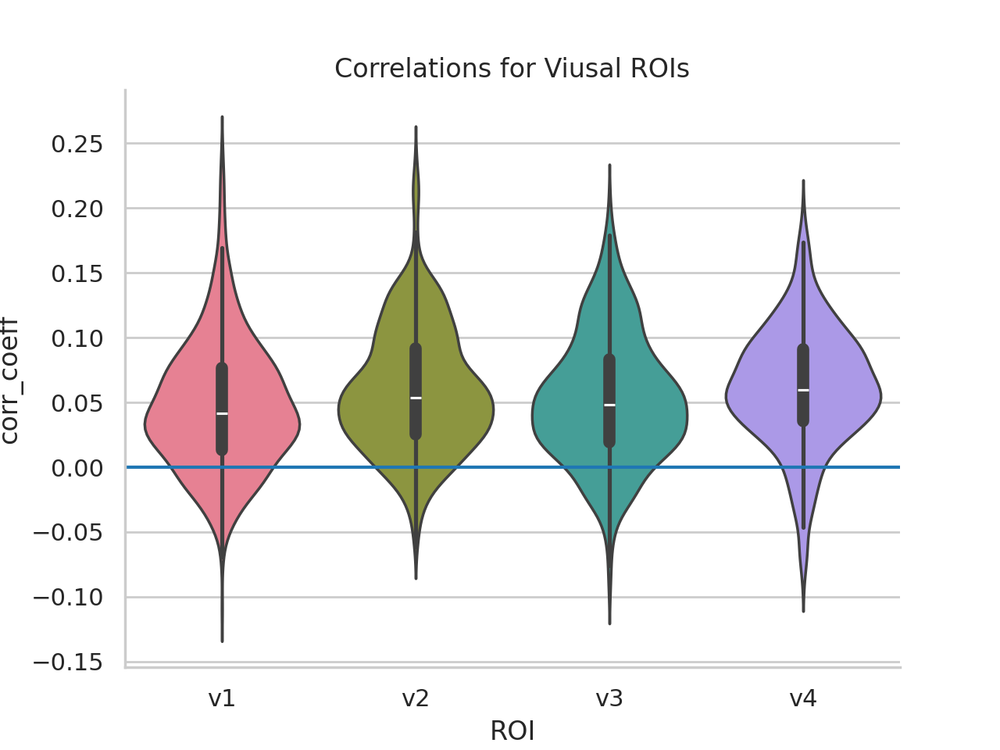

In [412]:
g = sns.violinplot(data=corr_df_viz, x="ROI", y="corr_coeff", palette = "husl")
sns.despine()
g.axhline(0)
g.set(title = 'Correlations for Viusal ROIs')

## B.3 Generate correlation floc_faces  

In [413]:
corr_df_faces = generate_corr_full(roi_list = floc_faces_roi_list, sub_num = sub_num, sal_model = sal_model, nsd_ids = nsd_ids)

Processing ROI: ofa
Computing correlation for ofa

ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI: ofa
ROI:

/tmp/ipykernel_1386843/1519349026.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



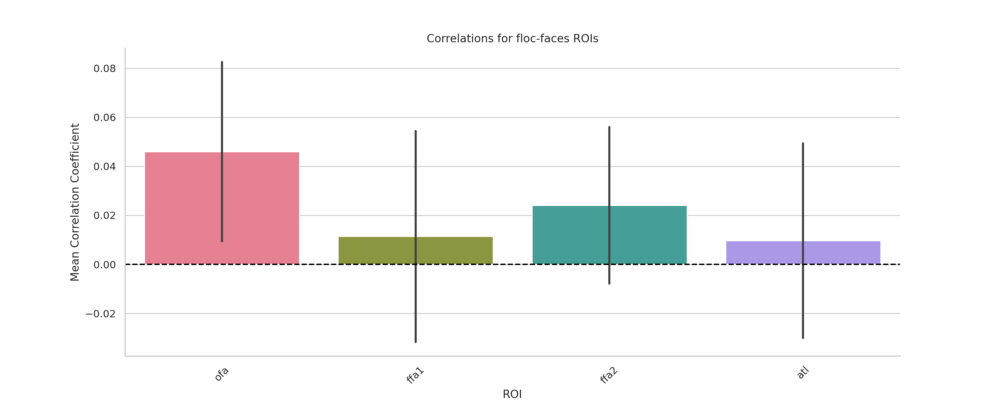

In [ ]:
# Bar plot 
# Set the figure size
plt.figure(figsize=(15, 6))  # Width and height adjustment

# Create the bar plot
g = sns.barplot(data=corr_df_faces, x="ROI", y="corr_coeff", errorbar=('sd', 0.95), orient = "v", palette="husl")

# Customize the plot
sns.despine()  # Remove the top and right spines

g.axhline(0, color="black", linestyle="--")  # Add a horizontal line at y=0
g.set(title="Correlations for floc-faces ROIs", ylabel="Mean Correlation Coefficient")  # Set the title and y-axis label

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()

/tmp/ipykernel_1386843/1174813820.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



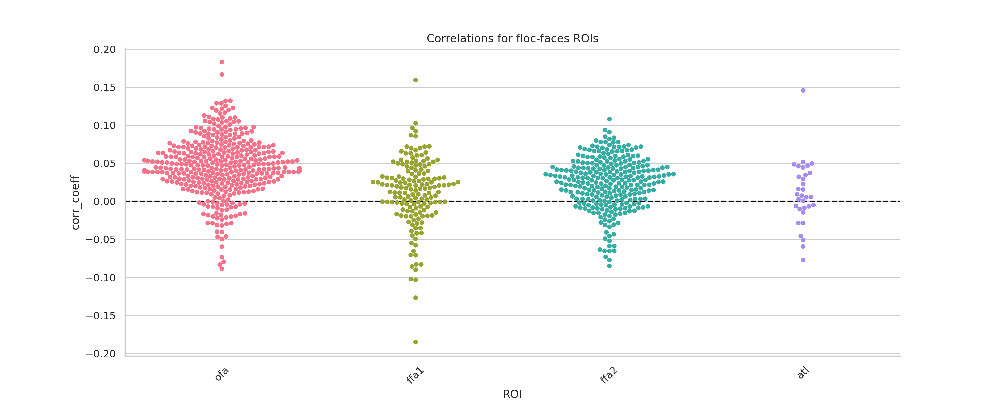

In [415]:
# Swarm plot of the correlation coefficients for each ROI of floc-faces ROIs
# Set the figure size
plt.figure(figsize=(15, 6))  # width and height adjustment

# Create the swarm plot
g = sns.swarmplot(data=corr_df_faces, x="ROI", y="corr_coeff", palette="husl")

# Customize the plot
sns.despine()  # Remove the top and right spines
g.axhline(0, color="black", linestyle="--")  # Add a horizontal line at y=0
g.set(title="Correlations for floc-faces ROIs")  # Set the title

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.show()

[Text(0.5, 1.0, 'Correlations for floc-faces ROIs')]

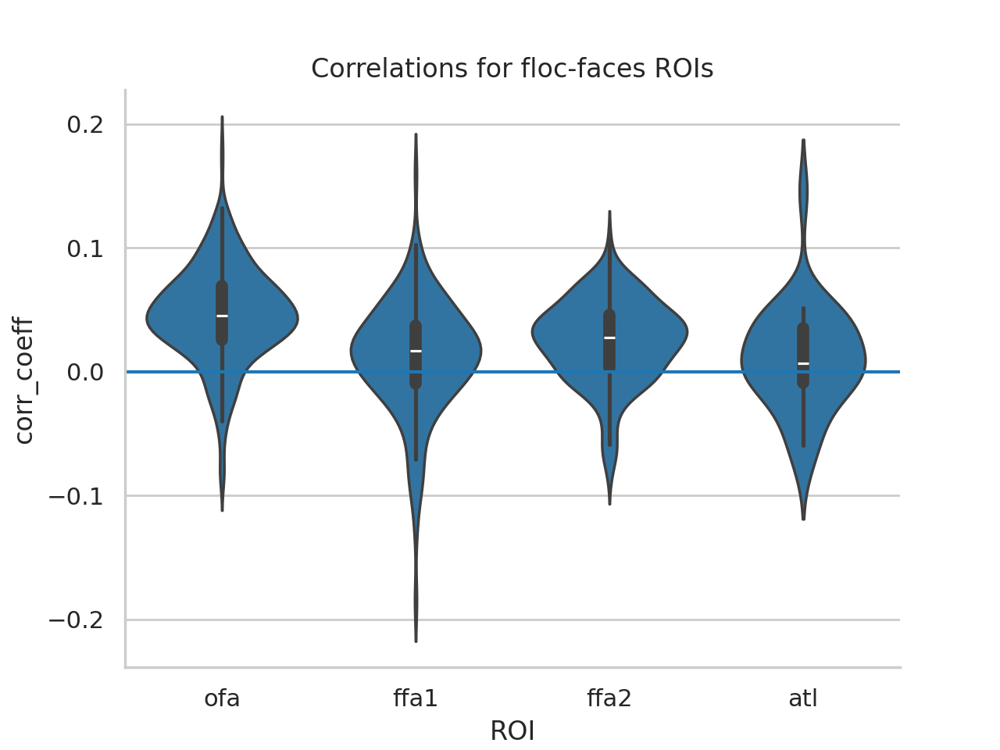

In [416]:
g = sns.violinplot(data = corr_df_faces, x = "ROI" , y = "corr_coeff")
sns.despine()
g.axhline(0)
g.set(title = 'Correlations for floc-faces ROIs')

In [417]:
#print(corr_df_faces.max())
#print(corr_df_faces.min())

# B.4 Generate correlation all_rois

In [418]:
if sal_model == 'GroundTruthEyeTracking':
    corr_df_subj_all_rois = generate_corr_full(all_rois, sub_num = sub_num, sal_model = sal_model, nsd_ids = nsd_ids)
elif sal_model == 'AllFixations':
    corr_df_subj_all_rois_allfixations = generate_corr_full(all_rois, sub_num = sub_num, sal_model = sal_model, nsd_ids = nsd_ids)
elif sal_model == 'DeepGaze':
    corr_df_subj_all_rois_deepgaze = generate_corr_full(all_rois, sub_num = sub_num, sal_model = sal_model, nsd_ids = nsd_ids)

Processing ROI: v1
Computing correlation for v1

ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1
ROI: v1

/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide


rel_size for ROI v3: 1035
Relevant part of the correlation matrix for ROI v3:
[[-0.026298   -0.01169408 -0.09734905 ...         nan         nan
          nan]
 [ 0.02784759  0.03830103  0.01163826 ...         nan         nan
          nan]
 [-0.06635429 -0.07266888 -0.02854085 ...         nan         nan
          nan]
 ...
 [-0.0402761   0.032636   -0.03621549 ...         nan         nan
          nan]
 [-0.06514574 -0.04371042 -0.12000646 ...         nan         nan
          nan]
 [-0.04697069  0.00744112 -0.08170698 ...         nan         nan
          nan]]
Processing ROI: v4
Computing correlation for v4

ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: v4
ROI: 

In [419]:
#corr_df_subj_all_rois

In [420]:
#corr_df_subj_all_rois_deepgaze

In [421]:
if sal_model == 'GroundTruthEyeTracking':
    corr_df_subj_all_rois.shape
elif sal_model == 'AllFixations':
    corr_df_subj_all_rois_allfixations.shape
elif sal_model == 'DeepGaze':
    corr_df_subj_all_rois_deepgaze.shape

In [422]:
if sal_model == 'GroundTruthEyeTracking':
    print(corr_df_subj_all_rois.max())
    print(corr_df_subj_all_rois.min())

elif sal_model == 'DeepGaze':
    print(corr_df_subj_all_rois_deepgaze.max())
    print(corr_df_subj_all_rois_deepgaze.min())

ROI             vwfa_2
corr_coeff    0.245648
p_value       0.999892
dtype: object
ROI                atl
corr_coeff   -0.198116
p_value            0.0
dtype: object


In [423]:
# Function call to create corr for v3 
#corr_df_v3 = generate_corr_full(roi_list = ["v3"], sub_num = sub_num, sal_model = sal_model, nsd_ids = nsd_ids)

In [ ]:
# Save the correlation matrix for all ROIs and all nsd ids to disk
if sal_model == 'GroundTruthEyeTracking':
    np.save(DATA_PATH_subj/ f'corr_mat_all_rois_subj0{sub_num}.npy', corr_df_subj_all_rois)
elif sal_model == 'AllFixations':
    np.save(DATA_PATH_subj/ f'corr_mat_all_rois_allfixations_subj0{sub_num}.npy', corr_df_subj_all_rois_allfixations)
elif sal_model == 'DeepGaze':
    np.save(DATA_PATH_subj/ f'corr_mat_all_rois_deepgazeIIE_subj0{sub_num}.npy', corr_df_subj_all_rois_deepgaze)

In [425]:
# Check corr_mat_all_rois for potential NaN values, print the number of NaN values and their indices and delete them

if sal_model == 'GroundTruthEyeTracking':
    print(corr_df_subj_all_rois.isnull().any())  # True if there are NaN values in any column
    nan_count = corr_df_subj_all_rois.isnull().sum()
    print(f"Number of NaN values per column:\n{nan_count}")
    nan_indices = corr_df_subj_all_rois[corr_df_subj_all_rois.isnull().any(axis=1)].index
    print(f"NaN values found at indices: {list(nan_indices)}")
elif sal_model == 'AllFixations':
    print(corr_df_subj_all_rois_allfixations.isnull().any())
    nan_count = corr_df_subj_all_rois_allfixations.isnull().sum()
    print(f"Number of NaN values per column:\n{nan_count}")
    nan_indices = corr_df_subj_all_rois_allfixations[corr_df_subj_all_rois_allfixations.isnull().any(axis=1)].index
    print(f"NaN values found at indices: {list(nan_indices)}")
elif sal_model == 'DeepGaze':
    print(corr_df_subj_all_rois_deepgaze.isnull().any())
    nan_count = corr_df_subj_all_rois_deepgaze.isnull().sum()
    print(f"Number of NaN values per column:\n{nan_count}")
    nan_indices = corr_df_subj_all_rois_deepgaze[corr_df_subj_all_rois_deepgaze.isnull().any(axis=1)].index
    print(f"NaN values found at indices: {list(nan_indices)}")


ROI           False
corr_coeff     True
p_value        True
dtype: bool
Number of NaN values per column:
ROI             0
corr_coeff    829
p_value       829
dtype: int64
NaN values found at indices: [2874, 2875, 2876, 2877, 2878, 2879, 2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887, 2888, 2889, 2890, 2891, 2892, 2893, 2894, 2895, 2896, 2897, 2898, 2899, 2900, 2901, 2902, 2903, 2904, 2905, 2906, 2907, 2908, 2909, 2910, 2911, 2912, 2913, 2914, 2915, 2916, 2917, 2918, 2919, 2920, 2921, 2922, 2923, 2924, 2925, 2926, 2927, 2928, 2929, 2930, 2931, 2932, 2933, 2934, 2935, 2936, 2937, 2938, 2939, 2940, 2941, 2942, 2943, 2944, 2945, 2946, 2947, 2948, 2949, 2950, 2951, 2952, 2953, 2954, 2955, 2956, 2957, 2958, 2959, 2960, 2961, 2962, 2963, 2964, 2965, 2966, 2967, 2968, 2969, 2970, 2971, 2972, 2973, 2974, 2975, 2976, 2977, 2978, 2979, 2980, 2981, 2982, 2983, 6920, 6921, 6922, 6923, 6924, 6925, 6926, 6927, 6928, 6929, 6930, 6931, 6932, 6933, 6934, 6935, 6936, 6937, 6938, 6939, 6940, 6941, 6942, 

In [426]:

if sal_model == 'GroundTruthEyeTracking':
    corr_df_subj_all_rois = corr_df_subj_all_rois.dropna()
elif sal_model == 'AllFixations':
    corr_df_subj_all_rois_allfixations = corr_df_subj_all_rois_allfixations.dropna()
elif sal_model == 'DeepGaze':
    corr_df_subj_all_rois_deepgaze = corr_df_subj_all_rois_deepgaze.dropna()
# Check the shape of the correlation matrix after removing NaN values
if sal_model == 'GroundTruthEyeTracking':
    corr_df_subj_all_rois.shape
elif sal_model == 'AllFixations':
    corr_df_subj_all_rois_allfixations.shape
elif sal_model == 'DeepGaze':
    corr_df_subj_all_rois_deepgaze.shape

##+ Generation of barplots - Visual ROIs
Generate barplots with standard deviation visualization and a confidence interval of 0.95 for all roi_categories 
and print the Pearsons *r* correlation value as well as the *p* value. 

DataFrame loaded successfully.


/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



Plot saved: /gpfs01/bartels/group/lheinemann/saliency-nsd-pub/results/Plots_Correlation_nsd_all_shared1000/subj06/visual_rois_barplot.png


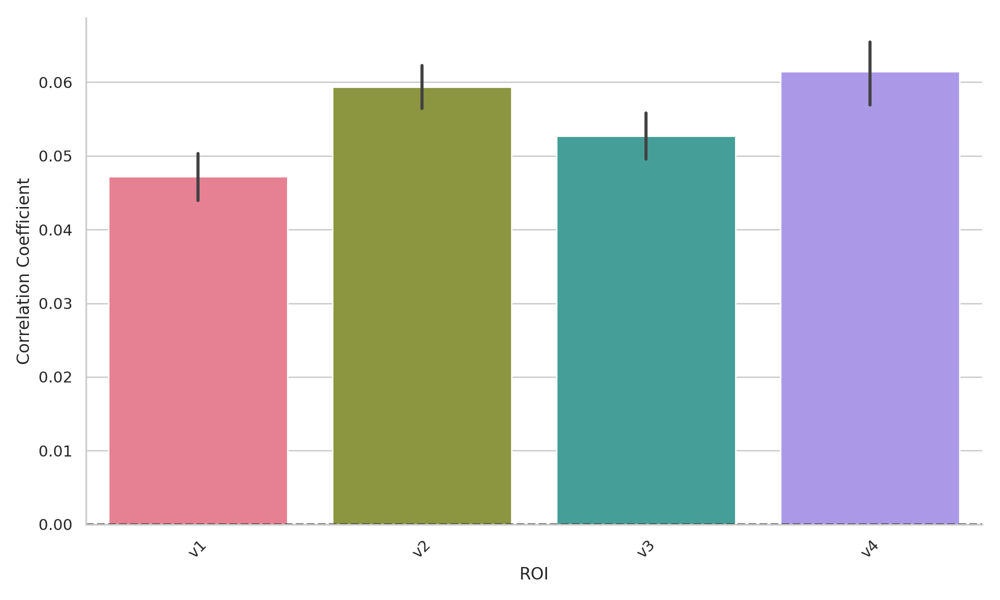

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



Plot saved: /gpfs01/bartels/group/lheinemann/saliency-nsd-pub/results/Plots_Correlation_nsd_all_shared1000/subj06/floc_faces_rois_barplot.png


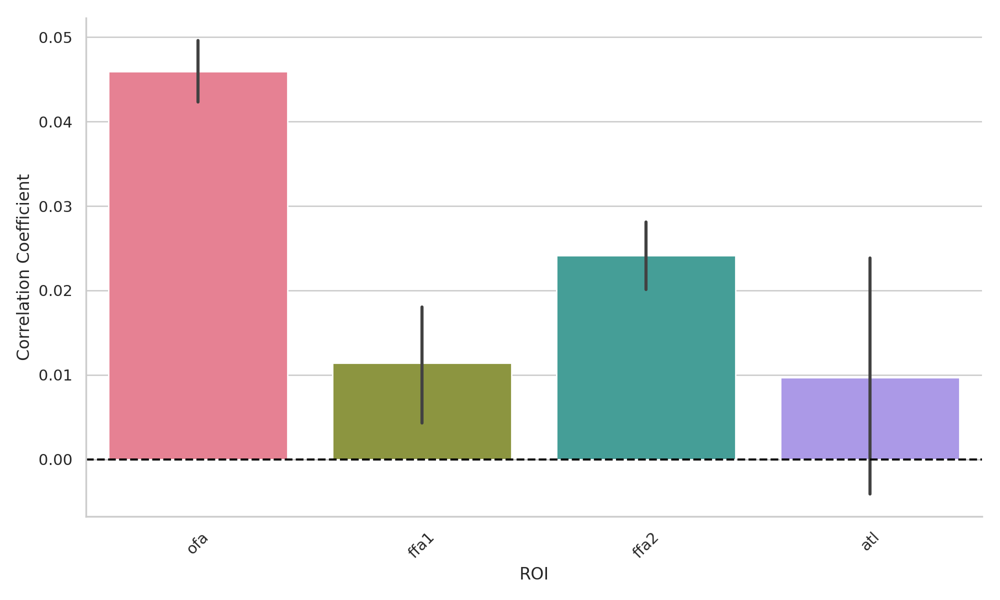

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



Plot saved: /gpfs01/bartels/group/lheinemann/saliency-nsd-pub/results/Plots_Correlation_nsd_all_shared1000/subj06/floc_words_rois_barplot.png


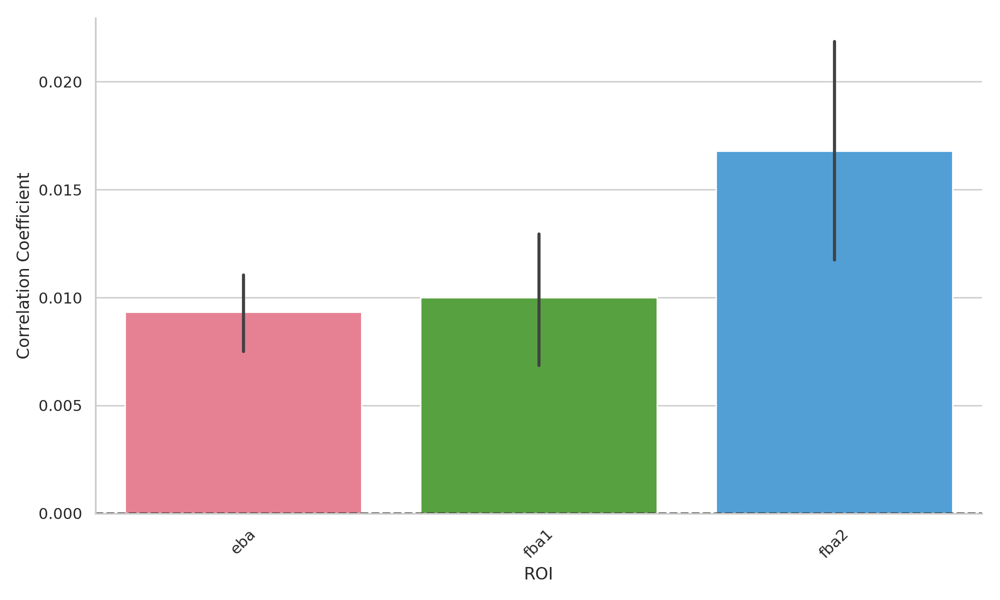

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



Plot saved: /gpfs01/bartels/group/lheinemann/saliency-nsd-pub/results/Plots_Correlation_nsd_all_shared1000/subj06/floc_places_rois_barplot.png


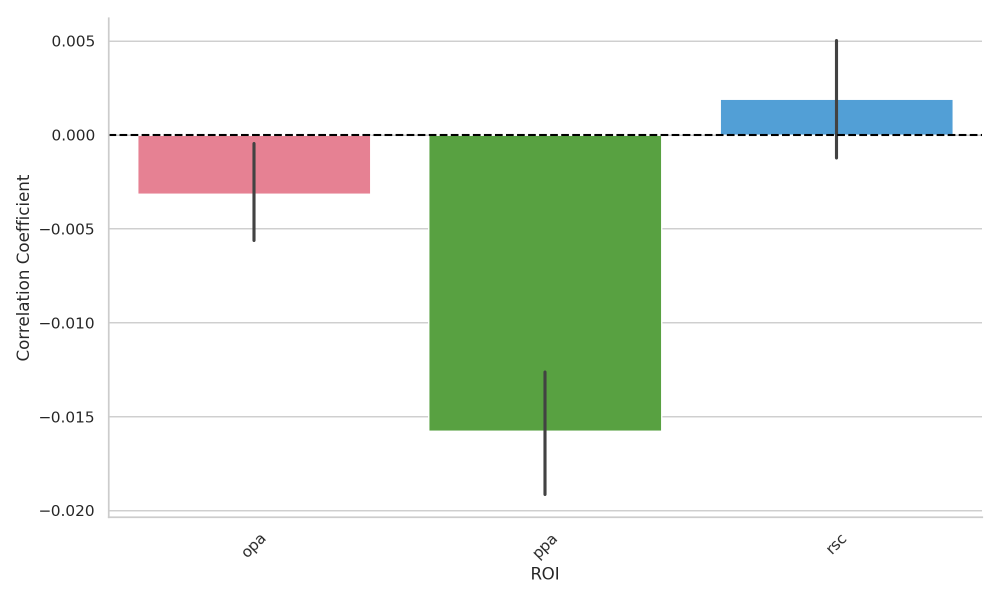

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



Plot saved: /gpfs01/bartels/group/lheinemann/saliency-nsd-pub/results/Plots_Correlation_nsd_all_shared1000/subj06/floc_bodies_rois_barplot.png


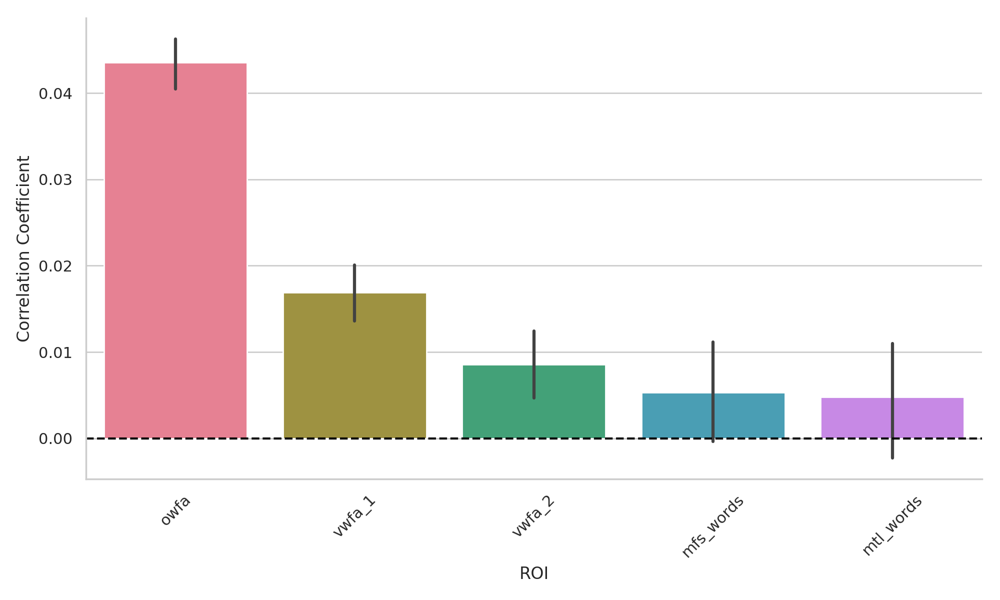

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



Plot saved: /gpfs01/bartels/group/lheinemann/saliency-nsd-pub/results/Plots_Correlation_nsd_all_shared1000/subj06/ventral_temporal_rois_barplot.png


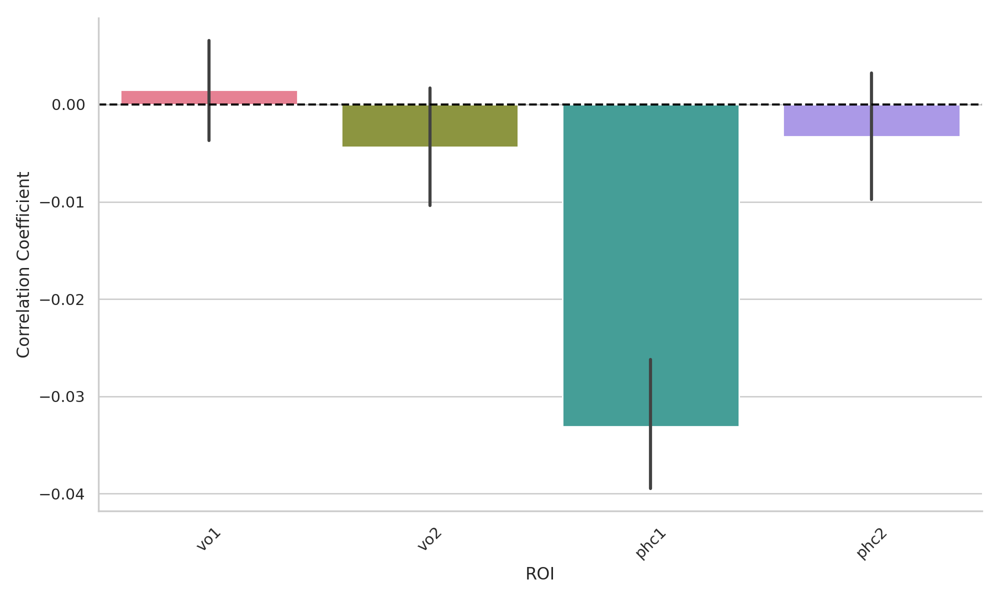

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



Plot saved: /gpfs01/bartels/group/lheinemann/saliency-nsd-pub/results/Plots_Correlation_nsd_all_shared1000/subj06/dorso_lateral_rois_barplot.png


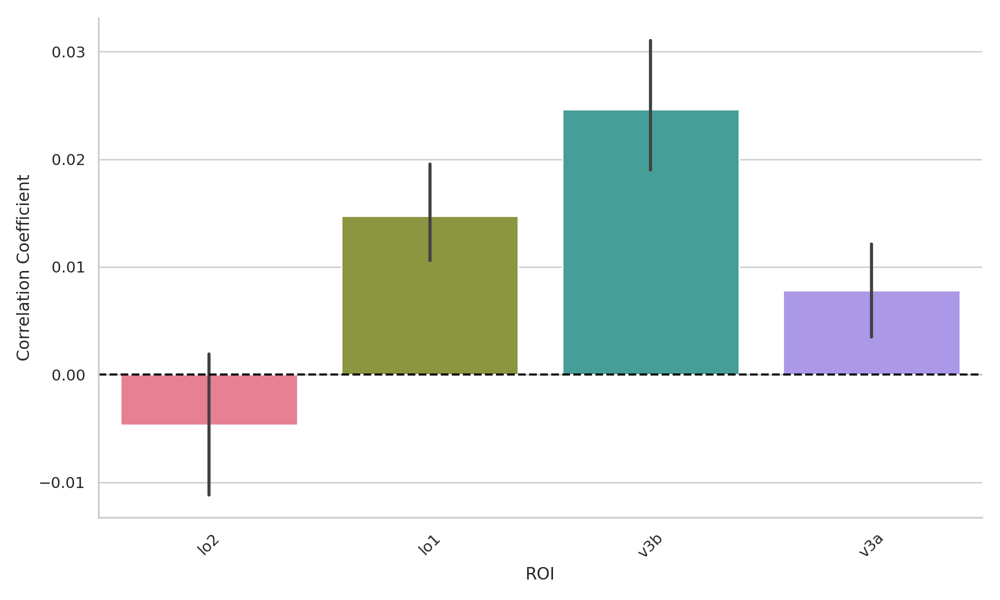

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

/tmp/ipykernel_1386843/4223777533.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



Plot saved: /gpfs01/bartels/group/lheinemann/saliency-nsd-pub/results/Plots_Correlation_nsd_all_shared1000/subj06/parietal_frontal_rois_barplot.png


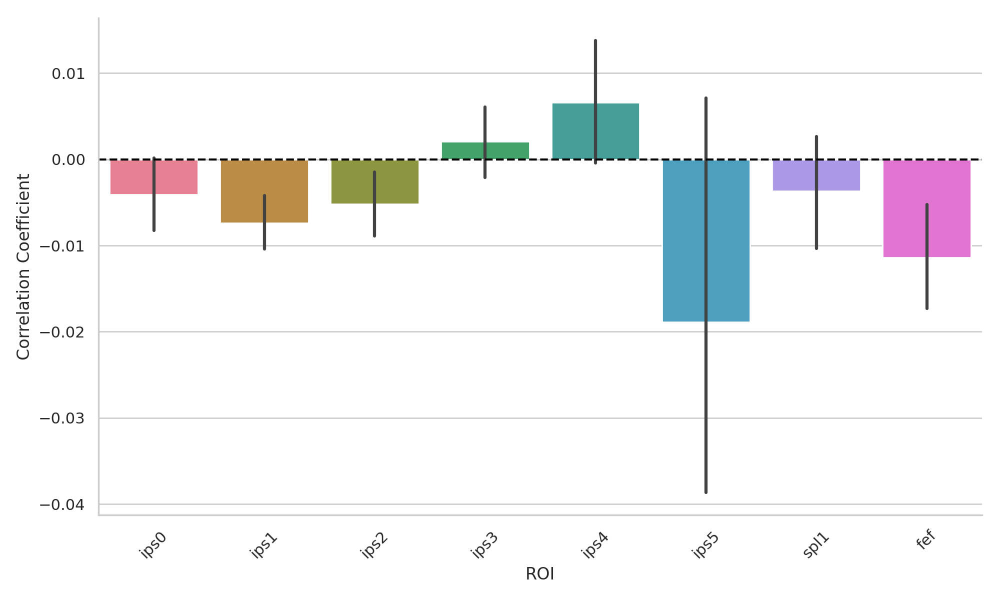

In [ ]:
# Load the DataFrame if not already loaded
# Replace 'path_to_corr_df_subj_all_rois.csv' with the actual path to your saved DataFrame
try:
    if sal_model == 'GroundTruthEyeTracking':
        #corr_df_subj_all_rois = pd.read_csv(DATA_PATH_subj / f'corr_mat_all_rois_subj0{sub_num}.npy')
        corr_df = corr_df_subj_all_rois 
    elif sal_model == 'AllFixations':
        #corr_df_subj_all_rois_allfixations = pd.read_csv(DATA_PATH_subj / f'corr_mat_all_rois_allfixations_subj0{sub_num}.npy')
        corr_df = corr_df_subj_all_rois_allfixations
    elif sal_model == 'DeepGaze':
        corr_df = corr_df_subj_all_rois_deepgaze
    print("DataFrame loaded successfully.")
except FileNotFoundError:
    print("DataFrame file not found. Please ensure the file exists and the path is correct.")

# Define ROI categories
roi_categories = {
    "Visual ROIs": ["v1", "v2", "v3", "v4"],
    "FLOC Faces ROIs": ["ofa", "ffa1", "ffa2", "atl"],
    "FLOC Words ROIs": ["eba", "fba1", "fba2"],
    "FLOC Places ROIs": ["opa", "ppa", "rsc"],
    "FLOC Bodies ROIs": ["owfa", "vwfa_1", "vwfa_2", "mfs_words", "mtl_words"],
    "Ventral Temporal ROIs": ["vo1", "vo2", "phc1", "phc2"],
    "Dorso Lateral ROIs": ["v3a", "v3b", "lo2", "lo1"],
    "Parietal Frontal ROIs": ["ips0", "ips1", "ips2", "ips3", "ips4", "ips5", "spl1", "fef"]
}

# Iterate through each ROI category and generate bar plots
for category, roi_list in roi_categories.items():
    # Filter the DataFrame for the current ROI list
    df_filtered = corr_df[corr_df["ROI"].isin(roi_list)]
    
    # Ensure there is data to plot
    if df_filtered.empty:
        print(f"No data available for {category}. Skipping...")
        continue
    
    # Calculate correlation value (r) and p-value
    # r, p = pearsonr(df_filtered["ROI"].astype("category").cat.codes, df_filtered["corr_coeff"])
    
    # Create the bar plot
    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=df_filtered,
        x="ROI",
        y="corr_coeff",
        ci=95,  # Confidence interval of 0.95
        palette="husl",
        errorbar="sd"  # Show standard deviation
    )
    
    # Customize the plot
    #plt.title(f"{category} (r = {r:.2f}, p = {p:.3f})")
    plt.axhline(0, color="black", linestyle="--")  # Add a horizontal line at y=0
    plt.ylabel("Correlation Coefficient")
    plt.xlabel("ROI")
    plt.xticks(rotation=45)
    sns.despine()  # Remove the top and right spines

    # Save the Plots if not already saved 
    if sal_model == 'GroundTruthEyeTracking':
        plot_filename = RESULTS_PATH_subj / f"{category.replace(' ', '_').lower()}_barplot.png"
    elif sal_model == 'AllFixations':
        plot_filename = RESULTS_PATH_subj / f"{category.replace(' ', '_').lower()}_barplot_allfixations.png"
    elif sal_model == 'DeepGaze':
        plot_filename = RESULTS_PATH_subj / f"{category.replace(' ', '_').lower()}_barplot_deepgaze.png"
   
    plt.tight_layout()
    plt.savefig(plot_filename, dpi=300)
    print(f"Plot saved: {plot_filename}")

    # Show the plot
    plt.tight_layout()
    plt.show()

### Vertical plotting of barplots with a confidence interval of 95%

In [428]:
# Align the ROIs to context relevant sorting - from Early Vison Areas to Higher Order Visual Areas

# Define the order of ROIs based on the context

sorted_rois = [

    # Early visual areas - medial occipital
    'v1', 'v2', 'v3', 'v4',

    # Mid-level visual regions 
    'vo1', 'vo2', 'lo1', 'lo2',

    # Dorsal Regions
    'v3a', 'v3b',
    'hmt', 'mst',
    'ips0', 'ips1', 'ips2', 'ips3', 'ips4', 'ips5',

    # Higher-order processing areas 
    'spl1', 'phc1', 'phc2', 'fef', 
    #######################################################################
    # Higher-level visual areas (category selective: faces, bodies, words, places)
    'ofa', 'ffa1', 'ffa2', 'mtl_faces', 'atl', 'eba', 'fba1', 'fba2', 'mtl_bodies', 
    'owfa', 'vwfa_1', 'vwfa_2', 'mfs_words', 'mtl_words','opa', 'ppa', 'rsc',
    
]


/tmp/ipykernel_1386843/1681917811.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



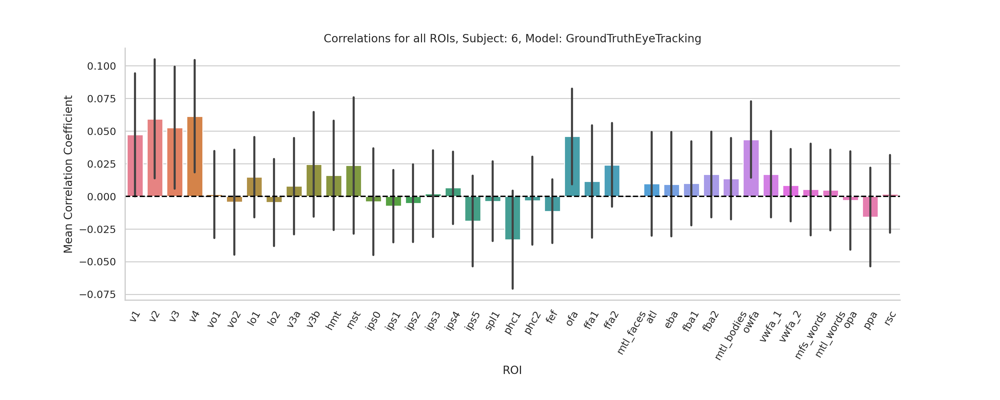

In [429]:
# Bar plot 
# Set the figure size
plt.figure(figsize=(15, 6))  # width and height adjustment

# Create the bar plot, showing the standard deviation with a confidence interval of 95 percent 
if sal_model == 'GroundTruthEyeTracking':
    g = sns.barplot(data=corr_df_subj_all_rois, x="ROI", y="corr_coeff", errorbar=('sd', 0.95), orient = "v", palette="husl", order = sorted_rois)
elif sal_model == 'AllFixations':
    g = sns.barplot(data=corr_df_subj_all_rois_allfixations, x="ROI", y="corr_coeff", errorbar=('sd', 0.95), orient = "v", palette="husl", order = sorted_rois)
elif sal_model == 'DeepGaze':
    g = sns.barplot(data=corr_df_subj_all_rois_deepgaze, x="ROI", y="corr_coeff", errorbar=('sd', 0.95), orient = "v", palette="husl", order = sorted_rois)
# Change the order of rois in the plot

# Customize the plot
sns.despine()  # Remove the top and right spines

g.axhline(0, color="black", linestyle="--")  # Add a horizontal line at y=0
g.set(title= f"Correlations for all ROIs, Subject: {sub_num}, Model: {sal_model}", ylabel="Mean Correlation Coefficient")  # Set the title and y-axis label

# Rotate x-axis labels for better readability
plt.xticks(rotation= 60)

# Add more white space to the lower margin
plt.subplots_adjust(bottom=0.25)

# Save the plot 
if sal_model == 'GroundTruthEyeTracking':
    plt.savefig(RESULTS_PATH_subj/ f'barplot_corr_all_rois_subject0{sub_num}.png', dpi=300, bbox_inches='tight')
elif sal_model == 'AllFixations':
    plt.savefig(RESULTS_PATH_subj/ f'barplot_corr_all_rois_allfixations_subject0{sub_num}.png', dpi=300, bbox_inches='tight')
elif sal_model == 'DeepGaze':  
    plt.savefig(RESULTS_PATH_subj/ f'barplot_corr_all_rois_deepgazeIIE_subject0{sub_num}.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


### Vertical plotting of swarmplots with a confidence interval of 95%

/tmp/ipykernel_1386843/4059216440.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 87.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 88.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 88.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinemann/miniconda3/envs/

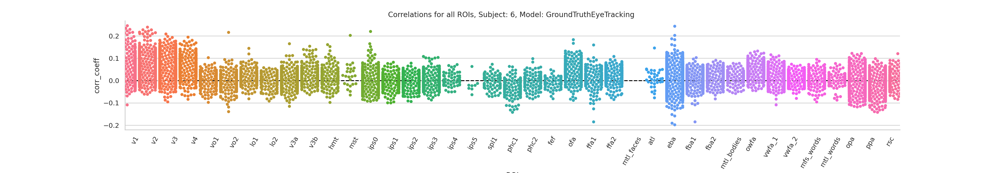

In [430]:
# Set the figure size (width, height)
#plt.figure(figsize=(4, 23))  # width and height adjustment
# width and height adjustment if plottetd vertically, then also change x and y axis
plt.figure(figsize=(23, 4)) 

if sal_model == 'GroundTruthEyeTracking':
    g = sns.swarmplot(data = corr_df_subj_all_rois, x = "ROI", y = "corr_coeff", orient = "v", palette="husl", order = sorted_rois, dodge= True)
elif sal_model == 'AllFixations':
    g = sns.swarmplot(data = corr_df_subj_all_rois_allfixations, x = "ROI", y = "corr_coeff", orient = "v", palette="husl", order = sorted_rois, dodge= True)
elif sal_model == 'DeepGaze':
    g = sns.swarmplot(data = corr_df_subj_all_rois_deepgaze, x = "ROI", y = "corr_coeff", orient = "v", palette="husl", order = sorted_rois, dodge= True)
# Customize the plot
sns.despine()  # Remove the top and right spines
# Plot a horizontal line at x=0 with axvline
g.axhline(0, color="black", linestyle="--")  # Add a vertical line at x=0
g.set(title= f"Correlations for all ROIs, Subject: {sub_num}, Model: {sal_model} ") 
# Rotate x-axis labels for better readability
plt.xticks(rotation=60)

# Add more white space to the lower margin
plt.subplots_adjust(bottom=0.25)

# Save the plot 
plt.savefig(RESULTS_PATH_subj/ f'swarm_corr_all_rois_subject0{sub_num}_{sal_model}.png', dpi=300, bbox_inches='tight')

plt.show()

/tmp/ipykernel_1386843/3349074739.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

/tmp/ipykernel_1386843/3349074739.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
/tmp/ipykernel_1386843/3349074739.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

/tmp/ipykernel_1386843/3349074739.py:36: UserWarning: FixedFormatter should only be used together with FixedLocator


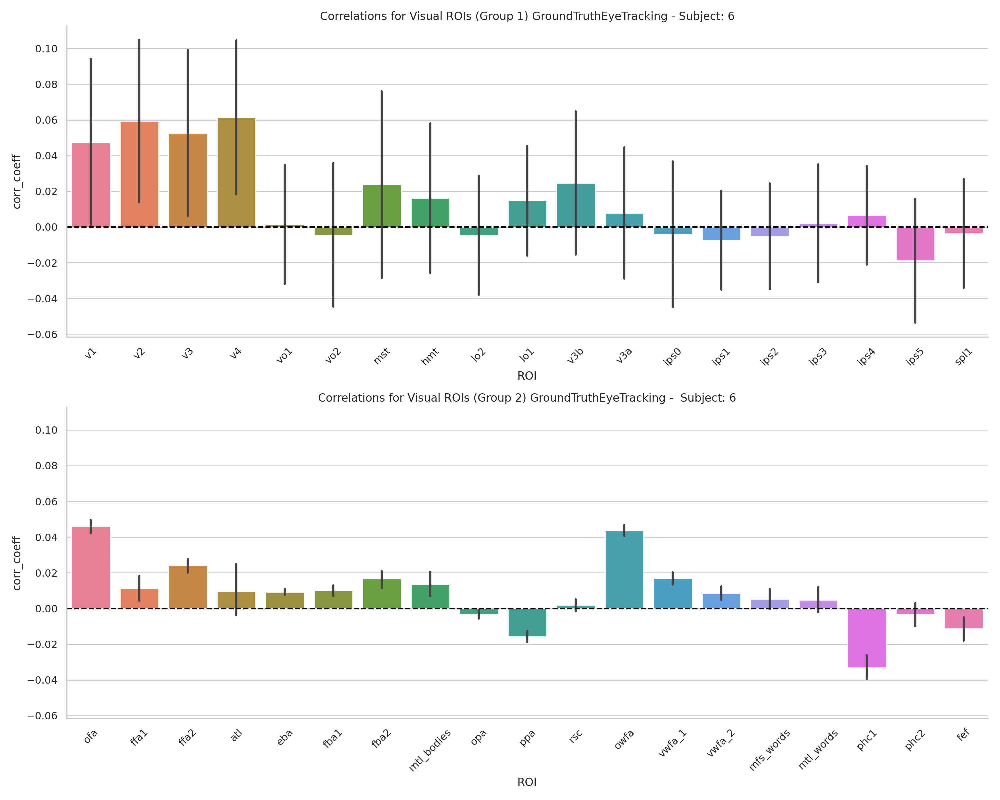

In [431]:
# Split the ROIs into two groups

if sal_model == 'GroundTruthEyeTracking':
    corr_df= corr_df_subj_all_rois
elif sal_model == 'AllFixations':
    corr_df = corr_df_subj_all_rois_allfixations
elif sal_model == 'DeepGaze':
    corr_df = corr_df_subj_all_rois_deepgaze

roi_list = sorted_rois
midpoint = len(roi_list) // 2
group1 = roi_list[:midpoint]
group2 = roi_list[midpoint:]

# Filter the DataFrame for each group
df_group1 = corr_df[corr_df["ROI"].isin(group1)]
df_group2 = corr_df[corr_df["ROI"].isin(group2)]

# Create two vertically stacked plots
fig, axes = plt.subplots(2, 1, figsize=(15, 12), sharey=True)  # Two rows, one column

# Plot for the first group
sns.barplot(data=df_group1, x="ROI", y="corr_coeff", errorbar=('sd', 0.95), orient = "v", palette = "husl", ax=axes[0])
# Customize the plot
sns.despine()  # Remove the top and right spines
axes[0].axhline(0, color="black", linestyle="--")
axes[0].set_title(f"Correlations for Visual ROIs (Group 1) {sal_model} - Subject: {sub_num}")
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)

# Plot for the second group
sns.barplot(data=df_group2, x="ROI", y="corr_coeff", palette = "husl", ax=axes[1])
# Customize the plot
sns.despine()  # Remove the top and right spines
axes[1].axhline(0, color="black", linestyle="--")
axes[1].set_title(f"Correlations for Visual ROIs (Group 2) {sal_model} -  Subject: {sub_num}")
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45)

# Save the plot 
plt.savefig(RESULTS_PATH_subj/ f'barplot_corr_all_rois_subject0{sub_num}_two_groups_{sal_model}.png', dpi=300, bbox_inches='tight')
# Adjust layout for better readability
plt.tight_layout()
plt.show()

/tmp/ipykernel_1386843/3433542686.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 76.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 79.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 75.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinemann/miniconda3/envs

/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 75.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 53.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 33.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinemann/miniconda3/envs/nsd-static-saliency/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 31.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
/gpfs01/bartels/user/lheinem

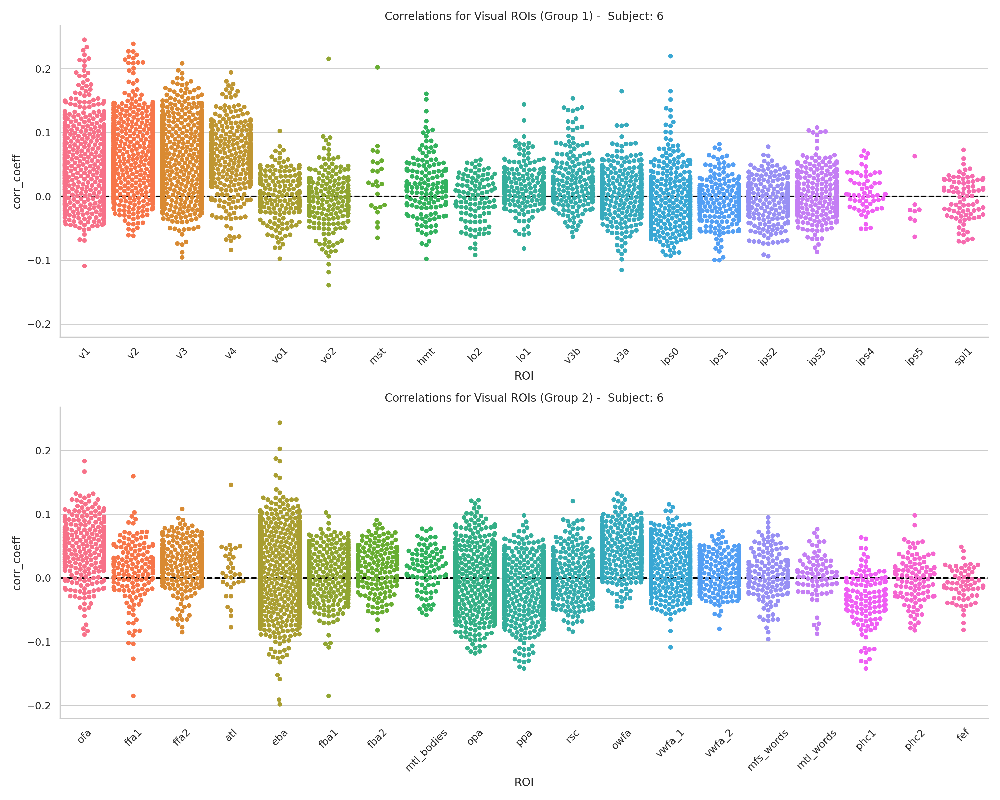

In [432]:
if sal_model == 'GroundTruthEyeTracking':
    corr_df = corr_df_subj_all_rois
elif sal_model == 'AllFixations':
    corr_df = corr_df_subj_all_rois_allfixations
elif sal_model == 'DeepGaze':
    corr_df = corr_df_subj_all_rois_deepgaze

# Split the ROIs into two groups
roi_list = sorted_rois
midpoint = len(roi_list) // 2
group1 = roi_list[:midpoint]
group2 = roi_list[midpoint:]

df_group1 = corr_df[corr_df["ROI"].isin(group1)]
df_group2 = corr_df[corr_df["ROI"].isin(group2)]

# Create two vertically stacked plots
fig, axes = plt.subplots(2, 1, figsize=(15, 12), sharey=True)  # Two rows, one column

# Plot for the first group
sns.swarmplot(data=df_group1, x="ROI", y="corr_coeff", palette = "husl", ax=axes[0])
# Customize the plot
sns.despine()  # Remove the top and right spines
axes[0].axhline(0, color="black", linestyle="--")
axes[0].set_title(f"Correlations for Visual ROIs (Group 1) -  Subject: {sub_num}")
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)

# Plot for the second group
sns.swarmplot(data=df_group2, x="ROI", y="corr_coeff", palette = "husl", ax=axes[1])
# Customize the plot
sns.despine()  # Remove the top and right spines
axes[1].axhline(0, color="black", linestyle="--")
axes[1].set_title(f"Correlations for Visual ROIs (Group 2) -  Subject: {sub_num}")
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45)

# Save the plot
plt.savefig(RESULTS_PATH_subj/ f'swarm_corr_all_rois_subject0{sub_num}_two_groups_{sal_model}.png', dpi=300, bbox_inches='tight')

# Adjust layout for better readability
plt.tight_layout()
plt.show()

In [433]:
if sal_model == 'GroundTruthEyeTracking':
    print(corr_df_subj_all_rois.head())  
    print(corr_df_subj_all_rois.info()) 
    print(corr_df_subj_all_rois["ROI"].unique()) 

elif sal_model == 'DeepGaze':
    
    print(corr_df_subj_all_rois_deepgaze.head())  # Display the first few rows
    print(corr_df_subj_all_rois_deepgaze.info())  # Check column names and data types
    print(corr_df_subj_all_rois_deepgaze["ROI"].unique())  # Check unique values in the "ROI" column

  ROI  corr_coeff   p_value
0  v1    0.002494  0.939252
1  v1   -0.011244  0.731187
2  v1    0.031419  0.336956
3  v1   -0.024113  0.461231
4  v1   -0.043554  0.183072
<class 'pandas.core.frame.DataFrame'>
Index: 13278 entries, 0 to 14094
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ROI         13278 non-null  object 
 1   corr_coeff  13278 non-null  float64
 2   p_value     13278 non-null  float64
dtypes: float64(2), object(1)
memory usage: 931.0+ KB
None
['v1' 'v2' 'v3' 'v4' 'ofa' 'ffa1' 'ffa2' 'atl' 'eba' 'fba1' 'fba2'
 'mtl_bodies' 'opa' 'ppa' 'rsc' 'owfa' 'vwfa_1' 'vwfa_2' 'mfs_words'
 'mtl_words' 'vo1' 'vo2' 'phc1' 'phc2' 'mst' 'hmt' 'lo2' 'lo1' 'v3b' 'v3a'
 'ips0' 'ips1' 'ips2' 'ips3' 'ips4' 'ips5' 'spl1' 'fef']


In [434]:
if sal_model == 'GroundTruthEyeTracking':
    print(corr_df_subj_all_rois.isnull().sum())  # Check for missing values
elif sal_model == 'DeepGaze':  
    print(corr_df_subj_all_rois_deepgaze.isnull().sum())  # Check for missing values

ROI           0
corr_coeff    0
p_value       0
dtype: int64


In [435]:
# Remove rows with NaN values in the "ROI" and "corr_coeff" columns (N=5 in corr_coeff)
if sal_model == 'GroundTruthEyeTracking':
    corr_df_subj_all_rois = corr_df_subj_all_rois.dropna(subset=["ROI", "corr_coeff"])
elif sal_model == 'DeepGaze':
    corr_df_subj_all_rois_deepgaze = corr_df_subj_all_rois_deepgaze.dropna(subset=["ROI", "corr_coeff"])

In [436]:
if sal_model == 'GroundTruthEyeTracking':
    print(corr_df_subj_all_rois["ROI"].value_counts())
elif sal_model == 'DeepGaze':
    print(corr_df_subj_all_rois_deepgaze["ROI"].value_counts())

ROI
eba           2197
v2            1013
v1             936
v3             925
opa            878
ppa            580
fba1           460
vwfa_1         431
v4             415
owfa           413
ips0           407
rsc            400
ofa            394
ips1           304
v3a            293
ips3           278
ffa2           278
ips2           249
vwfa_2         211
vo2            206
lo1            205
v3b            192
vo1            189
fba2           181
ffa1           160
hmt            159
mfs_words      142
phc1           131
phc2           106
lo2            105
mtl_bodies      88
spl1            84
mtl_words       79
fef             64
ips4            61
atl             32
mst             24
ips5             8
Name: count, dtype: int64
